Scroll to bottom for results! Email me @ wac6er@virginia.edu if you'd like the DF to run it yourself!!

In [ ]:
import yfinance as yf
import time
import pandas as pd

data = pd.read_csv('/content/live20.csv').iloc[:13000].reset_index(drop=True)

data_cleaned = data[data['Transaction_Date'].str.match(r'\d{1,2}/\d{1,2}/\d{4}')]

data_cleaned['Transaction_Date'] = pd.to_datetime(data_cleaned['Transaction_Date'])
data_cleaned['Reported_Date'] = pd.to_datetime(data_cleaned['Reported_Date'])

remaining_non_date_values = data_cleaned[~data_cleaned['Transaction_Date'].dt.strftime('%m/%d/%Y').str.match(r'\d{2}/\d{2}/\d{4}')]['Transaction_Date'].unique()

def compute_features(data, ticker, ref_date, days_back):
    start_date = ref_date - pd.Timedelta(days=days_back)
    filtered_data = data[(data['Ticker'] == ticker) &
                         (data['Reported_Date'] <= ref_date) &
                         (data['Reported_Date'] >= start_date)]

    buy_transactions = len(filtered_data[filtered_data['Transaction'] == 'A'])
    sell_transactions = len(filtered_data[filtered_data['Transaction'] == 'D'])
    total_buy_amount = filtered_data[filtered_data['Transaction'] == 'A']['Transaction_Amount'].sum()
    total_sell_amount = filtered_data[filtered_data['Transaction'] == 'D']['Transaction_Amount'].sum()
    net_amount = total_buy_amount - total_sell_amount
    average_transaction_amount = filtered_data['Transaction_Amount'].mean() if len(filtered_data) > 0 else 0

    return buy_transactions, sell_transactions, total_buy_amount, total_sell_amount, net_amount, average_transaction_amount

try:
  #data_cleaned['Stock_Quantity'] = data_cleaned['Stock_Quantity'].str.replace(',', '').astype(float)
  data_cleaned['Transaction_Amount'] = data_cleaned['Stock_Quantity'] * data_cleaned['Stock_Price']
except:
  data_cleaned['Stock_Quantity'] = data_cleaned['Stock_Quantity'].str.replace(',', '').astype(float)
  data_cleaned['Stock_Price'] = data_cleaned['Stock_Price'].str.replace(',', '').astype(float)
  problematic_indices = []
  for idx, row in data_cleaned.iterrows():
      try:
          _ = float(row['Stock_Quantity']) * float(row['Stock_Price'])
      except TypeError:
          problematic_indices.append(idx)
  data_cleaned = data_cleaned.drop(problematic_indices)
  data_cleaned['Transaction_Amount'] = data_cleaned['Stock_Quantity'] * data_cleaned['Stock_Price']

data_cleaned['buy_transactions_30d'], data_cleaned['sell_transactions_30d'], data_cleaned['total_buy_amount_30d'], \
data_cleaned['total_sell_amount_30d'], data_cleaned['net_amount_30d'], data_cleaned['avg_transaction_amount_30d'] = \
zip(*data_cleaned.apply(lambda row: compute_features(data_cleaned, row['Ticker'], row['Reported_Date'], 30), axis=1))

data_cleaned['buy_transactions_7d'], data_cleaned['sell_transactions_7d'], data_cleaned['total_buy_amount_7d'], \
data_cleaned['total_sell_amount_7d'], data_cleaned['net_amount_7d'], data_cleaned['avg_transaction_amount_7d'] = \
zip(*data_cleaned.apply(lambda row: compute_features(data_cleaned, row['Ticker'], row['Reported_Date'], 7), axis=1))

data_cleaned['buy_transactions_90d'], data_cleaned['sell_transactions_90d'], data_cleaned['total_buy_amount_90d'], \
data_cleaned['total_sell_amount_90d'], data_cleaned['net_amount_90d'], data_cleaned['avg_transaction_amount_90d'] = \
zip(*data_cleaned.apply(lambda row: compute_features(data_cleaned, row['Ticker'], row['Reported_Date'], 90), axis=1))

data_cleaned['buy_transactions_0d'], data_cleaned['sell_transactions_0d'], data_cleaned['total_buy_amount_0d'], \
data_cleaned['total_sell_amount_0d'], data_cleaned['net_amount_0d'], data_cleaned['avg_transaction_amount_0d'] = \
zip(*data_cleaned.apply(lambda row: compute_features(data_cleaned, row['Ticker'], row['Reported_Date'], 0), axis=1))

df = data_cleaned

df['Transaction_Date'] = pd.to_datetime(df['Transaction_Date'])
df['Reported_Date'] = pd.to_datetime(df['Reported_Date'])

def calculate_return(ticker, start_date, end_date):
    data = yf.download(ticker, start=start_date, end=end_date)
    if not data.empty:
        return (data['Close'].iloc[-1] - data['Close'].iloc[0]) / data['Close'].iloc[0]
    return None

for idx, row in df.iterrows():
  try:
    ticker = row['Ticker']
    trans_date = row['Transaction_Date']
    report_date = row['Reported_Date']

    df.at[idx, 'Return_1Week_Before_Trans'] = calculate_return(ticker, trans_date - pd.DateOffset(weeks=1), trans_date)
    df.at[idx, 'Return_1Month_Before_Trans'] = calculate_return(ticker, trans_date - pd.DateOffset(months=1), trans_date)
    df.at[idx, 'Return_3Months_Before_Trans'] = calculate_return(ticker, trans_date - pd.DateOffset(months=3), trans_date)

    df.at[idx, 'Return_1Week_After_Report'] = calculate_return(ticker, report_date, report_date + pd.DateOffset(weeks=1))
    df.at[idx, 'Return_2Weeks_After_Report'] = calculate_return(ticker, report_date, report_date + pd.DateOffset(weeks=2))
    df.at[idx, 'Return_3Weeks_After_Report'] = calculate_return(ticker, report_date, report_date + pd.DateOffset(weeks=3))
    df.at[idx, 'Return_1Month_After_Report'] = calculate_return(ticker, report_date, report_date + pd.DateOffset(months=1))
  except:
    time.sleep(5)
    print('error')

df.to_csv("updated_dataset5.csv")

<ipython-input-2-c3a51cf204f1>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['Transaction_Date'] = pd.to_datetime(data_cleaned['Transaction_Date'])
<ipython-input-2-c3a51cf204f1>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_cleaned['Reported_Date'] = pd.to_datetime(data_cleaned['Reported_Date'])
<ipython-input-2-c3a51cf204f1>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-10-27 00:00:00)')



[*********************100%%**********************]  1 of 1 completed


ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-03 00:00:00)')


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-10 00:00:00)')


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-20 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-10-27 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-03 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-10 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-20 00:00:00)



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-20 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-10-27 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-10 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-20 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-10-27 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-03 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-10 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-20 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-10-27 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-03 00:00:00)



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-03 00:00:00)')


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-10 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-20 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-10-27 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-03 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-20 00:00:00 -> 2023-11-20 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-10-26 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-02 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-09 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-19 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-10-26 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-02 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-09 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-19 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-10-26 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-02 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-09 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-19 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-10-26 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-02 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-09 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-19 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-10-26 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-02 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-09 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-19 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-10-26 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-02 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-09 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-19 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-10-26 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-02 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-09 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-19 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-10-26 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-02 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-09 00:00:00)')



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['EMAN']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2023-10-19 00:00:00 -> 2023-11-19 00:00:00)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LCW']: Exception("%ticker%: Data doesn't exist for startDate = 1633492800, endDate = 1634097600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LCW']: Exception("%ticker%: Data doesn't exist for startDate = 1631505600, endDate = 1634097600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['LCW']: Exception("%ticker%: Data doesn't exist for startDate = 1626148800, endDate = 1634097600")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1451970000, endDate = 1452574800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1449896400, endDate = 1452574800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1444622400, endDate = 1452574800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1452056400, endDate = 1452661200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1449982800, endDate = 1452661200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1444708800, endDate = 1452661200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1485147600, endDate = 1485752400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1483074000, endDate = 1485752400")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1477800000, endDate = 1485752400")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1489035600, endDate = 1489636800")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1487221200, endDate = 1489636800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1481864400, endDate = 1489636800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1540267200, endDate = 1540872000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1538280000, endDate = 1540872000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1532923200, endDate = 1540872000")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1555560000, endDate = 1556164800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1553486400, endDate = 1556164800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1548392400, endDate = 1556164800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1591329600, endDate = 1591934400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1589256000, endDate = 1591934400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1583985600, endDate = 1591934400")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1603080000, endDate = 1603684800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1601092800, endDate = 1603684800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Data doesn't exist for startDate = 1595736000, endDate = 1603684800



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1595736000, endDate = 1603684800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1608094800, endDate = 1608699600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1606107600, endDate = 1608699600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1600833600, endDate = 1608699600")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1610946000, endDate = 1611550800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1608872400, endDate = 1611550800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1603598400, endDate = 1611550800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1612933200, endDate = 1613538000")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1610859600, endDate = 1613538000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1605589200, endDate = 1613538000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1614661200, endDate = 1615266000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1612846800, endDate = 1615266000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1607490000, endDate = 1615266000")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1614747600, endDate = 1615352400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1612933200, endDate = 1615352400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1607576400, endDate = 1615352400")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1615266000, endDate = 1615867200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1613451600, endDate = 1615867200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1608094800, endDate = 1615867200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1623816000, endDate = 1624420800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1621742400, endDate = 1624420800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1616472000, endDate = 1624420800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1641877200, endDate = 1642482000")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1639803600, endDate = 1642482000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1634529600, endDate = 1642482000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1645419600, endDate = 1646024400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1643346000, endDate = 1646024400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1638075600, endDate = 1646024400")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1658116800, endDate = 1658721600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1656129600, endDate = 1658721600")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1650859200, endDate = 1658721600")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1663560000, endDate = 1664164800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1661486400, endDate = 1664164800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1656216000, endDate = 1664164800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1665115200, endDate = 1665720000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1663128000, endDate = 1665720000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1657771200, endDate = 1665720000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1667361600, endDate = 1667970000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1665288000, endDate = 1667970000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1660017600, endDate = 1667970000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536638400, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534564800, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529294400, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1478840400, endDate = 1479445200")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1476763200, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1471492800, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1478840400, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1476763200, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1471492800, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1478840400, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1476763200, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1471492800, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1478840400, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1476763200, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1471492800, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1489035600, endDate = 1489636800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1487221200, endDate = 1489636800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1481864400, endDate = 1489636800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1489723200, endDate = 1490328000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1487912400, endDate = 1490328000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1482555600, endDate = 1490328000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1490068800, endDate = 1490673600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1488258000, endDate = 1490673600")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1482901200, endDate = 1490673600")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1490068800, endDate = 1490673600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1488258000, endDate = 1490673600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1482901200, endDate = 1490673600")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1490068800, endDate = 1490673600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1488258000, endDate = 1490673600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1482901200, endDate = 1490673600")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1490068800, endDate = 1490673600")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1488258000, endDate = 1490673600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1482901200, endDate = 1490673600")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1491796800, endDate = 1492401600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1489723200, endDate = 1492401600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1484629200, endDate = 1492401600")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1507608000, endDate = 1508212800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1505620800, endDate = 1508212800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1500264000, endDate = 1508212800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1507608000, endDate = 1508212800")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1505620800, endDate = 1508212800")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1500264000, endDate = 1508212800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1507608000, endDate = 1508212800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1505620800, endDate = 1508212800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1500264000, endDate = 1508212800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1507608000, endDate = 1508212800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1505620800, endDate = 1508212800")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1500264000, endDate = 1508212800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1521086400, endDate = 1521691200")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1519275600, endDate = 1521691200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1513918800, endDate = 1521691200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1521086400, endDate = 1521691200")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1519275600, endDate = 1521691200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1513918800, endDate = 1521691200")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1521086400, endDate = 1521691200")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1519275600, endDate = 1521691200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1513918800, endDate = 1521691200")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1521086400, endDate = 1521691200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1519275600, endDate = 1521691200")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1513918800, endDate = 1521691200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1523246400, endDate = 1523851200")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1521172800, endDate = 1523851200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1516078800, endDate = 1523851200")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1523246400, endDate = 1523851200")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1521172800, endDate = 1523851200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1516078800, endDate = 1523851200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1523246400, endDate = 1523851200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1521172800, endDate = 1523851200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1516078800, endDate = 1523851200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1528257600, endDate = 1528862400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1526184000, endDate = 1528862400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1520913600, endDate = 1528862400")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536552000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534478400, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529208000, endDate = 1537156800")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536552000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534478400, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529208000, endDate = 1537156800")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536552000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534478400, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529208000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536552000, endDate = 1537156800")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534478400, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529208000, endDate = 1537156800")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536638400, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534564800, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529294400, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536638400, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534564800, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529294400, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536638400, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534564800, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529294400, endDate = 1537243200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1582088400, endDate = 1582693200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1580014800, endDate = 1582693200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Data doesn't exist for startDate = 1574744400, endDate = 1582693200



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1574744400, endDate = 1582693200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1603080000, endDate = 1603684800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1601092800, endDate = 1603684800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1595736000, endDate = 1603684800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1603080000, endDate = 1603684800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1601092800, endDate = 1603684800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1595736000, endDate = 1603684800")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1612933200, endDate = 1613538000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1610859600, endDate = 1613538000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1605589200, endDate = 1613538000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1615093200, endDate = 1615698000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1613278800, endDate = 1615698000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1607922000, endDate = 1615698000")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1641963600, endDate = 1642568400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1639890000, endDate = 1642568400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1634616000, endDate = 1642568400")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1643778000, endDate = 1644382800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1641704400, endDate = 1644382800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1636434000, endDate = 1644382800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1645419600, endDate = 1646024400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1643346000, endDate = 1646024400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1638075600, endDate = 1646024400")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1649304000, endDate = 1649908800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1647230400, endDate = 1649908800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1642136400, endDate = 1649908800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1658116800, endDate = 1658721600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1656129600, endDate = 1658721600")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1650859200, endDate = 1658721600")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1662955200, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1660881600, endDate = 1663560000")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1655611200, endDate = 1663560000")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1662955200, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1660881600, endDate = 1663560000")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1655611200, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1662955200, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1660881600, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1655611200, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1662955200, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1660881600, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1655611200, endDate = 1663560000")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1663560000, endDate = 1664164800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1661486400, endDate = 1664164800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1656216000, endDate = 1664164800")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1665115200, endDate = 1665720000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1663128000, endDate = 1665720000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1657771200, endDate = 1665720000")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1665115200, endDate = 1665720000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1663128000, endDate = 1665720000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1657771200, endDate = 1665720000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1667361600, endDate = 1667970000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1665288000, endDate = 1667970000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1660017600, endDate = 1667970000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1667361600, endDate = 1667970000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1665288000, endDate = 1667970000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1660017600, endDate = 1667970000")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1478840400, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1476763200, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1471492800, endDate = 1479445200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1451970000, endDate = 1452574800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1449896400, endDate = 1452574800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1444622400, endDate = 1452574800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1452056400, endDate = 1452661200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1449982800, endDate = 1452661200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1444708800, endDate = 1452661200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1485234000, endDate = 1485838800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1483160400, endDate = 1485838800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1477886400, endDate = 1485838800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1489035600, endDate = 1489636800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1487221200, endDate = 1489636800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Data doesn't exist for startDate = 1481864400, endDate = 1489636800



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1481864400, endDate = 1489636800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534737600, endDate = 1535342400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1532664000, endDate = 1535342400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1527393600, endDate = 1535342400")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536552000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534478400, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529208000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536552000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534478400, endDate = 1537156800")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529208000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536552000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534478400, endDate = 1537156800")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529208000, endDate = 1537156800")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1536552000, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1534478400, endDate = 1537156800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1529208000, endDate = 1537156800")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1556251200, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1554264000, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1549170000, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1556251200, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1554264000, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1549170000, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1556251200, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1554264000, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1549170000, endDate = 1556856000")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1556251200, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1554264000, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1549170000, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1556251200, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1554264000, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1549170000, endDate = 1556856000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1568001600, endDate = 1568606400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1565928000, endDate = 1568606400")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1560657600, endDate = 1568606400")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1568088000, endDate = 1568692800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1566014400, endDate = 1568692800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1560744000, endDate = 1568692800")


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1572494400, endDate = 1573102800")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1570420800, endDate = 1573102800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1565150400, endDate = 1573102800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1572494400, endDate = 1573102800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1570420800, endDate = 1573102800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1565150400, endDate = 1573102800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1573534800, endDate = 1574139600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1571457600, endDate = 1574139600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1566187200, endDate = 1574139600")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1590638400, endDate = 1591243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1588564800, endDate = 1591243200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1583298000, endDate = 1591243200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1608094800, endDate = 1608699600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1606107600, endDate = 1608699600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1600833600, endDate = 1608699600")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1608094800, endDate = 1608699600")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1606107600, endDate = 1608699600")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1600833600, endDate = 1608699600")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:


ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1610946000, endDate = 1611550800")


[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1608872400, endDate = 1611550800")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1603598400, endDate = 1611550800")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1615266000, endDate = 1615867200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1613451600, endDate = 1615867200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1608094800, endDate = 1615867200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1641272400, endDate = 1641877200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1639198800, endDate = 1641877200")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1633924800, endDate = 1641877200")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1641877200, endDate = 1642482000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1639803600, endDate = 1642482000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1634529600, endDate = 1642482000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1662955200, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1660881600, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['PP']: Exception("%ticker%: Data doesn't exist for startDate = 1655611200, endDate = 1663560000")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOBQW']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOBQW']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOBQW']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOBQW']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOBQW']: Period 'max' is invalid, must be one of ['1d', '5d']



[*********************100%%**********************]  1 of 1 completed

ERROR:yfinance:
1 Failed download:
ERROR:yfinance:['MOBQW']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
error
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%

In [ ]:
import pandas as pd
data = pd.read_csv('/content/NYSE.csv').drop_duplicates(subset = ['Transaction_Date','avg_transaction_amount_7d','Return_1Week_Before_Trans','Return_1Month_Before_Trans']).dropna(subset=['Return_1Week_Before_Trans'])
data.dropna(subset=['Return_1Week_Before_Trans']).to_csv('live_ticks.csv')
print(len(data))
def create_label(return_value):
    if return_value < -0.05:
        return 0
    elif -0.05 <= return_value <= 0.05:
        return 1
    else:
        return 2

columns_to_drop = [
    "Unnamed: 0", "Unnamed: 0.1", "Transaction_Date", "Reported_Date",
    "Return_1Week_After_Report","Return_3Weeks_After_Report", "Return_1Month_After_Report"
]

'''
columns_to_drop = [
    "Unnamed: 0", "Unnamed: 0.1", "Transaction_Date", "Reported_Date",
    "Return_1Week_Before_Trans", "Return_1Month_Before_Trans",
    "Return_3Months_Before_Trans", "Return_1Week_After_Report",
    "Return_3Weeks_After_Report", "Return_1Month_After_Report"
]
'''
data_cleaned = data[pd.to_datetime(data["Reported_Date"]) <= "2023-10-01"]

data_cleaned = data_cleaned.drop(columns=columns_to_drop)
data_cleaned = data_cleaned.dropna(subset=['Return_2Weeks_After_Report','Return_1Month_Before_Trans','Return_3Months_Before_Trans','Return_1Week_Before_Trans'])
data_cleaned["Label"] = data_cleaned["Return_2Weeks_After_Report"].apply(create_label)
data_cleaned = data_cleaned.drop(columns=["Return_2Weeks_After_Report"])
data_cleaned['Quantity_After'] = data_cleaned['Quantity_After'].str.replace(',', '').astype(float)
ticker_related_columns = [col for col in data_cleaned.columns if "Ticker_" in col]
security_type_related_columns = [col for col in data_cleaned.columns if "Security_Type_" in col]
data_cleaned = data_cleaned.drop(columns=ticker_related_columns + security_type_related_columns + ['Form_Link', 'Ticker', 'Security_Type'])

102994


In [ ]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

param_dist = {
    'n_estimators': [100, 300,500,1000],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [None] + list(np.arange(10, 110, 10)),
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False],
    'criterion': ['gini', 'entropy']
}

rf = RandomForestClassifier()

rf_random_search = RandomizedSearchCV(rf, param_distributions=param_dist, n_iter=10, cv=3, verbose=2, random_state=42, n_jobs=-1)

rf_random_search.fit(X_train_encoded, y_train_under)

print("Best hyperparameters:", rf_random_search.best_params_)

best_rf = rf_random_search.best_estimator_
y_pred = best_rf.predict(X_test_encoded)
accuracy = accuracy_score(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print(class_report)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils import resample
import pandas as pd

X = data_cleaned.drop(columns=["Label"])
y = data_cleaned["Label"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

df_train = pd.concat([X_train, y_train], axis=1)
df_class_0 = df_train[df_train['Label'] == 0]
df_class_1 = df_train[df_train['Label'] == 1]
df_class_2 = df_train[df_train['Label'] == 2]

df_class_1_under = resample(df_class_1, replace=False, n_samples=len(df_class_0), random_state=42)
df_class_2_under = resample(df_class_2, replace=True, n_samples=len(df_class_0), random_state=42)

df_train_under = pd.concat([df_class_0, df_class_1_under, df_class_2_under])

X_train_under = df_train_under.drop(columns=["Label"])
y_train_under = df_train_under["Label"]

X_train_encoded = pd.get_dummies(X_train_under, columns=['Transaction', 'Transaction_Type', 'Ownership_Type', 'Futures_Contract_Added'])
X_test_encoded = pd.get_dummies(X_test, columns=['Transaction', 'Transaction_Type', 'Ownership_Type', 'Futures_Contract_Added'])

missing_cols = set(X_train_encoded.columns) - set(X_test_encoded.columns)
for col in missing_cols:
    X_test_encoded[col] = 0
X_test_encoded = X_test_encoded[X_train_encoded.columns]

best_rf = RandomForestClassifier(
    n_estimators=1000,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='auto',
    max_depth=50,
    criterion='gini',
    bootstrap=False
)

best_rf.fit(X_train_encoded, y_train_under)
y_pred = best_rf.predict(X_test_encoded)
accuracy = accuracy_score(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print(class_report)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy: 0.6140446111330439
              precision    recall  f1-score   support

           0       0.42      0.69      0.53      4692
           1       0.74      0.70      0.72     11108
           2       0.67      0.32      0.44      4464

    accuracy                           0.61     20264
   macro avg       0.61      0.57      0.56     20264
weighted avg       0.65      0.61      0.61     20264



In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

n_trees_to_plot = 3
for tree_in_forest in best_rf.estimators_[:n_trees_to_plot]:
    plt.figure(figsize=(20,10))
    plot_tree(tree_in_forest, filled=True, max_depth=3, feature_names=X_train_encoded.columns)
    plt.show()

In [ ]:
y_pred_proba = best_rf.predict_proba(X_test_encoded)
import numpy as np
threshold = 0.9
high_conf_indices = np.where(y_pred_proba.max(axis=1) >= threshold)
y_pred_filtered = y_pred[high_conf_indices]
y_test_filtered = y_test.iloc[high_conf_indices]

accuracy_filtered = accuracy_score(y_test_filtered, y_pred_filtered)
class_report_filtered = classification_report(y_test_filtered, y_pred_filtered)

print(accuracy_filtered)
print(class_report_filtered)

from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test_filtered, y_pred_filtered)

correct_predictions = np.diag(conf_matrix)

incorrect_predictions = conf_matrix.sum(axis=1) - correct_predictions

for i, (correct, incorrect) in enumerate(zip(correct_predictions, incorrect_predictions)):
    print(f"Class {i}:")
    print(f"  Correct predictions: {correct}")
    print(f"  Incorrect predictions: {incorrect}")
    print("------")

for i in range(conf_matrix.shape[0]):
    tp = conf_matrix[i, i]
    fp = conf_matrix[:, i].sum() - tp
    fn = conf_matrix[i, :].sum() - tp
    tn = conf_matrix.sum() - (tp + fp + fn)

    print(f"Class {i}:")
    print(f"  True Positives: {tp}")
    print(f"  False Positives: {fp}")
    print(f"  True Negatives: {tn}")
    print(f"  False Negatives: {fn}")
    print("------")

0.9905511811023622
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       196
           1       0.99      0.99      0.99       344
           2       1.00      0.97      0.98        95

    accuracy                           0.99       635
   macro avg       0.99      0.99      0.99       635
weighted avg       0.99      0.99      0.99       635

Class 0:
  Correct predictions: 195
  Incorrect predictions: 1
------
Class 1:
  Correct predictions: 342
  Incorrect predictions: 2
------
Class 2:
  Correct predictions: 92
  Incorrect predictions: 3
------
Class 0:
  True Positives: 195
  False Positives: 2
  True Negatives: 437
  False Negatives: 1
------
Class 1:
  True Positives: 342
  False Positives: 4
  True Negatives: 287
  False Negatives: 2
------
Class 2:
  True Positives: 92
  False Positives: 0
  True Negatives: 540
  False Negatives: 3
------


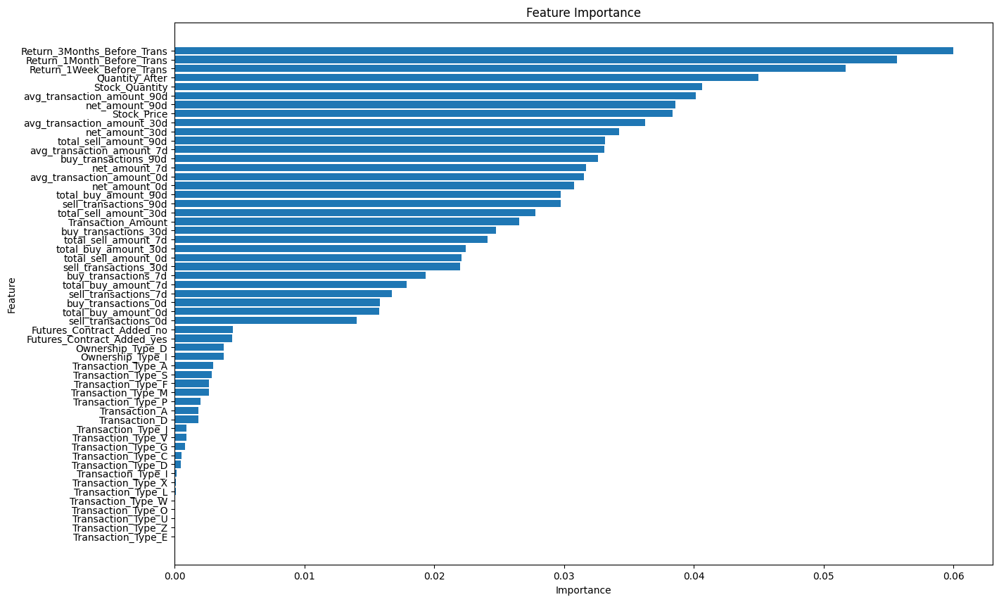

In [ ]:
import matplotlib.pyplot as plt

importances = best_rf.feature_importances_
feature_names = X_test_encoded.columns
feature_importance_pairs = list(zip(feature_names, importances))
feature_importance_pairs.sort(key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_importances = zip(*feature_importance_pairs)

plt.figure(figsize=(15, 10))
plt.barh(sorted_feature_names, sorted_importances)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.gca().invert_yaxis()  # To display the most important features at the top
plt.show()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.251 0.577 0.172]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.118 0

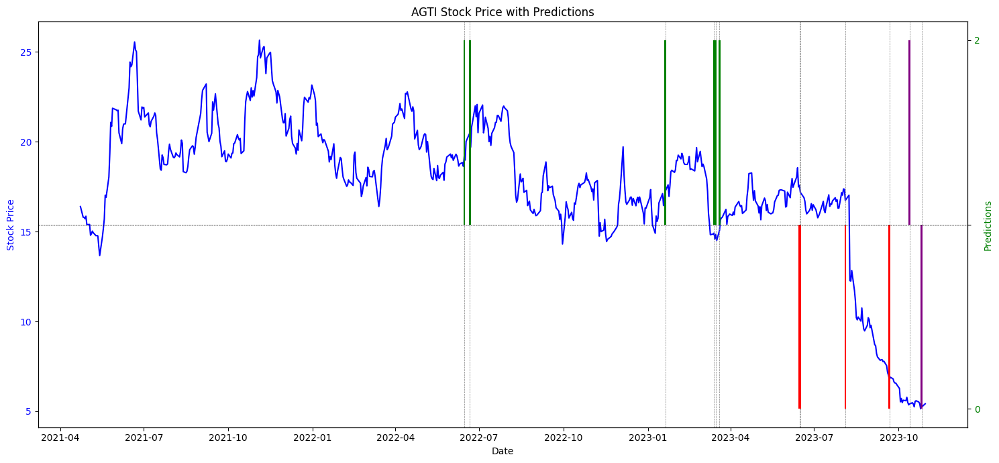

[[0.249 0.571 0.18 ]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for AIG. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[********

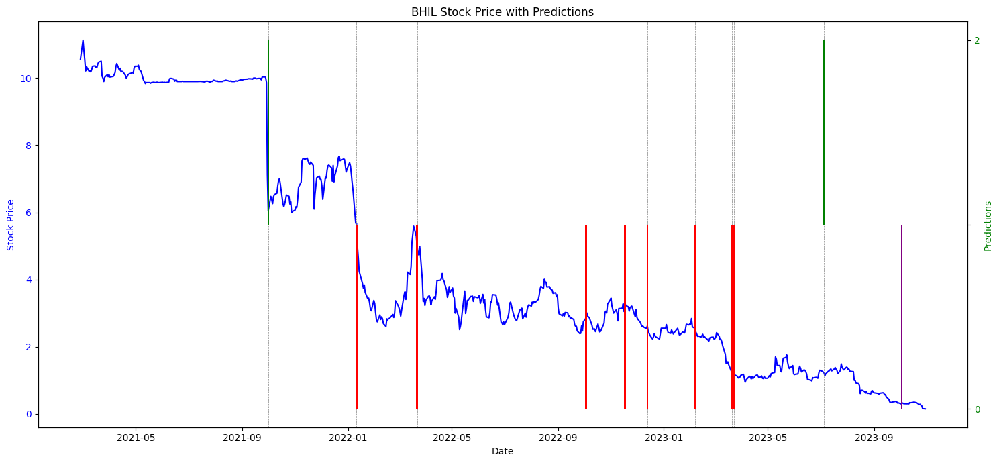

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.265 0.694 0.041]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.221 0.581 0.198]
 [0.222 0.559 0.219]
 [0.208 0.575 0.217]
 [0.231 0.567 0.202]
 [0.246 0.566 0.188]
 [0.258 0.648 0.094]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.361 0.581 0.058]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1

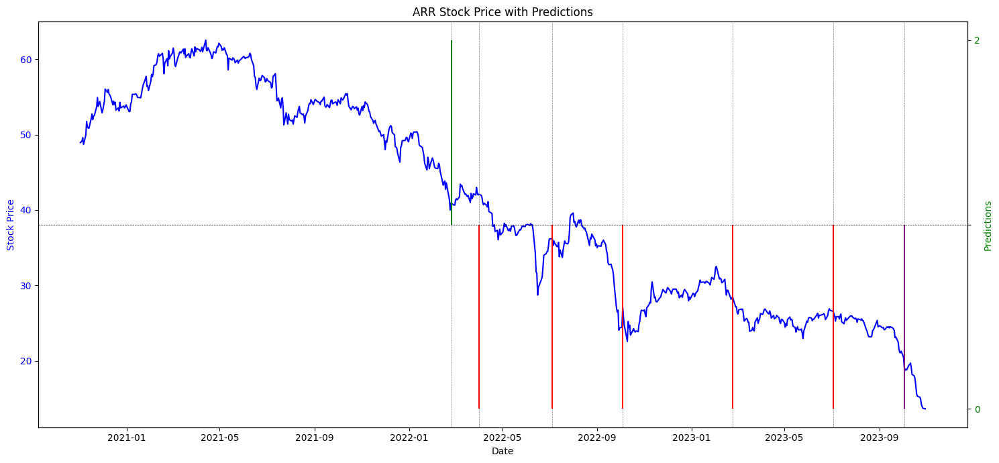

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.225 0.664 0.111]]
[*********************100%%**********************]  1 of 1 completed
Error with: ASBA. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**

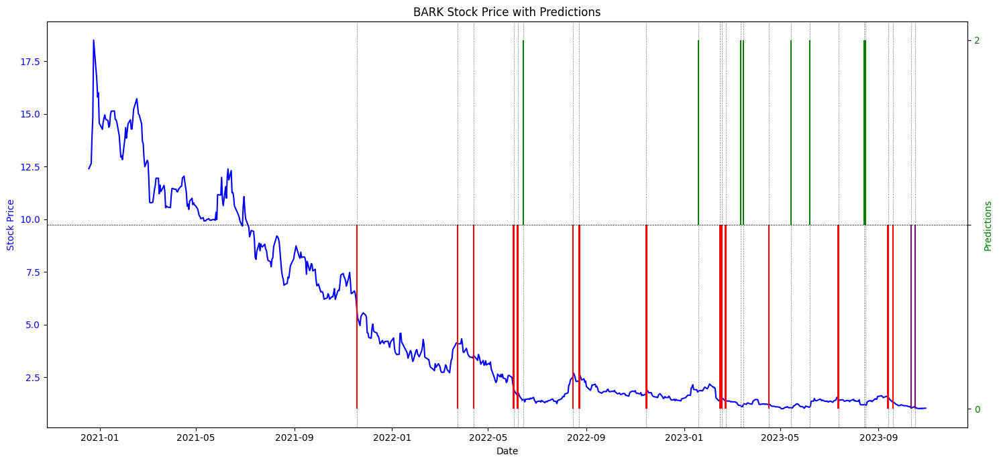

[*********************100%%**********************]  1 of 1 completed
Error with: BATT. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************] 

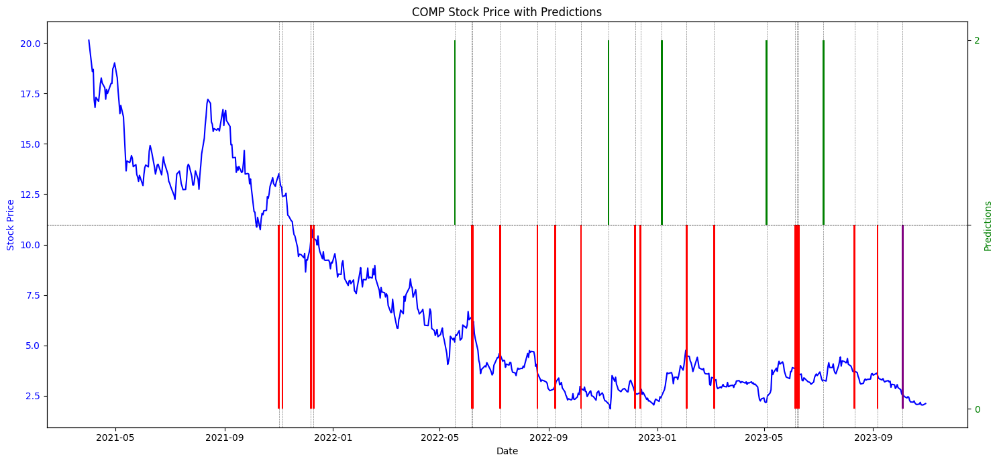

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.232 0.661 0.107]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for CORN. Skipping...
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]

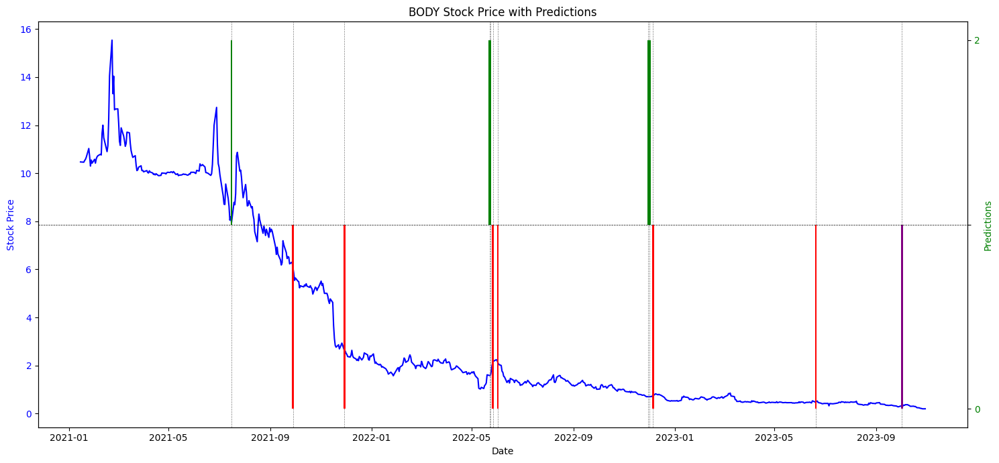

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.249 0.559 0.192]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 complet

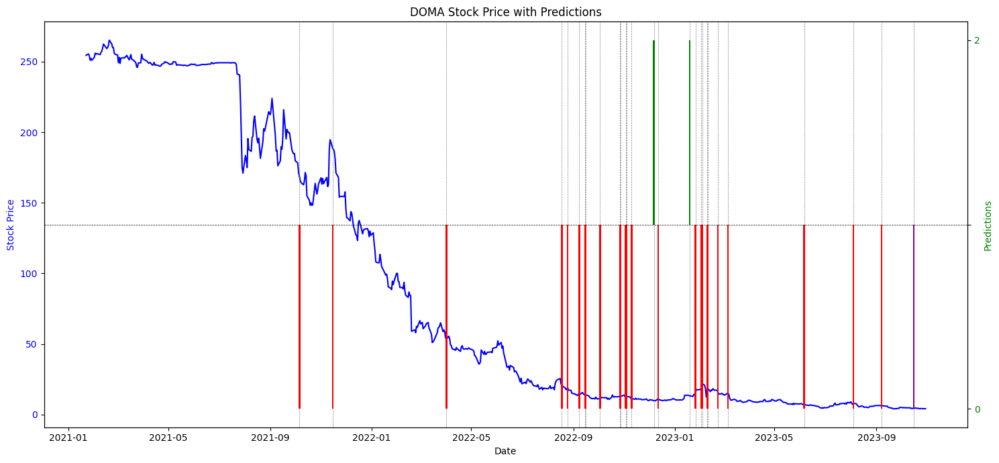

[[0.196 0.61  0.194]
 [0.2   0.687 0.113]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.288 0.581 0.131]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************1

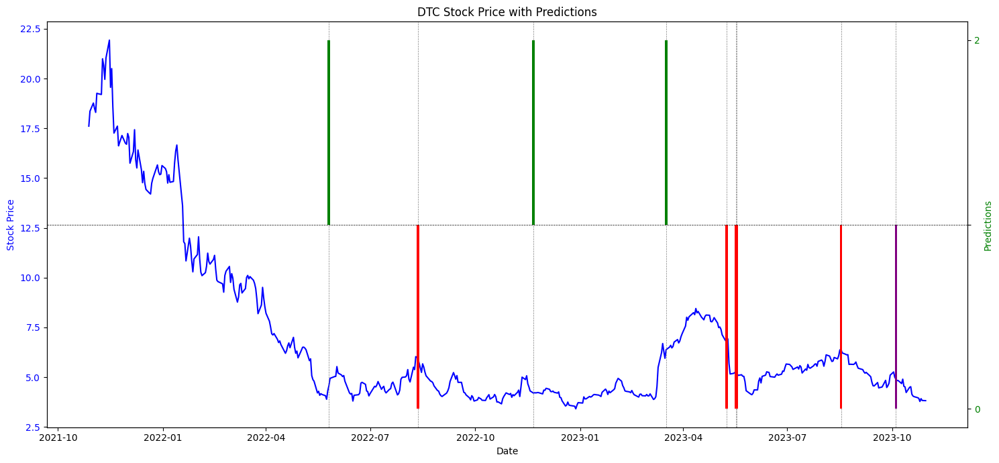

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100

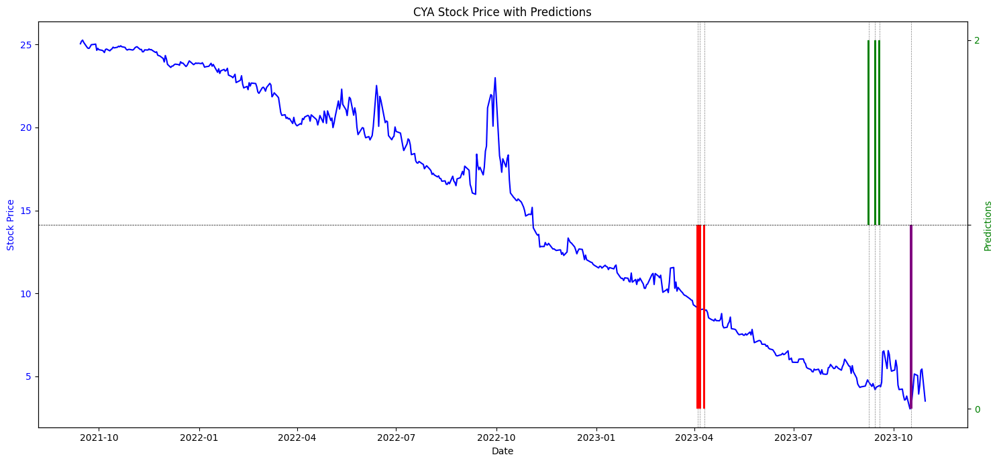

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.599 0.249 0.152]]
[*********************100%%**********************]  1 of 1 completed


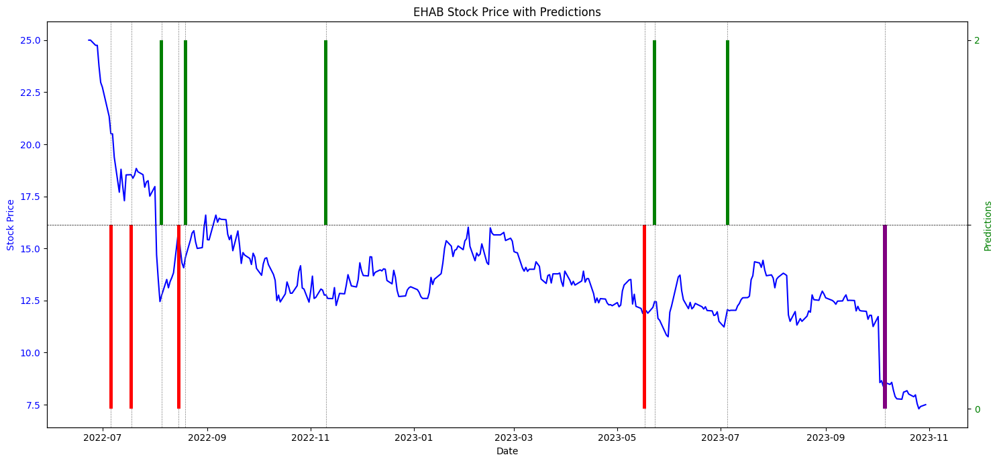

[[0.231 0.575 0.194]
 [0.186 0.658 0.156]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.263 0.61  0.127]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%

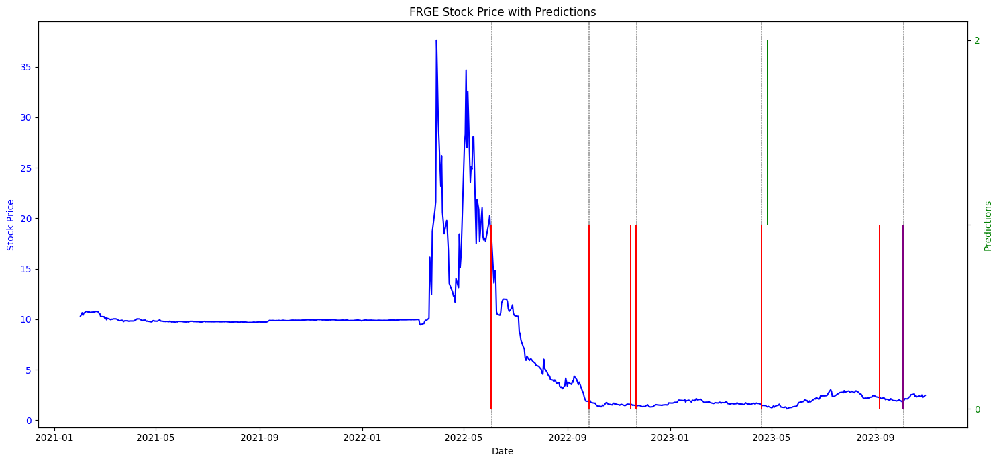

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.716 0.168 0.116]
 [0.571 0.229 0.2  ]]
[*********************100%%**********************]  1 of 1 completed


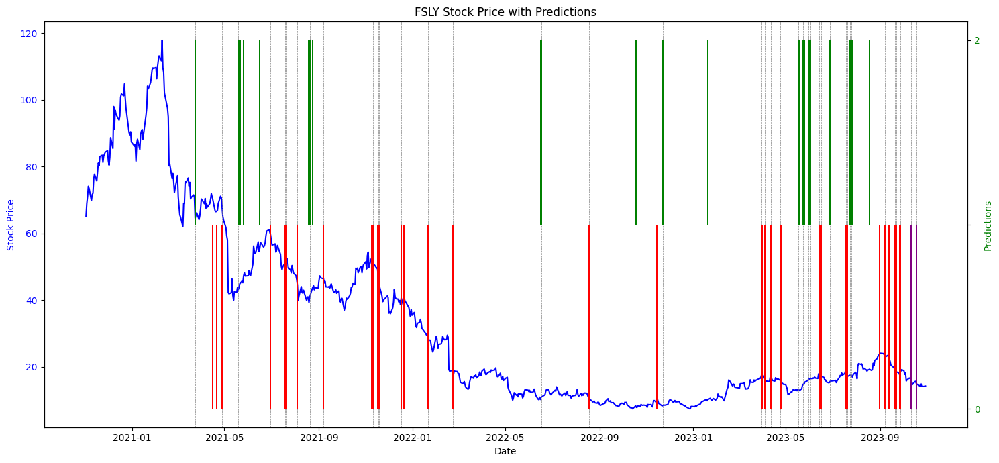

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100

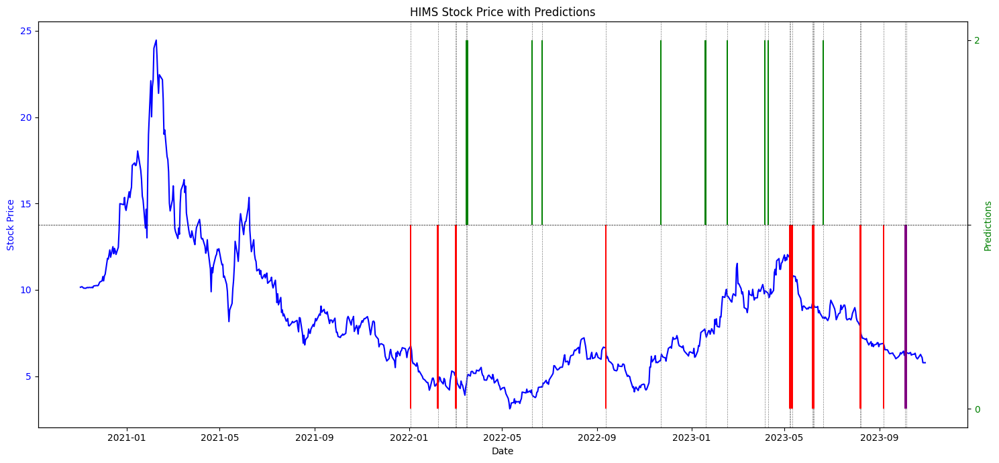

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100

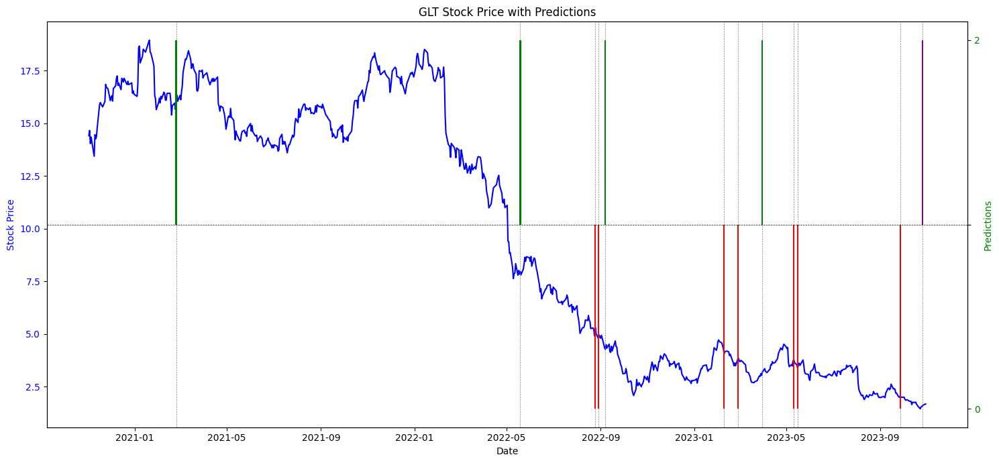

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.194 0.687 0.119]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*****

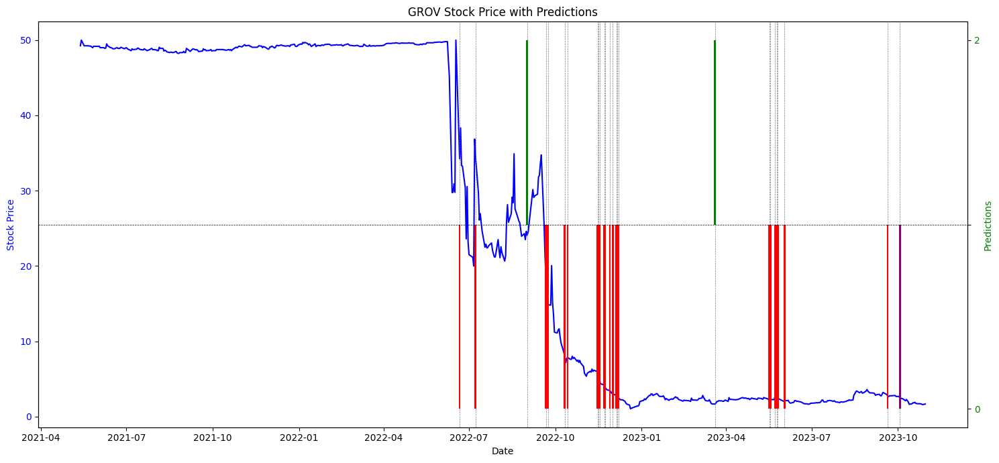

[[0.217 0.619 0.164]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.303 0.575 0.122]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.22  0.655 0.125]
 [0.235 0.671 0.094]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[***

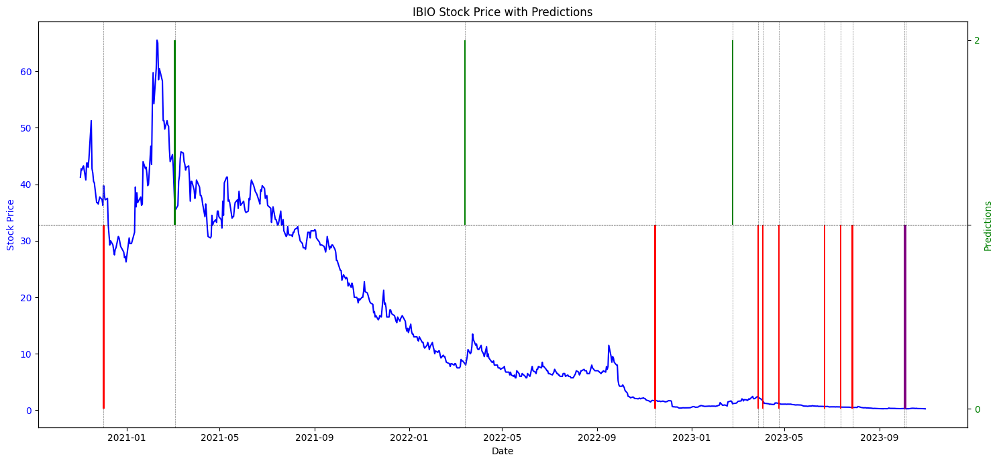

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: IE. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, 

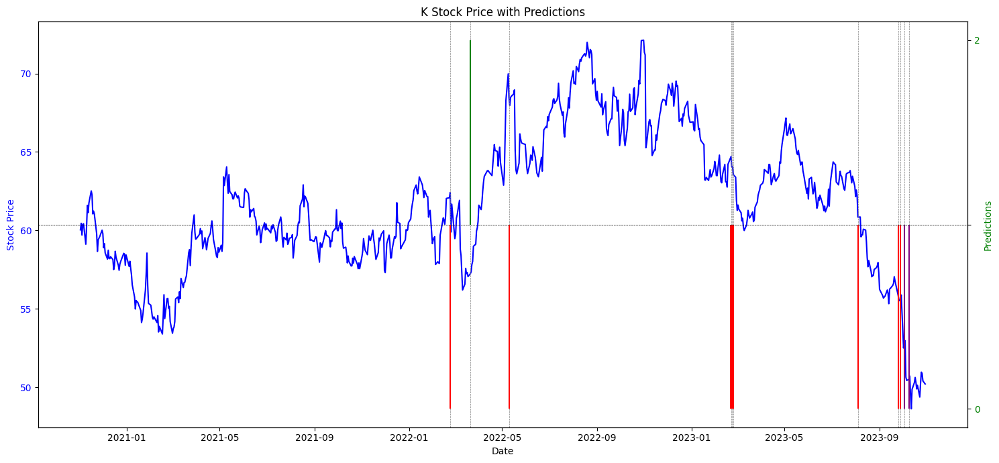

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.174 0.576 0.25 ]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
Error with: KEM. Error: Found array with 0 sample(s) (shape=(0, 55)) while a minimum of 1 is required by RandomForestClassifier.
[[0.224 0.645 0.131]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 

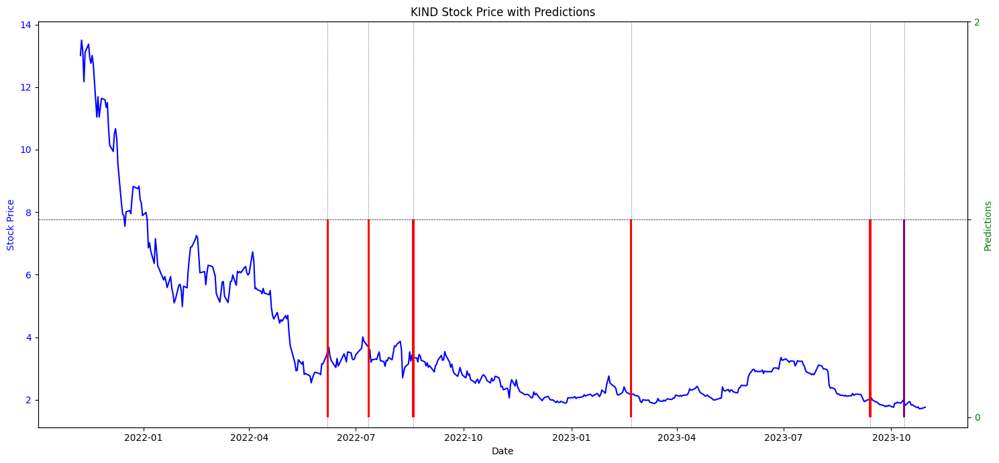

[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.266 0.631 0.103]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for KNF. Skipping...
[[0.182 0.666 0.152]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 

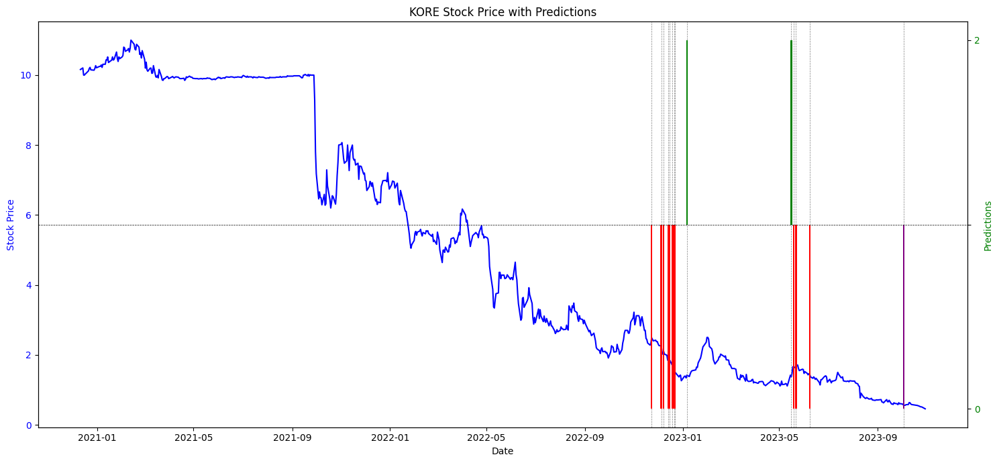

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.26389182 0.64398437 0.09212381]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 

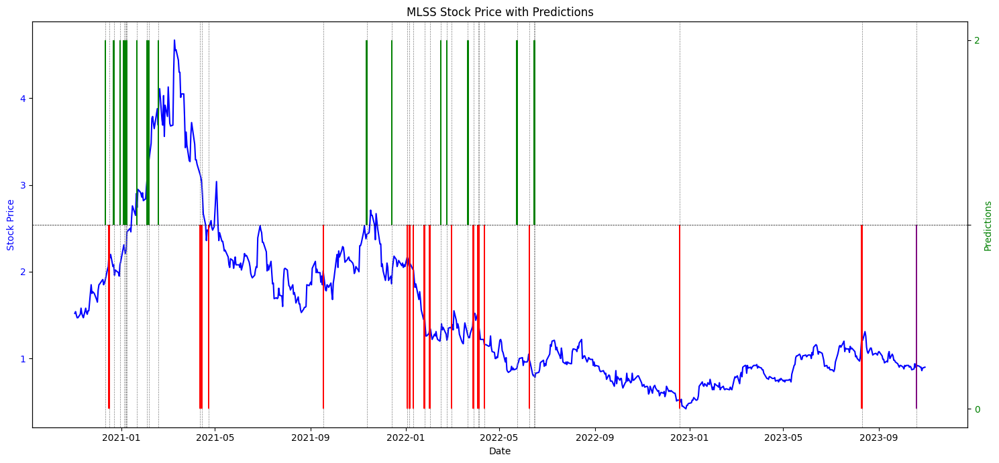

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.2751 0.6118 0.1131]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.281 0.582 0.137]]
[*********************100%%**********************]  1 of 1 completed
[[0.189 0.679 0.132]
 [0.215 0.588 0.197]
 [0.336 0.573 0.091]]
[*********************100%%**********************]  1 of 1 completed
[[0.192 0.679 0.129]
 [0.241 0.616 0.143]
 [0.201 0.675 0.124]]
[*********************100%%**********************]  1 

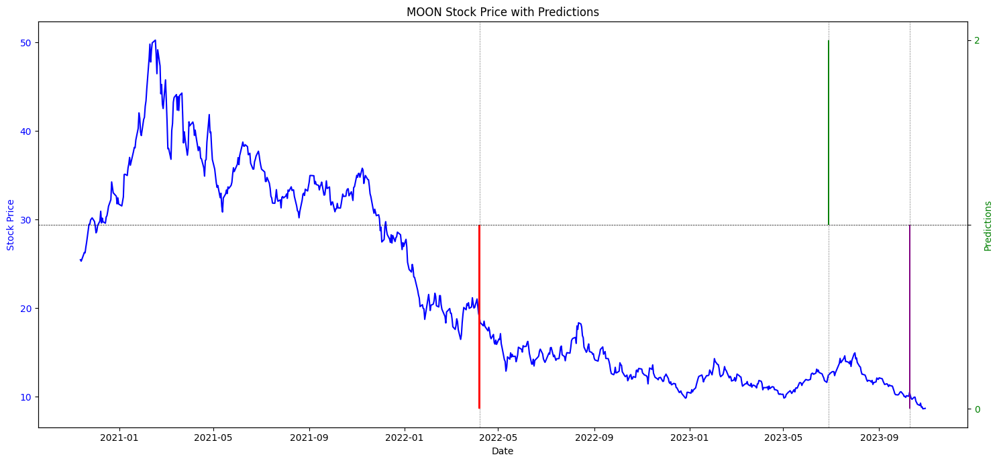

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.15588764 0.77909781 0.06501455]
 [0.1467356  0.80822121 0.04504319]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[**************

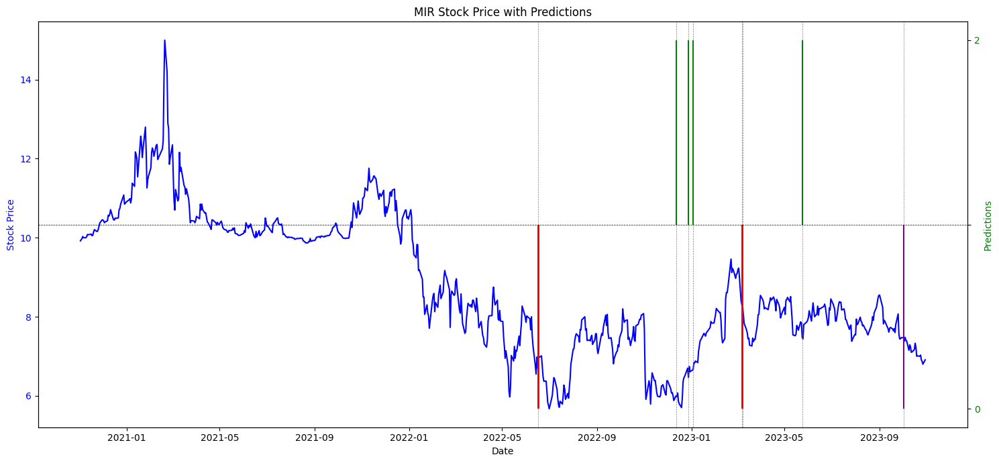

[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.253 0.625 0.122]
 [0.245 0.623 0.132]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*********

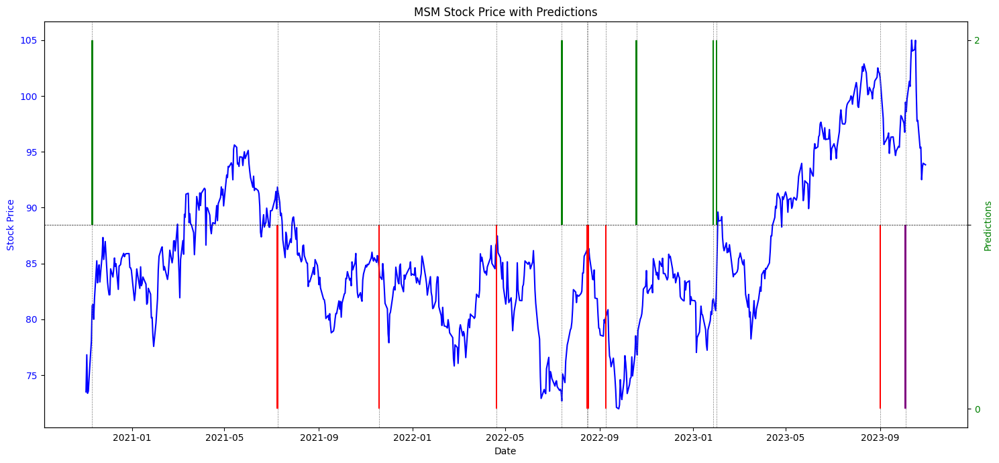

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.217 0.577 0.206]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.158 0.555 0.287]]
[*********************100%%********************

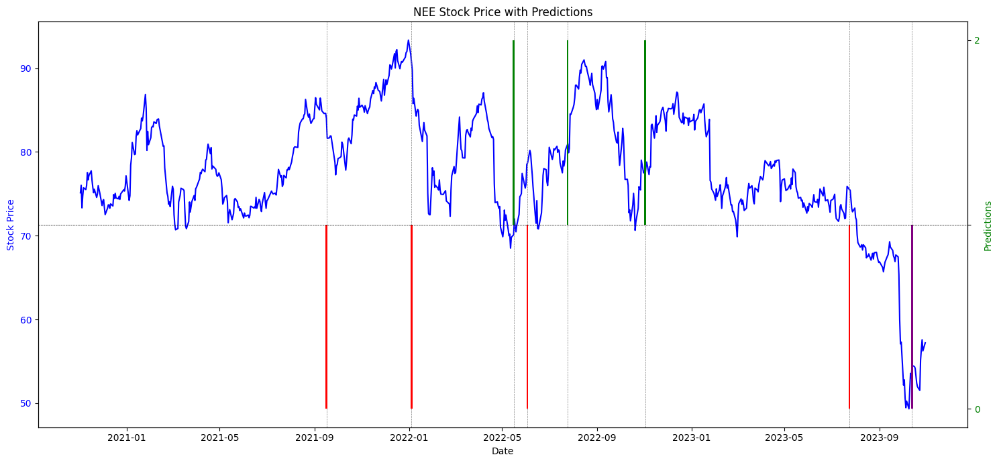

[]
[*********************100%%**********************]  1 of 1 completed
[[0.244 0.577 0.179]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.081 0.778 0.141]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.132 0.836 0.032]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*

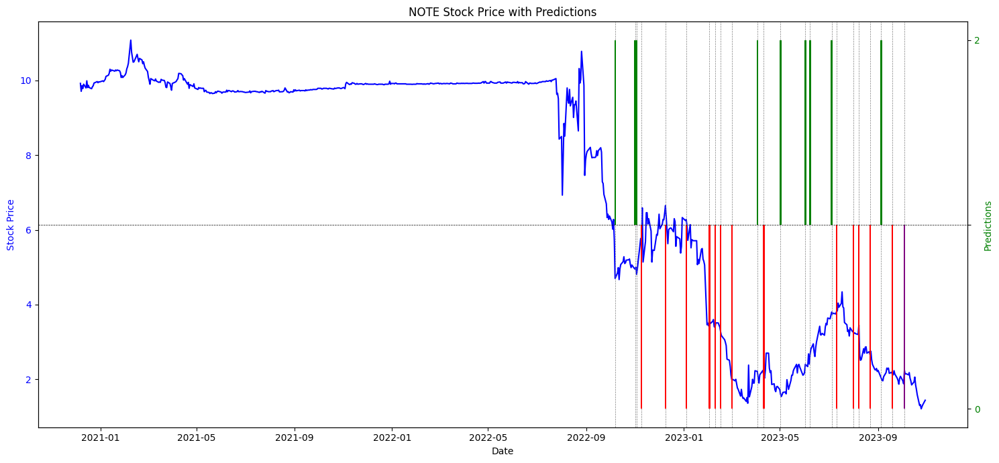

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.242 0.587 0.171]
 [0.24  0.604 0.156]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.66 0.08 0.26]]
[*********************100%%**********************]  1 of 1 completed


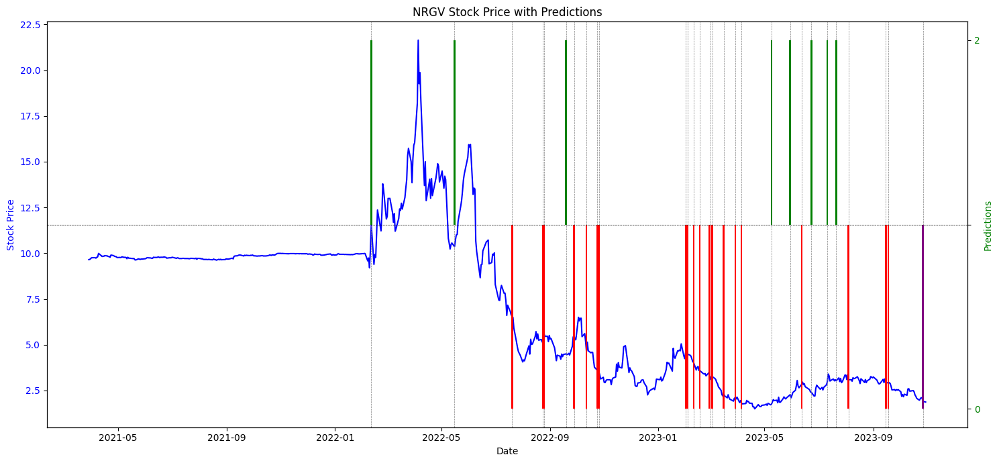

[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for NRP. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for NSTB. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%*********************

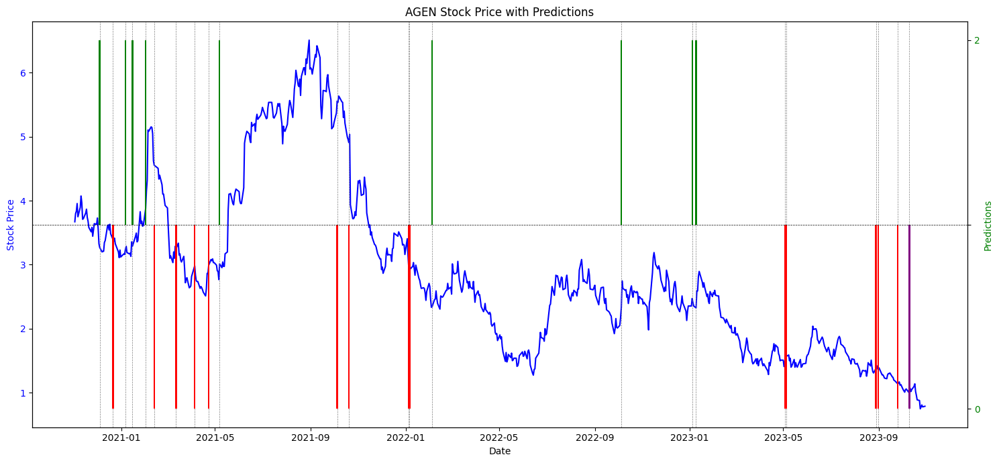

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.552 0.229 0.219]]
[*********************100%%**********************]  1 of 1 completed


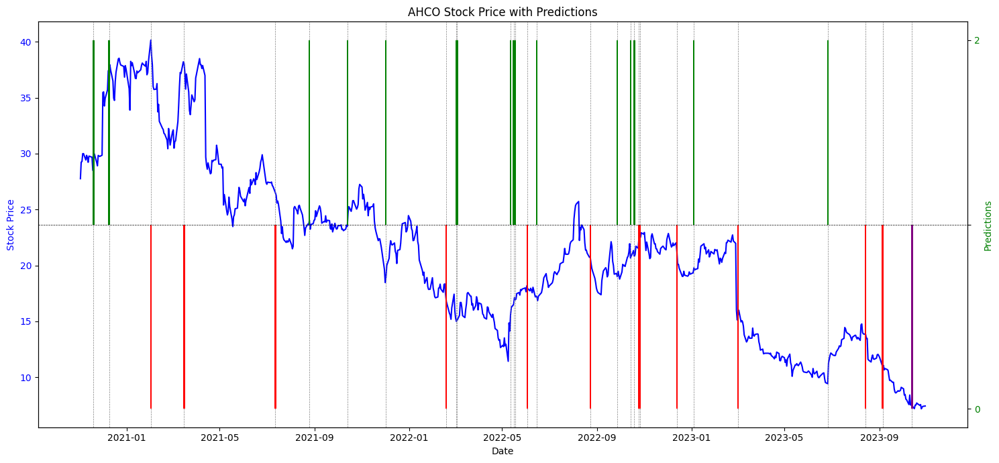

[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for AIA. Skipping...
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for AIBBU. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**************

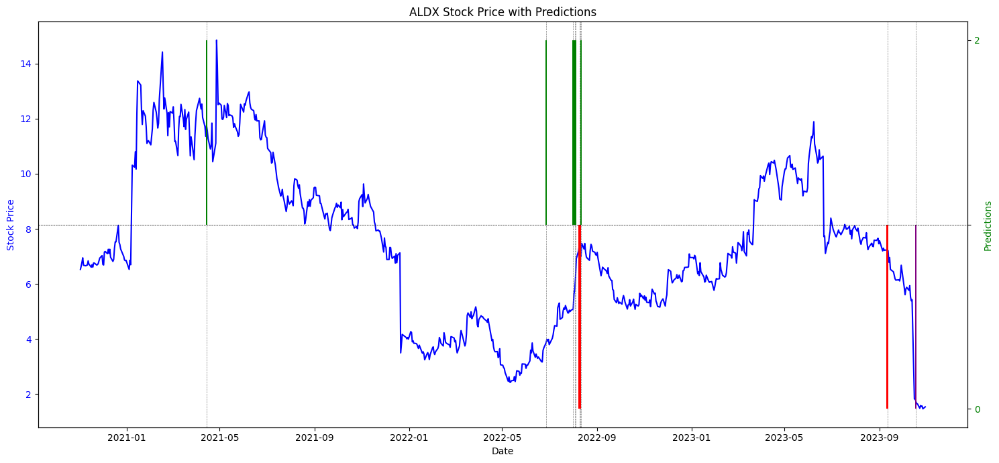

[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.559 0.181 0.26 ]]
[*********************100%%**********************]  1 of 1 completed


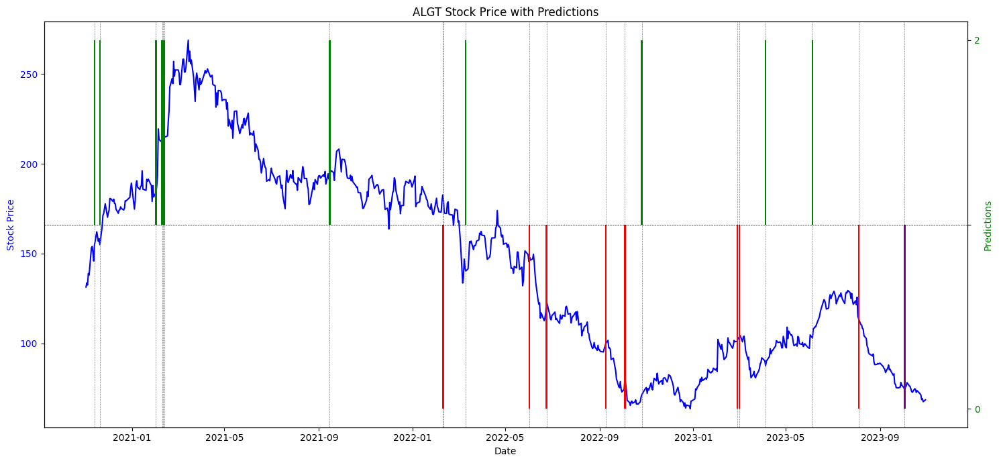

[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.25  0.551 0.199]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.595 0.097 0.308]]
[*********************100%%**********************]  1 of 1 completed


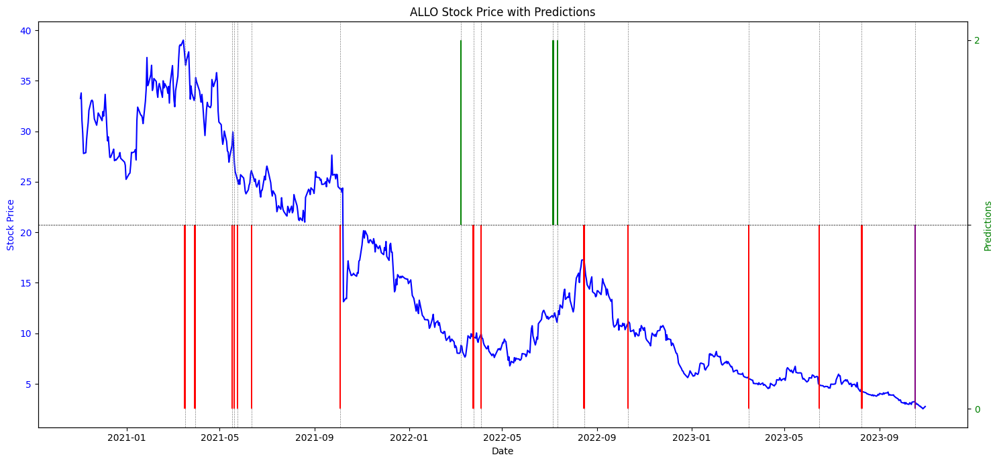

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ALRN. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: ONL. Error: Input X contain

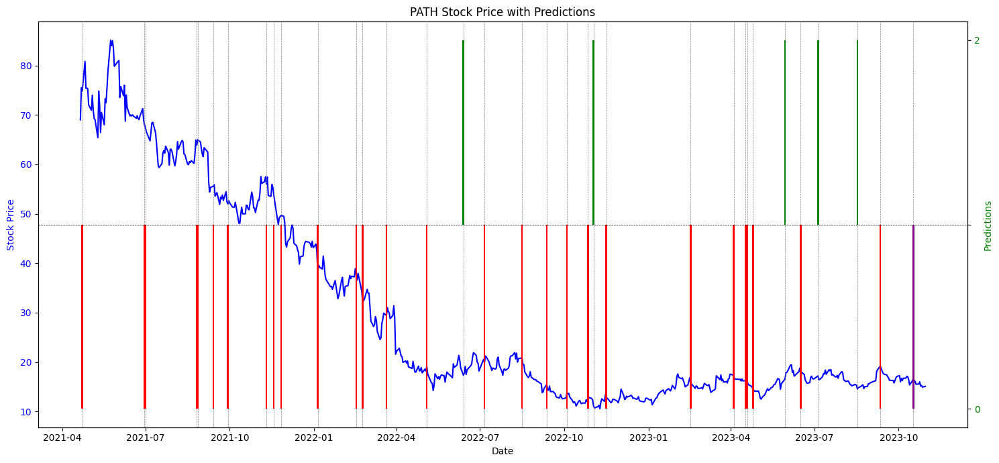

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.142 0.72  0.138]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.27116667 0.64283333 0.086     ]]
[*********************100%%**********************]  1 of 1 completed
[[0.585 0.179 0.236]]
[*********************100%%**********************]  1 of 1 completed


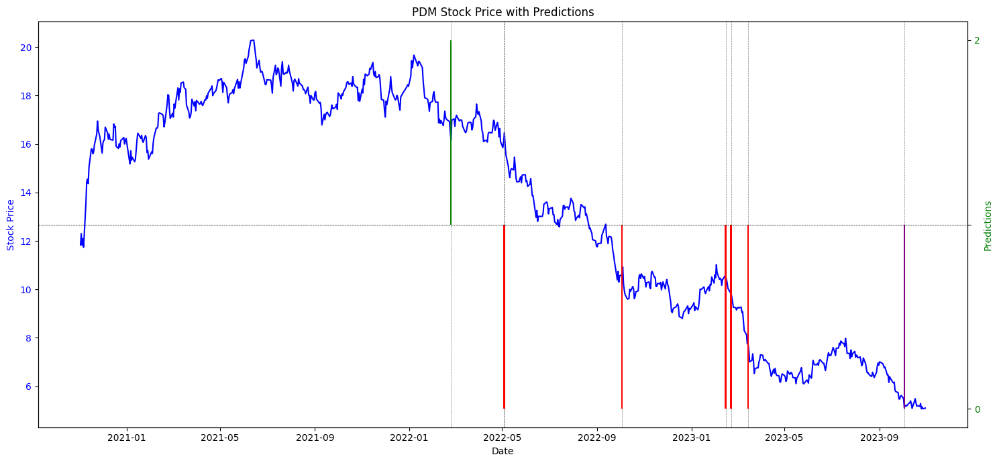

Error with: PEAK. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
Error with: PEN. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN nativ

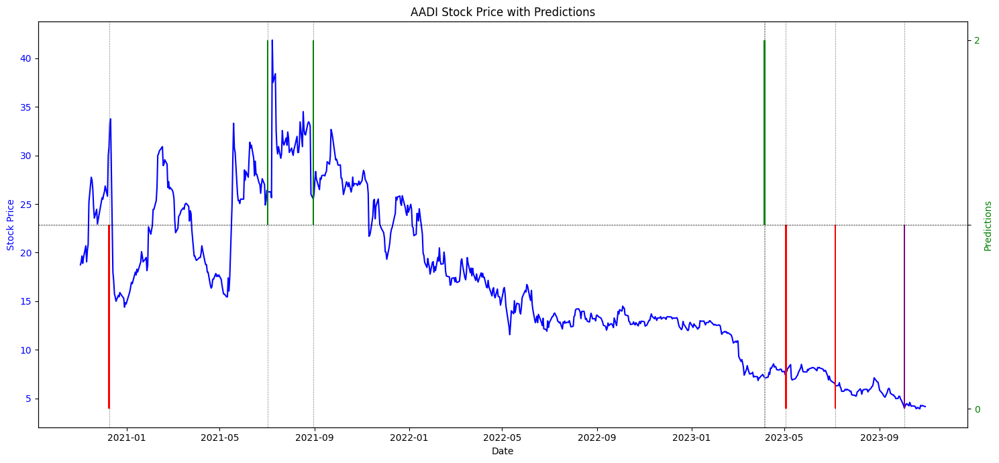

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
Error with: AAON. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******************

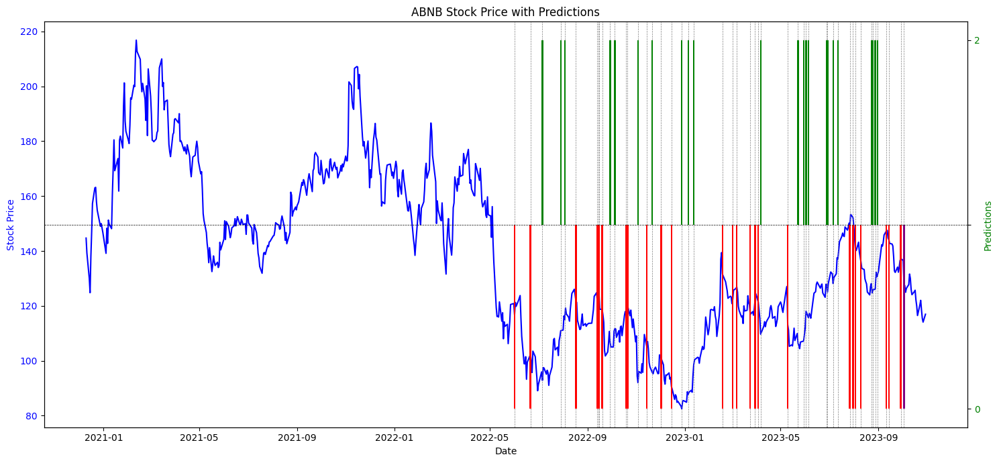

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ACAC. Skipping...
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ACACU. Skipping...
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ACBA. Skipping...
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ACBAU. Skipping...
[[0.678 0.096 0.226]
 [0.618 0.121 0.261]]
[**************

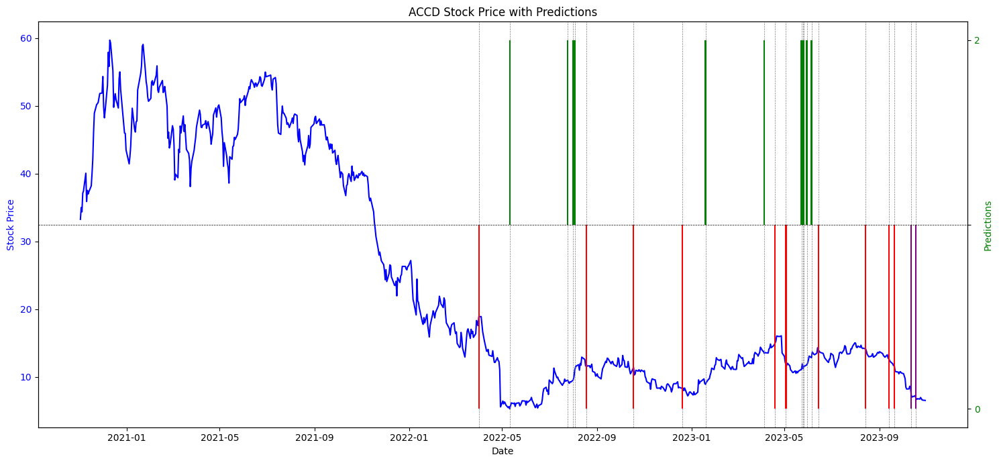

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.577 0.141 0.282]]
[*********************100%%**********************]  1 of 1 completed


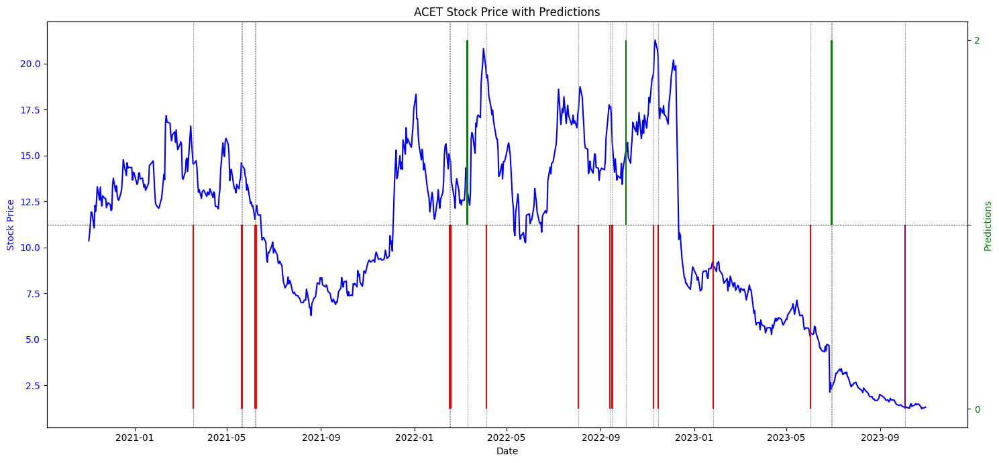

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.69133603 0.26949637 0.0391676 ]]
[*********************100%%**********************]  1 of 1 completed


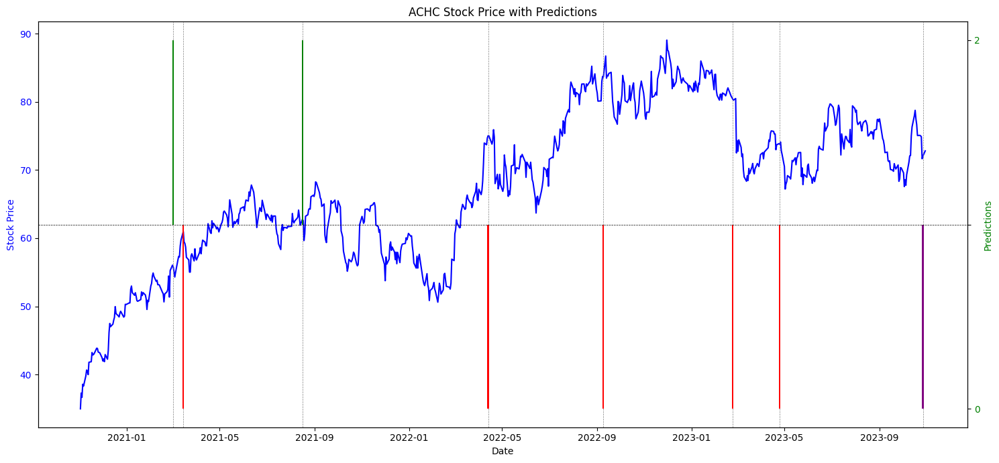

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: ACLS. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************] 

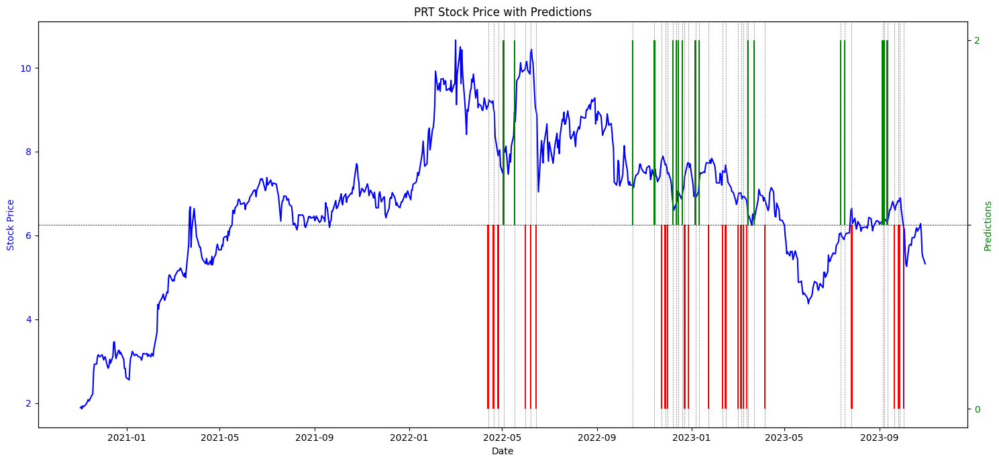

[*********************100%%**********************]  1 of 1 completed
[[0.251 0.625 0.124]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.586 0.169 0.245]]
[*********************100%%**********************]  1 of 1 completed


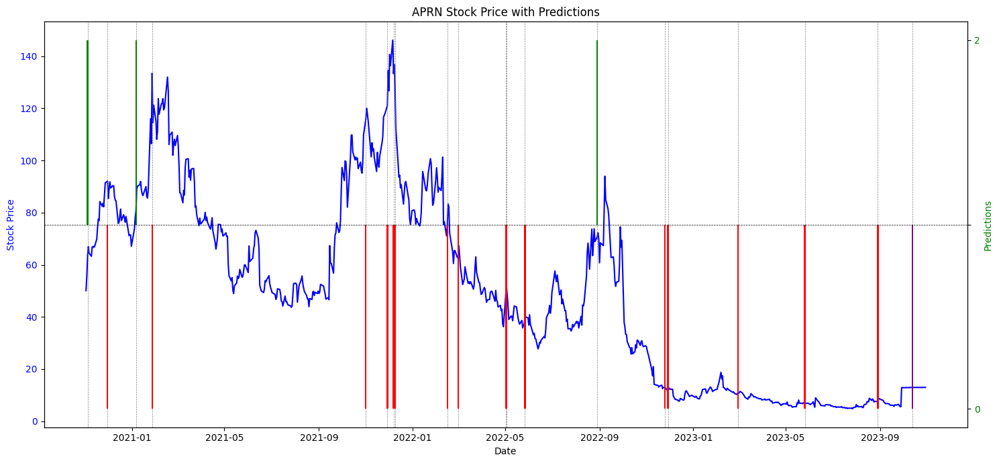

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.55  0.184 0.266]]
[*********************100%%**********************]  1 of 1 completed


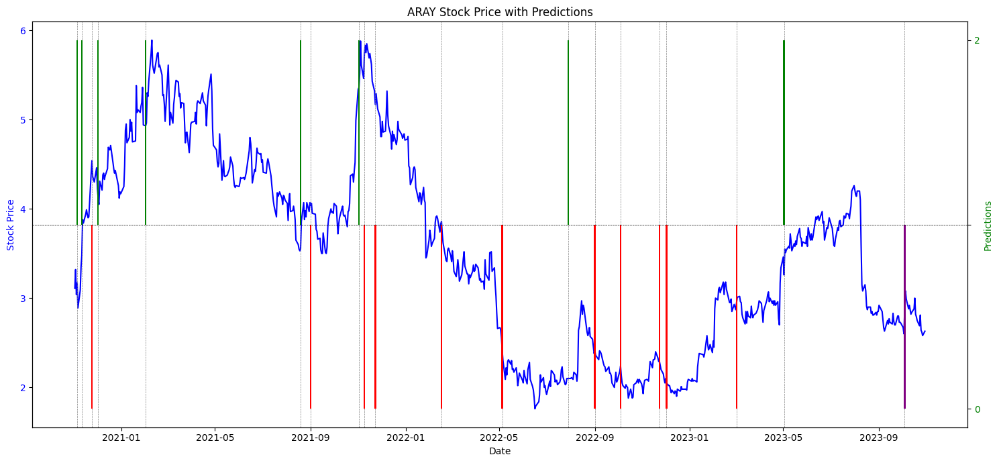

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ARIZ. Skipping...
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ARIZU. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.257 0.592 0.151]]
[*********************100%%**********************]  1 of 1 completed
[[0.586 0.128 0.286]


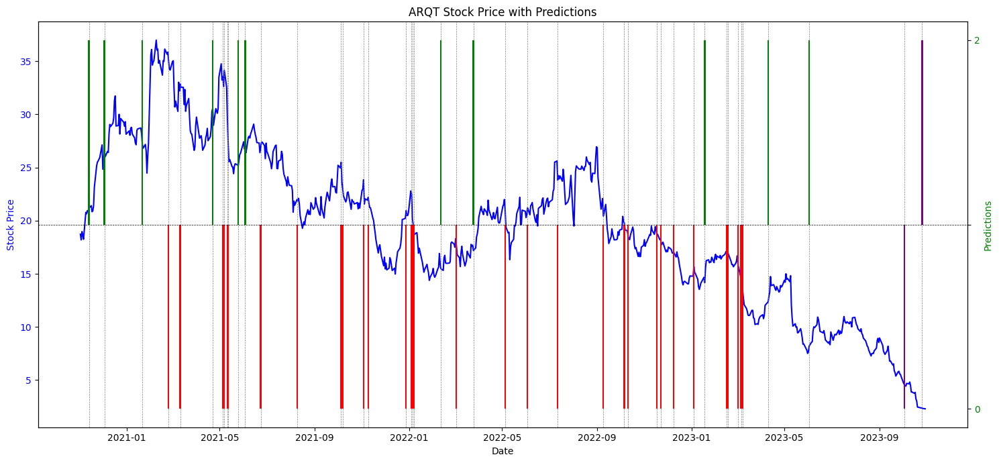

Error with: ARRY. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%*********************

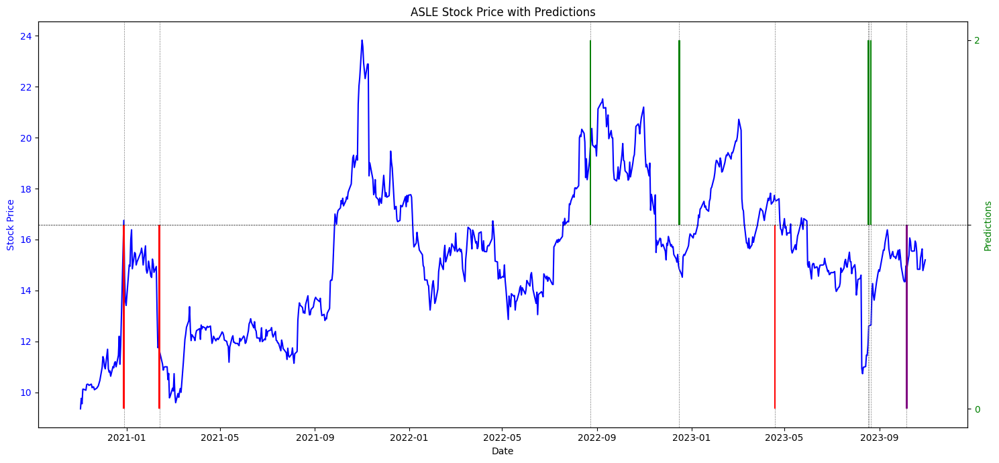

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ASPAU. Skipping...
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************1

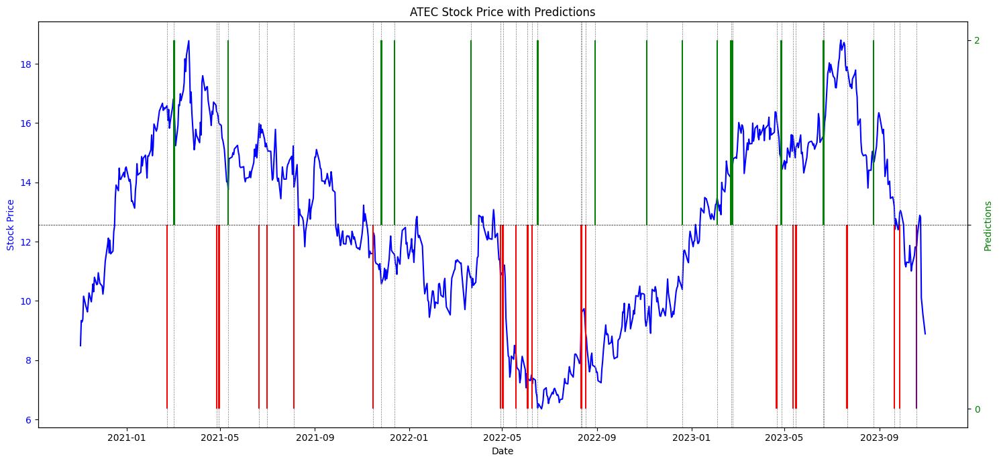

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.575 0.204 0.221]]
[*********************100%%**********************]  1 of 1 completed


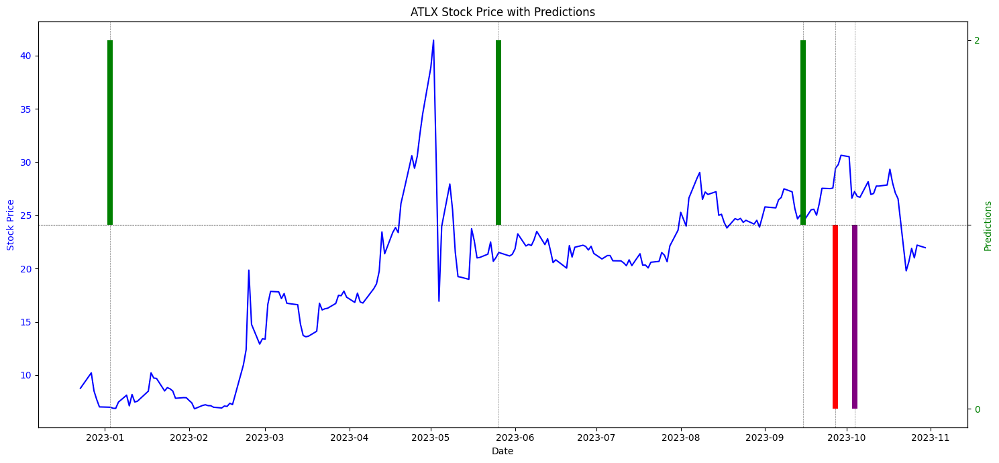

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ATOS. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: ATRO. Error: Found array with 0 sample(s) (shape=(0, 55)) while a minimum of 1 is required by RandomForestClassifier.
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%********************

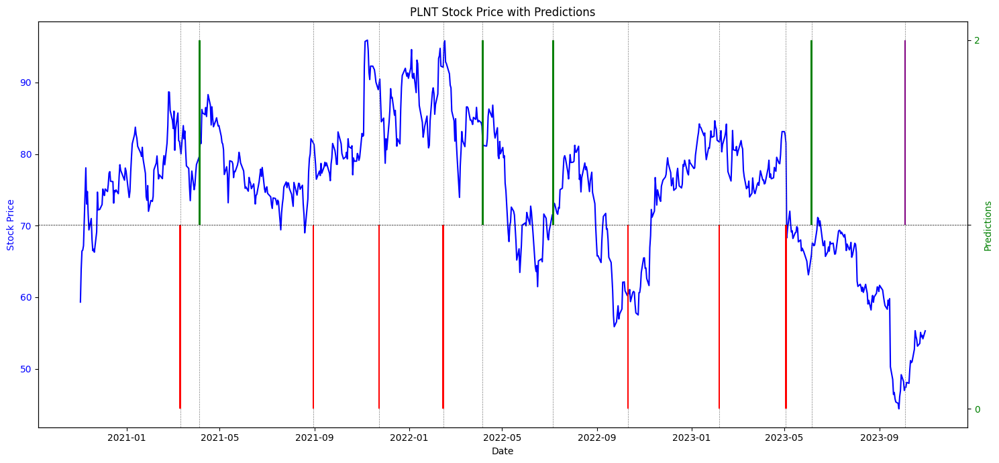

[*********************100%%**********************]  1 of 1 completed
Error with: PLTR. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************] 

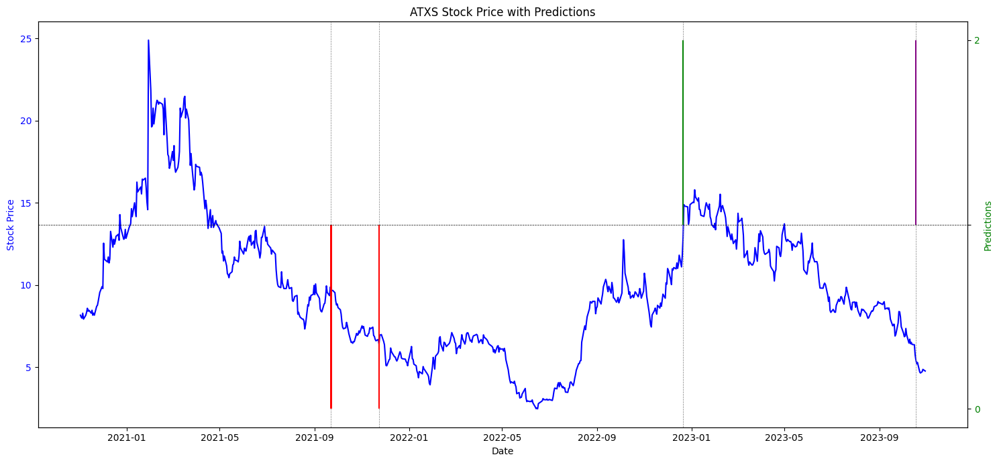

[[0.15  0.812 0.038]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.191 0.23  0.579]
 [0.185 0.178 0.637]]
[*********************100%%**********************]  1 of 1 completed


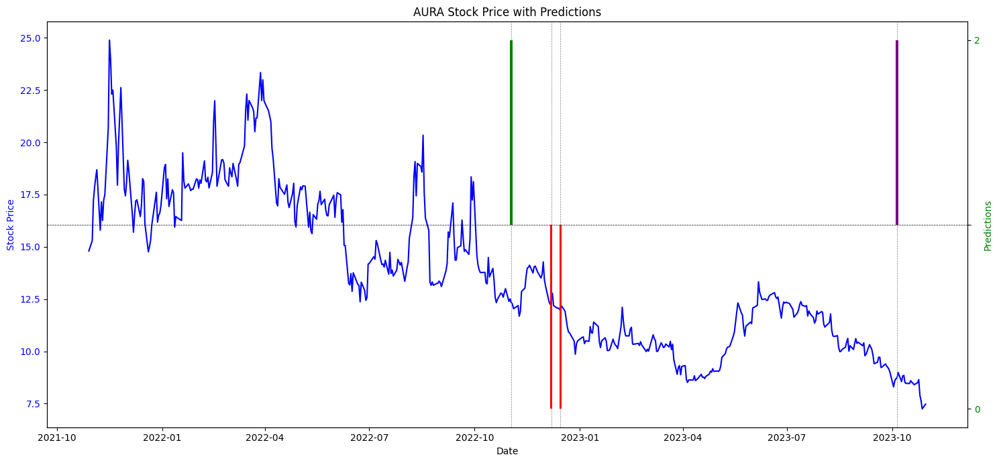

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.247 0.63  0.123]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.216 0.641 0.143]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.594 0.183 0.223]]
[*********************100%%*******

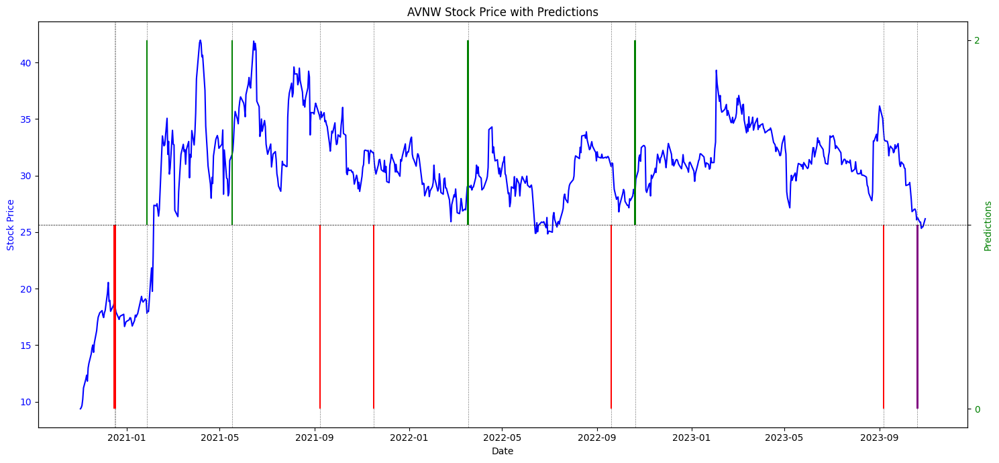

[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[******************

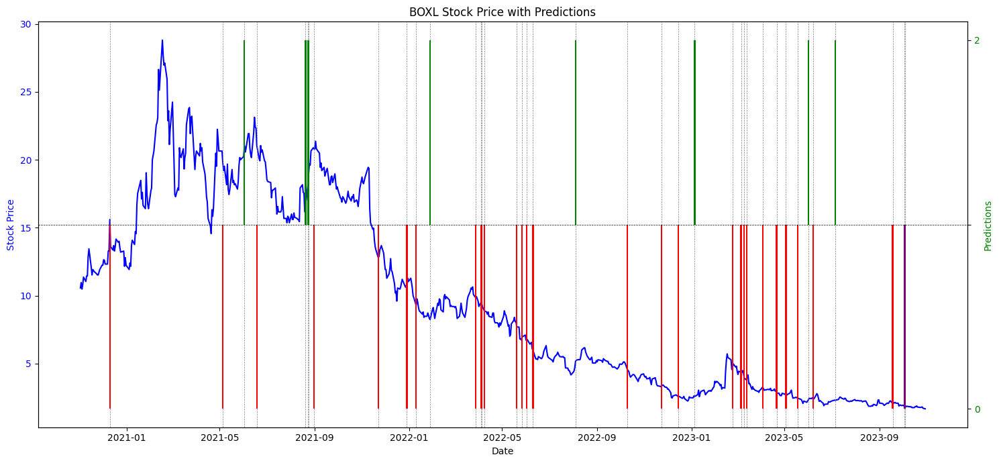

Error with: BPMC. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
Error with: BPOP. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to pre

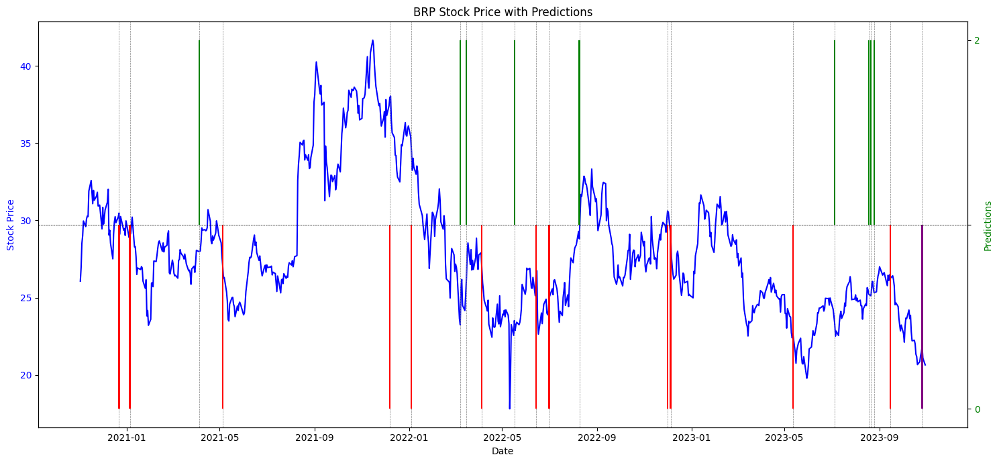

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.553 0.181 0.266]
 [0.612 0.088 0.3  ]]
[*********************100%%**********************]  1 of 1 completed


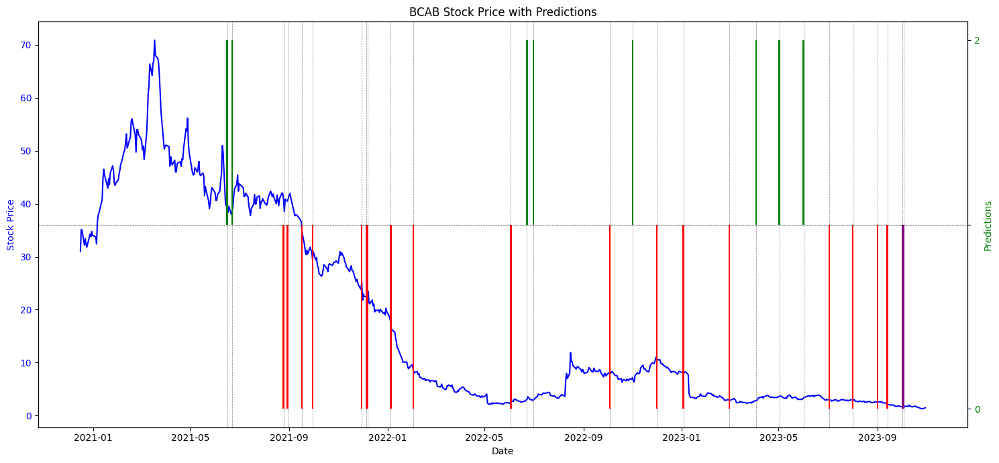

[[0.22429927 0.69847445 0.07722628]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.656 0.137 0.207]]
[*********************100%%**********************]  1 of 1 completed


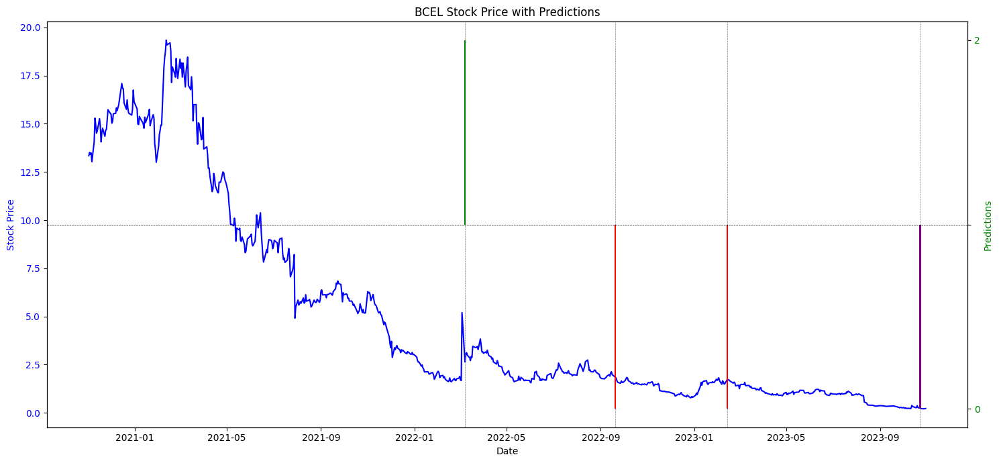

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.572 0.138 0.29 ]]
[*********************100%%**********************]  1 of 1 completed


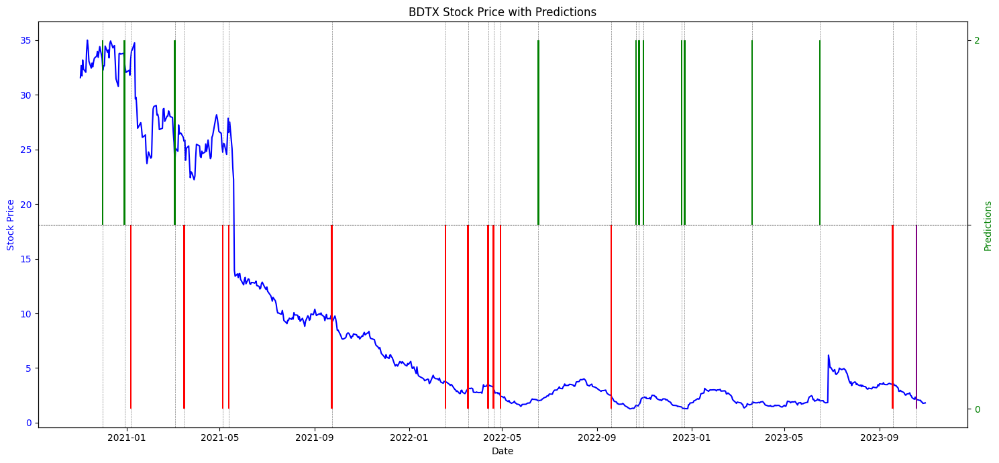

[]
[*********************100%%**********************]  1 of 1 completed
[[0.666 0.163 0.171]]
[*********************100%%**********************]  1 of 1 completed


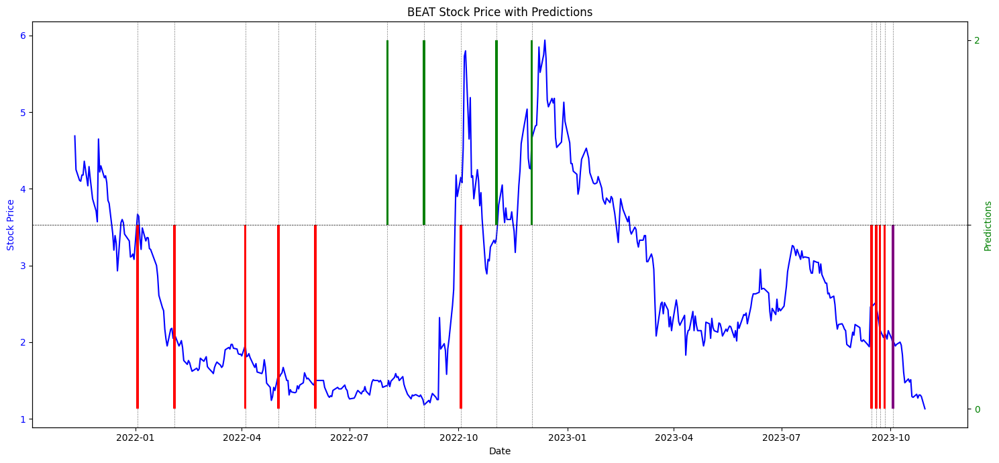

[*********************100%%**********************]  1 of 1 completed
[[0.603 0.27  0.127]]
[*********************100%%**********************]  1 of 1 completed


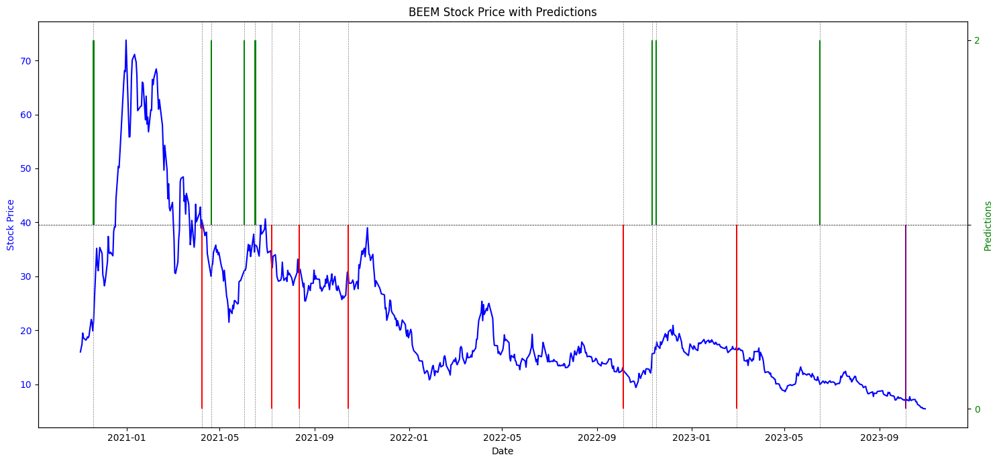

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for BENF. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%******

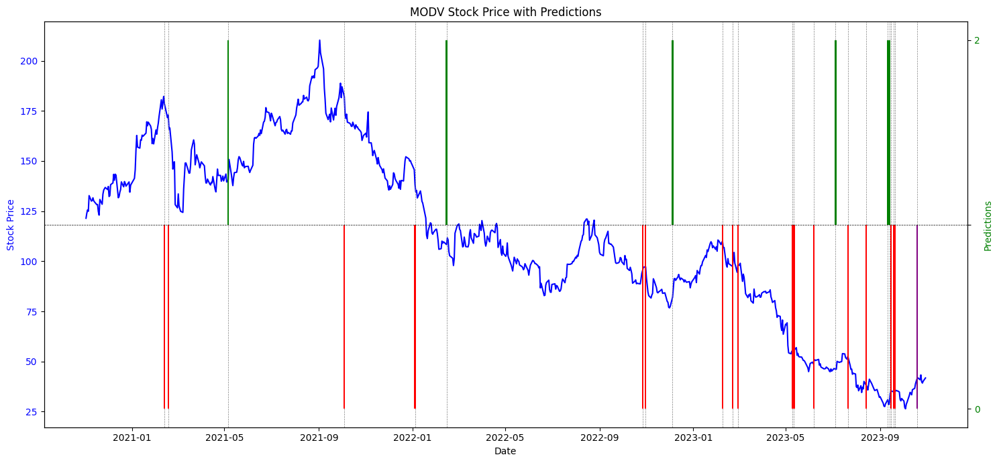

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.57  0.222 0.208]]
[*********************100%%**********************]  1 of 1 completed


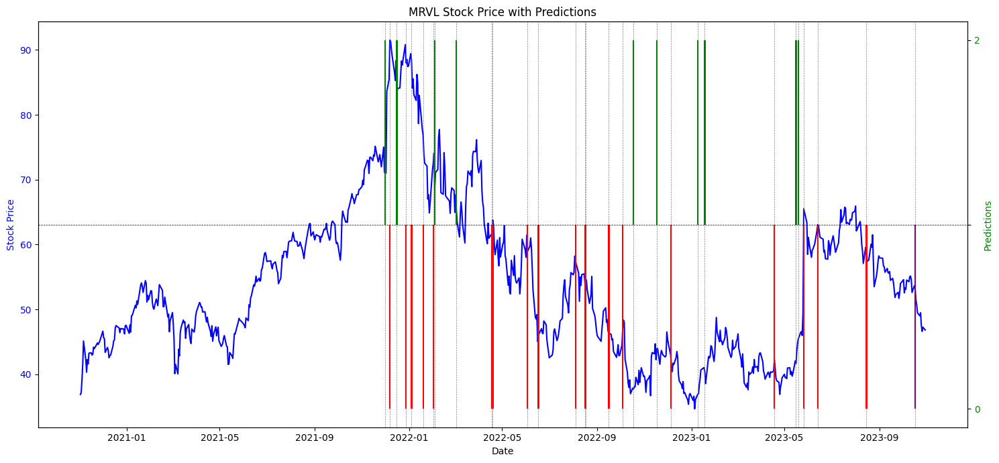

[]
[*********************100%%**********************]  1 of 1 completed
Error with: MSBIP. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.58 0.15 0.27]]
[*********************100%%*

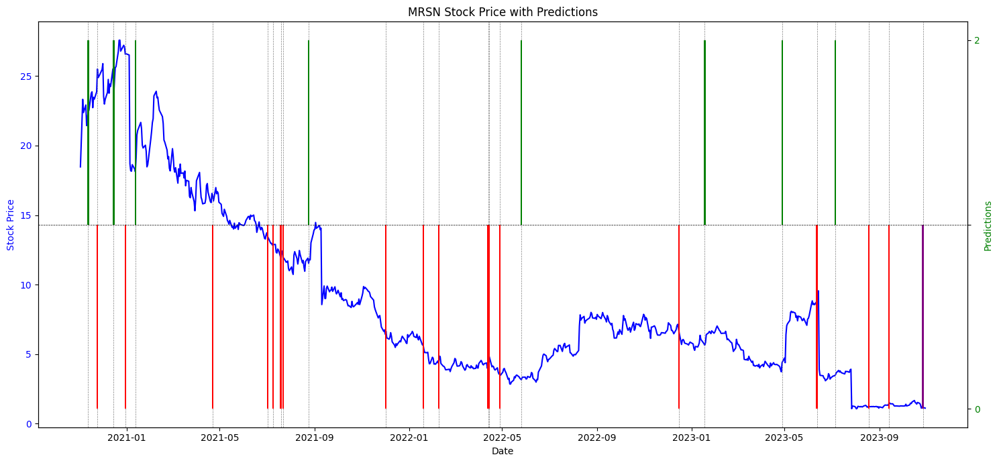

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: MNPR. Error: Input X contains NaN.
RandomForestClassifier does not accept mi

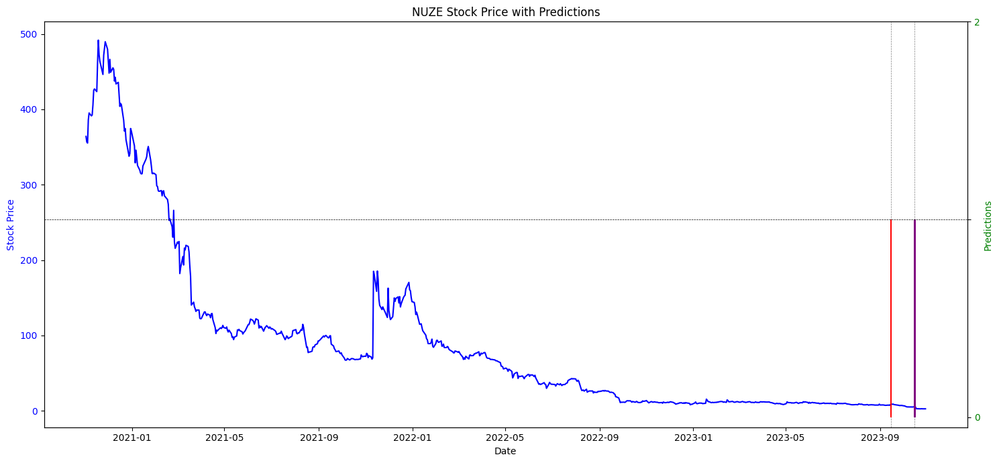

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: NVEE. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following

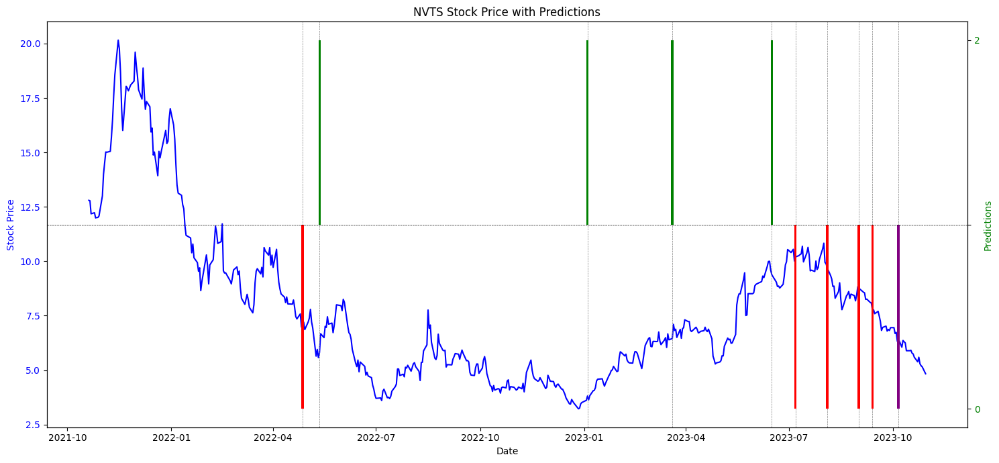

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100

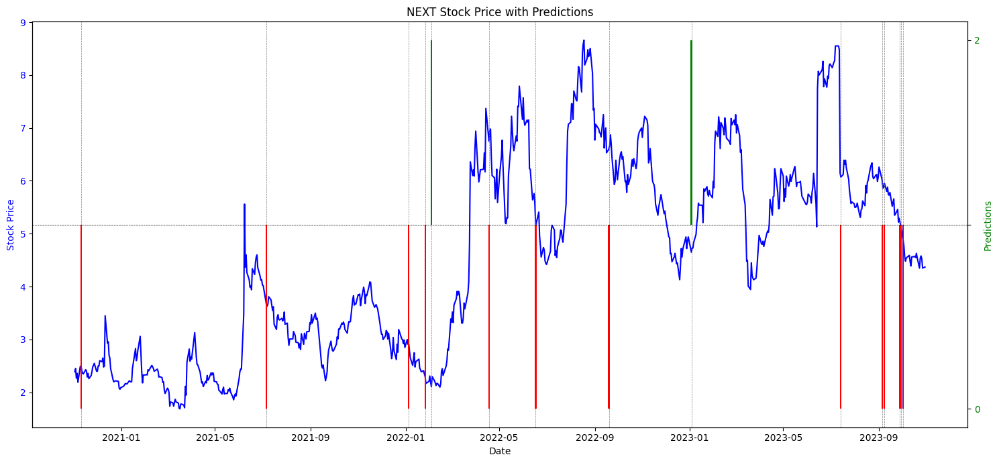

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
Error with: NNAVW. Err

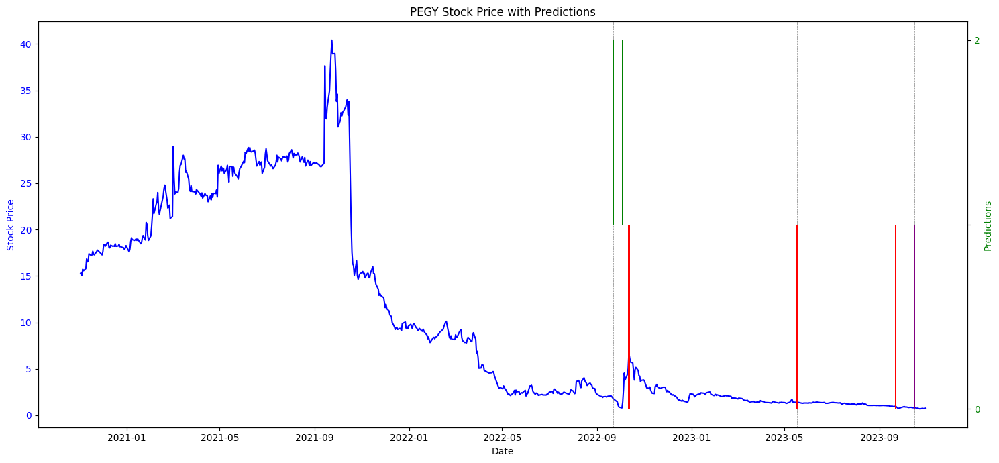

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100

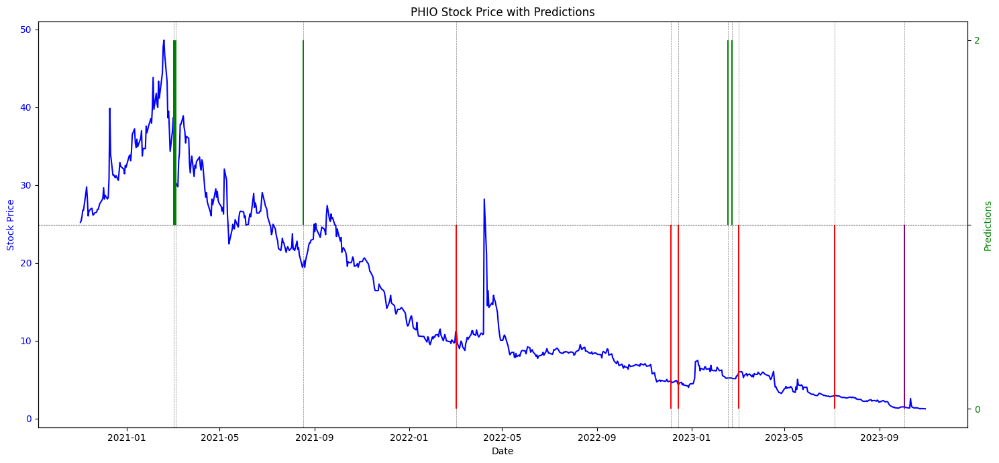

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.639 0.188 0.173]]
[*********************100%%**********************]  1 of 1 completed


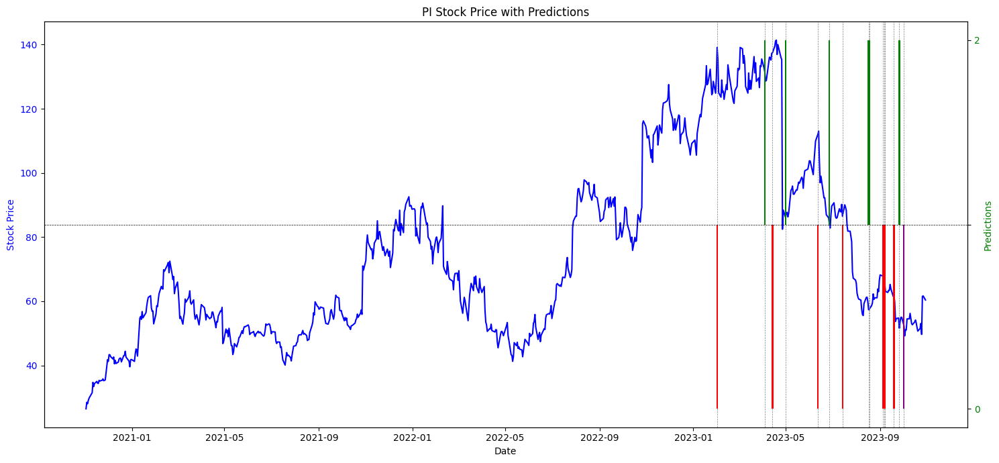

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for PIO. Skipping...
[*********************100%%**********************]  1 of 1 completed
[[0.244 0.616 0.14 ]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[**************

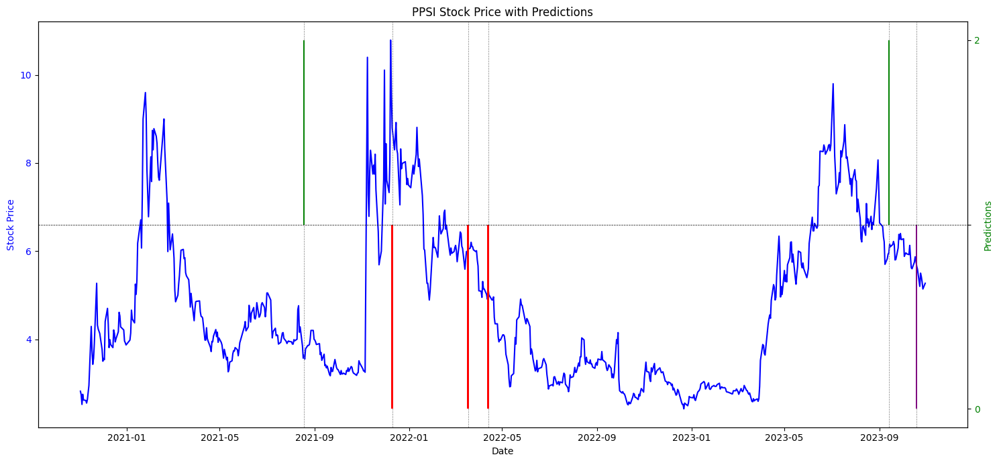

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.592 0.195 0.213]
 [0.596 0.181 0.223]
 [0.554 0.215 0.231]
 [0.583 0.172 0.245]]
[*********************100%%**********************]  1 of 1 completed


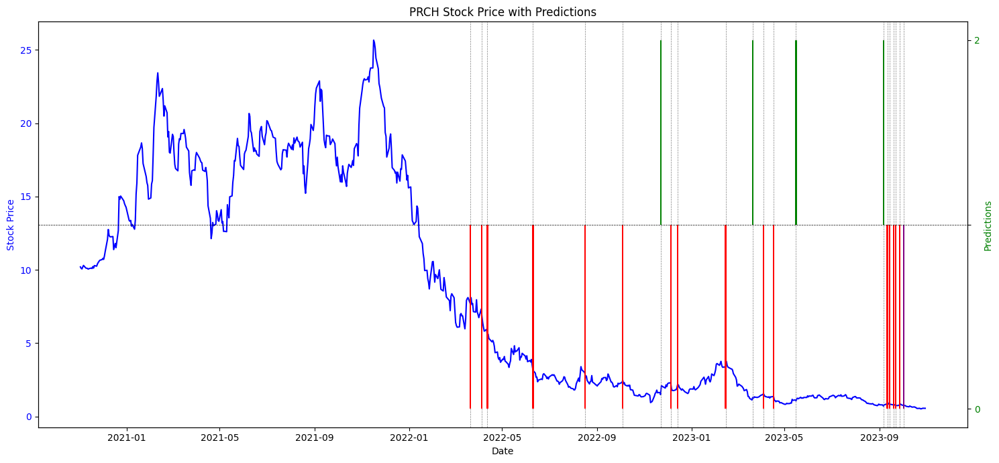

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
Error with: PRLD. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%*********************

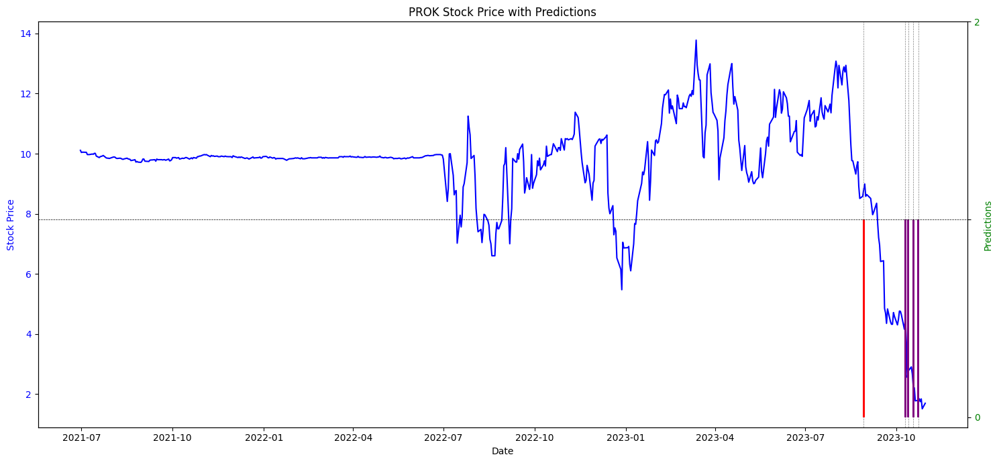

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.77  0.111 0.119]]
[*********************100%%**********************]  1 of 1 completed


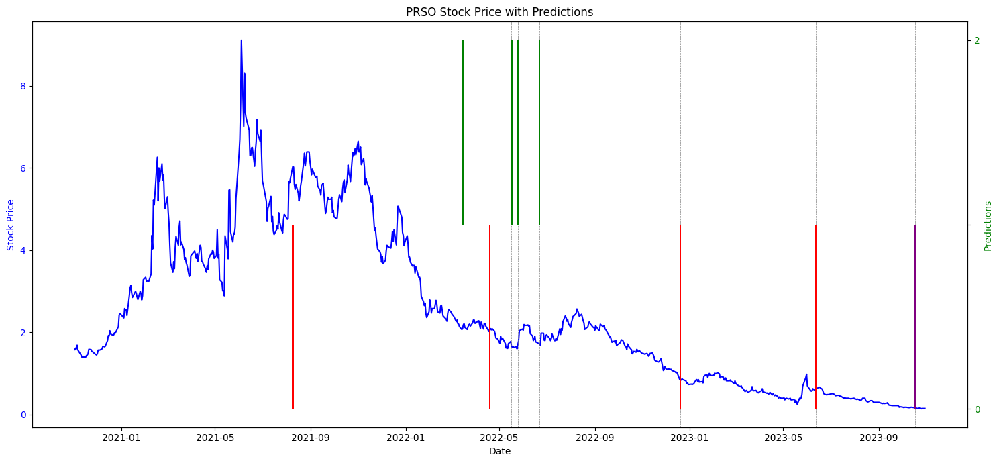

[[0.583 0.105 0.312]
 [0.554 0.296 0.15 ]]
[*********************100%%**********************]  1 of 1 completed


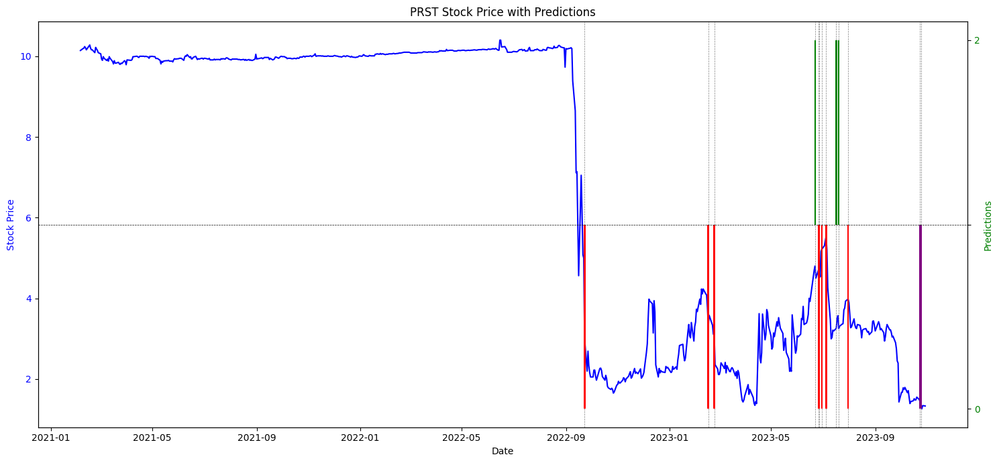

[]
[*********************100%%**********************]  1 of 1 completed
[[0.556 0.232 0.212]
 [0.629 0.167 0.204]]
[*********************100%%**********************]  1 of 1 completed


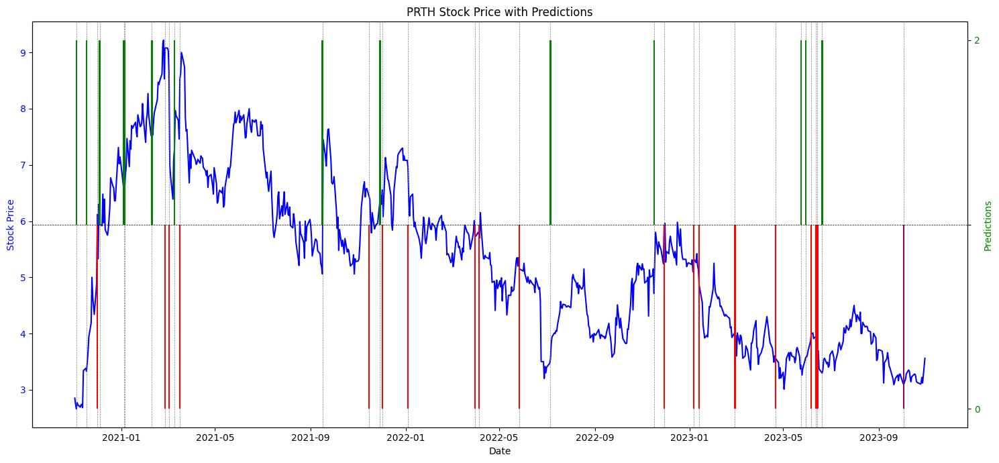

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.186 0.66  0.154]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.574 0.178 0.248]]
[*********************100%%**********************]  1 of 1 completed


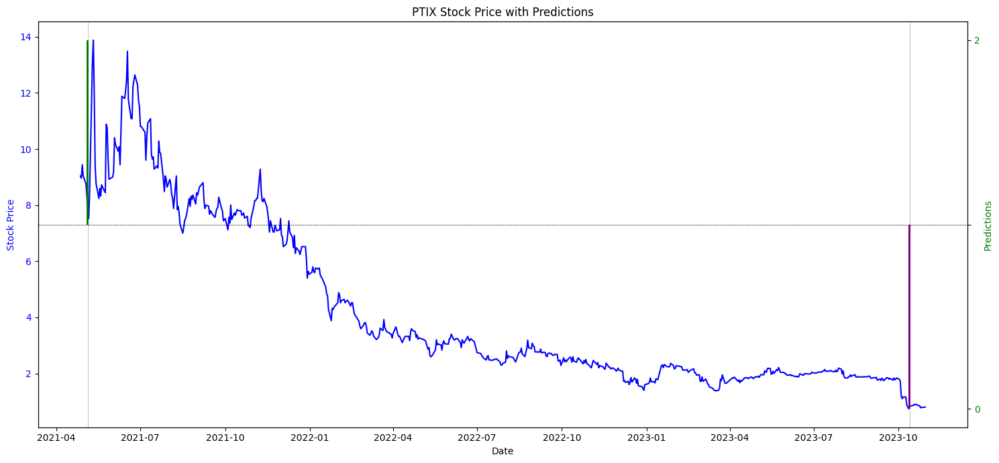

[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.567 0.151 0.282]]
[*********************100%%**********************]  1 of 1 completed


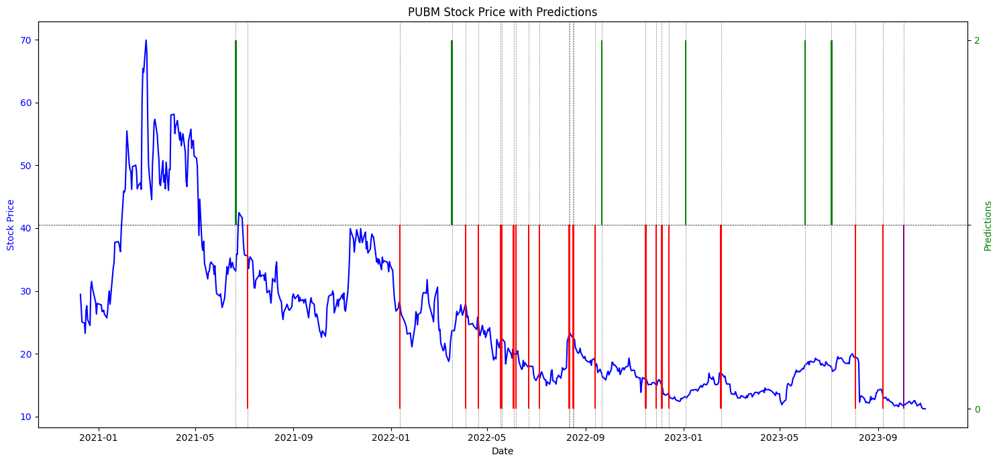

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for NXTC. Skipping...
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%************

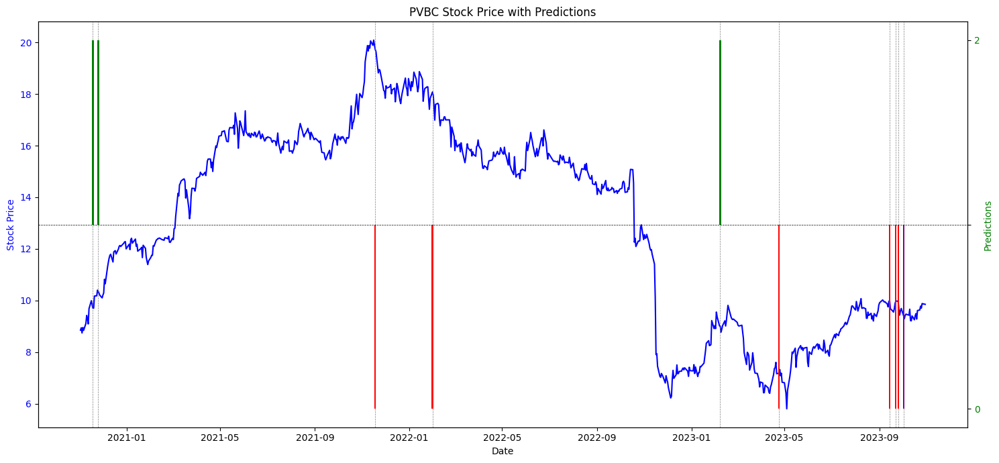

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.602 0.177 0.221]]
[*********************100%%**********************]  1 of 1 completed


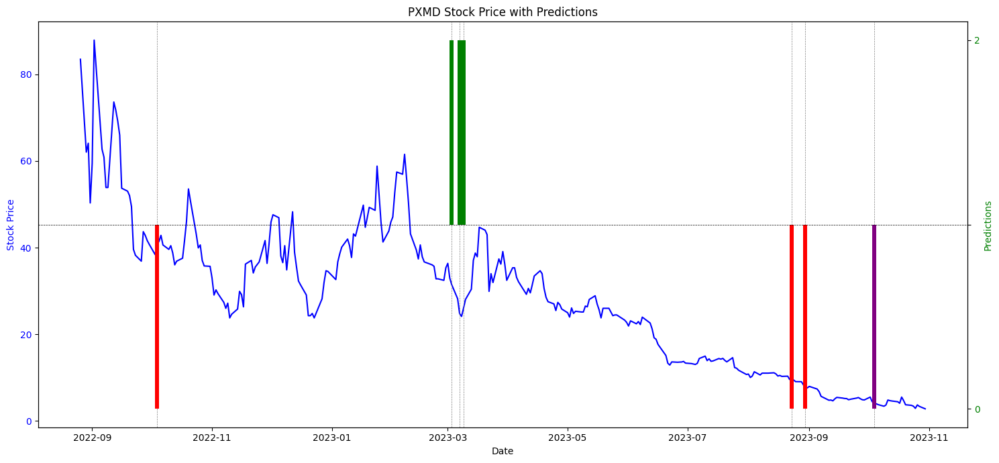

[[0.257 0.566 0.177]]
[*********************100%%**********************]  1 of 1 completed
[[0.56 0.26 0.18]]
[*********************100%%**********************]  1 of 1 completed


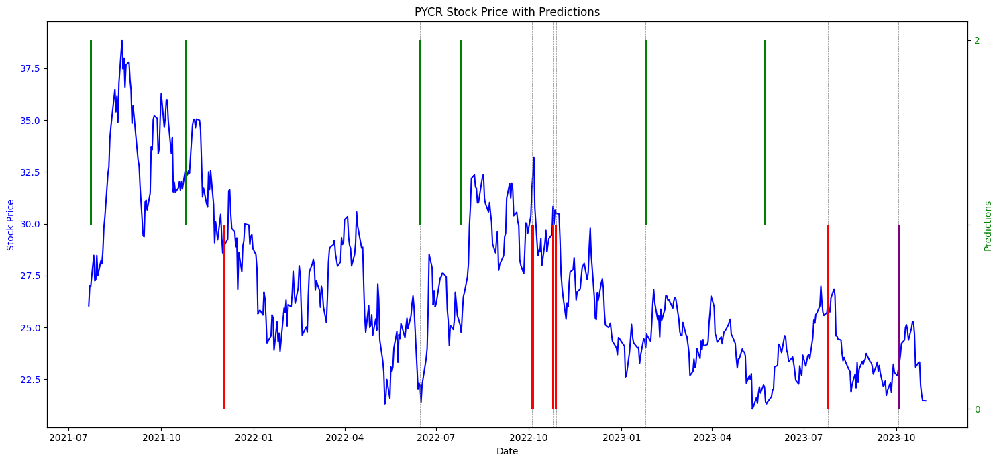

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.302 0.552 0.146]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.569 0.153 0.278]]
[*********************100%%**********************]  1 of 1 completed


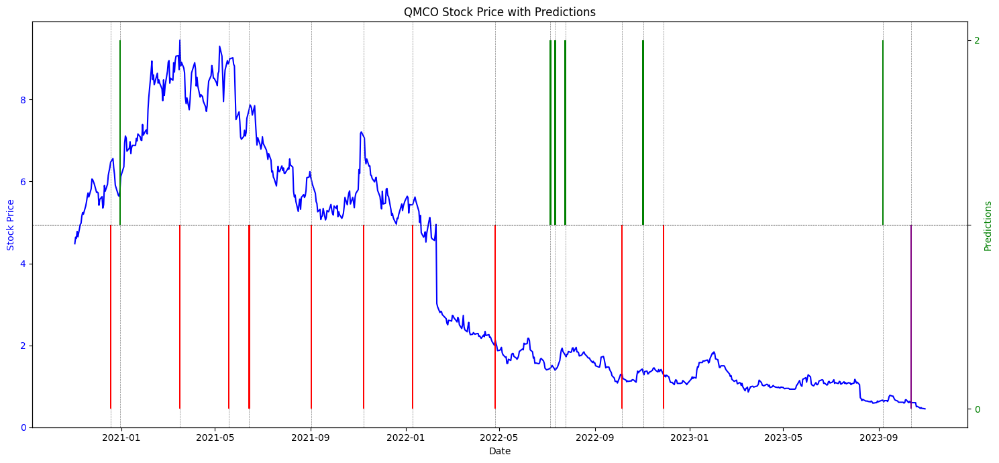

[*********************100%%**********************]  1 of 1 completed
[[0.224 0.554 0.222]
 [0.228 0.563 0.209]
 [0.209 0.597 0.194]
 [0.209 0.591 0.2  ]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.265 0.585 0.15 ]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for RACYU. Skipping...
[*********************100%%**********************]  1 of 1 completed


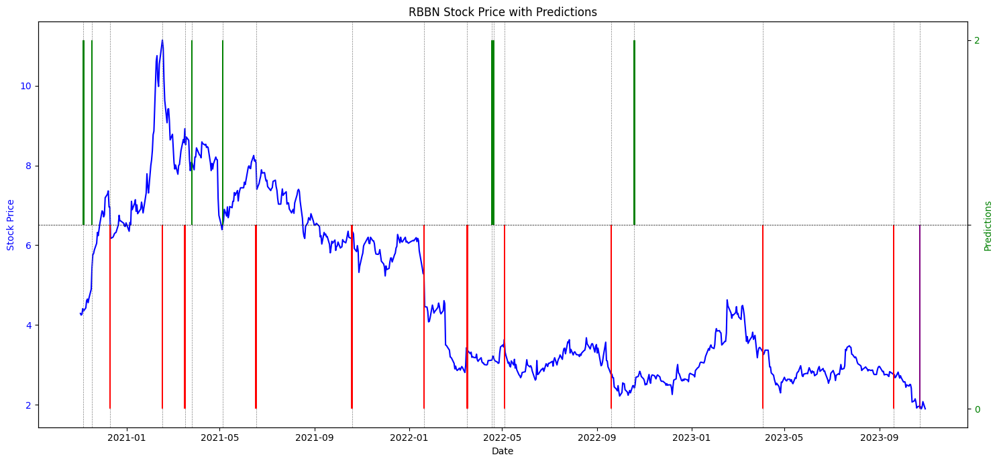

[[0.233 0.642 0.125]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for NOVVU. Skipping...
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.725 0.169 0.106]]
[*********************100%%**********************]  1 of 1 completed


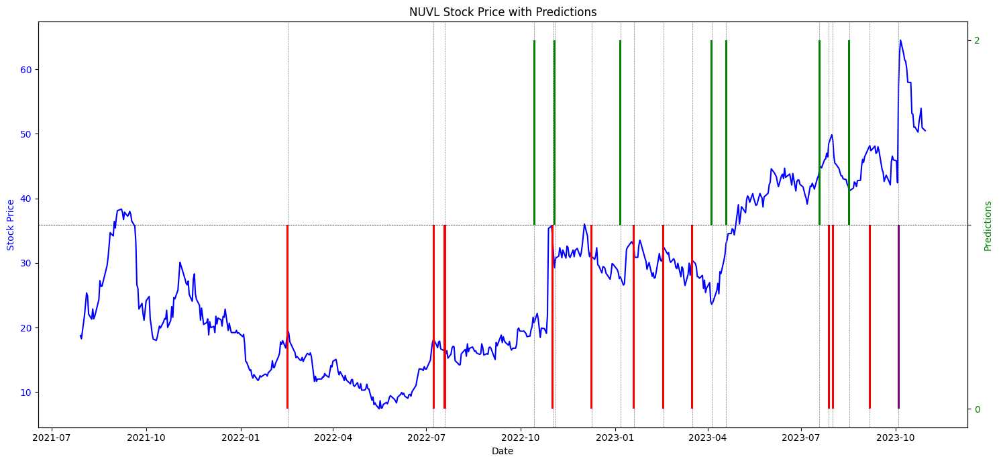

In [ ]:
import time
import yfinance as yf
import numpy as np
import matplotlib.pyplot as plt
plotted_bets = []

def plot_tickers_with_predictions_updated(data, best_rf, X_train_encoded,start):
    tics = data['Ticker'].unique()[start:]
    for tic in tics:
        try:
            ticker_data = data[data["Ticker"] == tic].copy()

            ticker_data_before = ticker_data[pd.to_datetime(ticker_data["Reported_Date"]) <= pd.Timestamp("2023-10-01")].drop(columns=columns_to_drop)
            ticker_data_after = ticker_data[pd.to_datetime(ticker_data["Reported_Date"]) >= pd.Timestamp("2023-10-01")].drop(columns=columns_to_drop)

            ticker_data_before["Label"] = ticker_data_before["Return_2Weeks_After_Report"].apply(create_label)
            ticker_data_before = ticker_data_before.drop(columns=["Return_2Weeks_After_Report"])
            ticker_data_before['Quantity_After'] = ticker_data_before['Quantity_After'].str.replace(',', '').astype(float)
            retained_indices_before = ticker_data_before.index

            if not ticker_data_after.empty:
                ticker_data_after = ticker_data_after.drop(columns=["Return_2Weeks_After_Report"])
                ticker_data_after['Quantity_After'] = ticker_data_after['Quantity_After'].str.replace(',', '').astype(float)
                retained_indices_after = ticker_data_after.index

                ticker_data_after = ticker_data_after.drop(columns=ticker_related_columns + security_type_related_columns + ['Form_Link', 'Ticker', 'Security_Type'])

                X_ticker_after = pd.get_dummies(ticker_data_after, columns=['Transaction', 'Transaction_Type', 'Ownership_Type', 'Futures_Contract_Added'])

                missing_cols_after = set(X_train_encoded.columns) - set(X_ticker_after.columns)
                for col in missing_cols_after:
                    X_ticker_after[col] = 0
                X_ticker_after = X_ticker_after[X_train_encoded.columns]

            ticker_data_before = ticker_data_before.drop(columns=ticker_related_columns + security_type_related_columns + ['Form_Link', 'Ticker', 'Security_Type'])

            X_ticker_before = pd.get_dummies(ticker_data_before.drop(columns=["Label"]), columns=['Transaction', 'Transaction_Type', 'Ownership_Type', 'Futures_Contract_Added'])

            missing_cols_before = set(X_train_encoded.columns) - set(X_ticker_before.columns)
            for col in missing_cols_before:
                X_ticker_before[col] = 0
            X_ticker_before = X_ticker_before[X_train_encoded.columns]

            y_ticker_pred_before = best_rf.predict(X_ticker_before)

            probs_before = best_rf.predict_proba(X_ticker_before)
            mask_before = (probs_before.max(axis=1) >= 0.9)
            y_ticker_pred_before = y_ticker_pred_before[mask_before]
            retained_indices_before = retained_indices_before[mask_before]

            if not ticker_data_after.empty:

                y_ticker_pred_after = best_rf.predict(X_ticker_after)

                probs_after = best_rf.predict_proba(X_ticker_after)
                mask_after = (probs_after.max(axis=1) >= 0.55)

                y_ticker_pred_after = y_ticker_pred_after[mask_after]

                print(probs_after[mask_after])
                retained_indices_after = retained_indices_after[mask_after]

                ticker_data_combined = pd.concat([ticker_data.loc[retained_indices_before], ticker_data.loc[retained_indices_after]])
                y_ticker_pred_combined = np.concatenate([y_ticker_pred_before, y_ticker_pred_after])
            else:
                ticker_data_combined = ticker_data.loc[retained_indices_before]
                y_ticker_pred_combined = y_ticker_pred_before

            ticker_data_combined["Predicted_Label"] = y_ticker_pred_combined

            agg_predictions = ticker_data_combined.groupby('Reported_Date')['Predicted_Label'].agg(lambda x: x.value_counts().idxmax()).reset_index()
            agg_predictions['Reported_Date'] = pd.to_datetime(agg_predictions['Reported_Date'])
            agg_predictions['Prediction_Y'] = agg_predictions['Predicted_Label'].apply(lambda x: 1 if x == 2 else (-1 if x == 0 else 0))

            stock_data = yf.download(tic, start='2020-11-01')
            merged_data = stock_data.reset_index().merge(agg_predictions, left_on='Date', right_on='Reported_Date', how='left')
            if merged_data['Close'].isna().all() or merged_data['Prediction_Y'].isna().all():
                print(f"No stock data or predictions available for {tic}. Skipping...")
                continue

            if not any([(date >= pd.Timestamp("2023-10-02") and val in [-1, 1]) for val, date in zip(merged_data['Prediction_Y'], merged_data['Date'])]):
                continue

            fig, ax1 = plt.subplots(figsize=(15,7))
            ax1.plot(merged_data['Date'], merged_data['Close'], color='blue', label='Stock Price')
            ax1.set_xlabel('Date')
            ax1.set_ylabel('Stock Price', color='blue')
            ax1.tick_params(axis='y', labelcolor='blue')

            for date, pred in zip(merged_data['Date'], merged_data['Prediction_Y']):
                if pred in [-1, 1]:  # -1 corresponds to label 0 and 1 corresponds to label 2
                    ax1.axvline(date, color='gray', linestyle='--', linewidth=0.5)

            colors = ['purple' if date >= pd.Timestamp("2023-10-01") else ('red' if val == -1 else 'green') for val, date in zip(merged_data['Prediction_Y'], merged_data['Date'])]

            ax2 = ax1.twinx()
            ax2.bar(merged_data['Date'], merged_data['Prediction_Y'], color=colors, width=2, label='Predictions')
            ax2.set_ylabel('Predictions', color='green')
            ax2.tick_params(axis='y', labelcolor='green')
            ax2.set_yticks([-1, 0, 1])
            ax2.set_yticklabels(['0', '', '2'])
            ax2.axhline(0, color='black', linestyle='--', linewidth=0.5)

            plt.title(tic + ' Stock Price with Predictions')
            fig.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error with: {tic}. Error: {e}")
            time.sleep(5)
plot_tickers_with_predictions_updated(data, best_rf, X_train_encoded,0)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.137 0.735 0.128]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.118 0

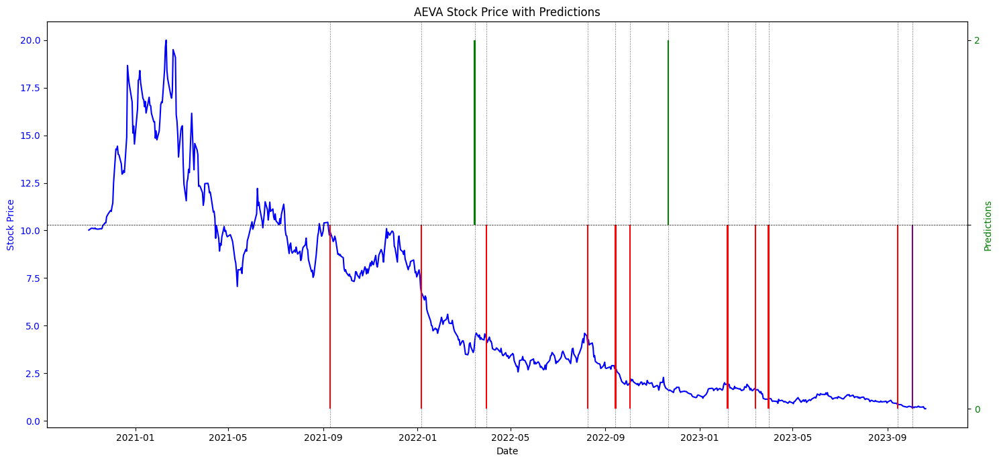

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: AFGD. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
Error with: AFGE. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN nativel

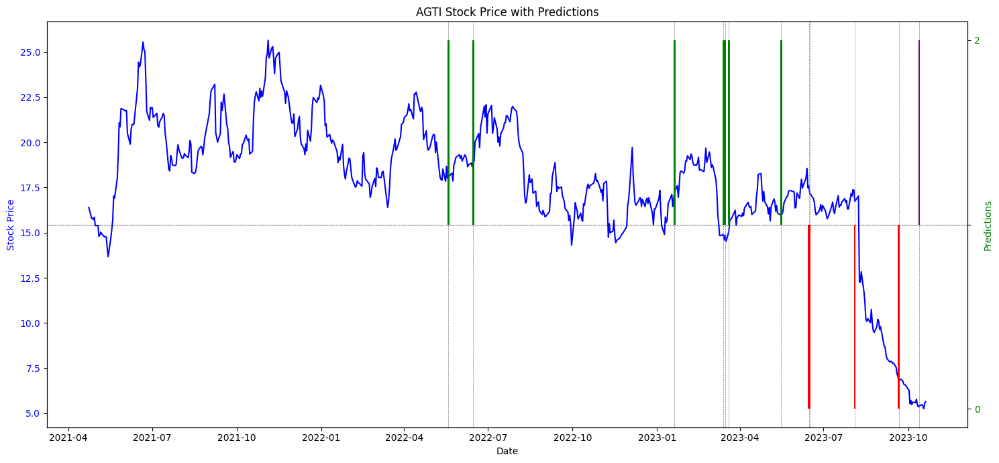

[[0.214 0.616 0.17 ]
 [0.191 0.591 0.218]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for AIG. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 c

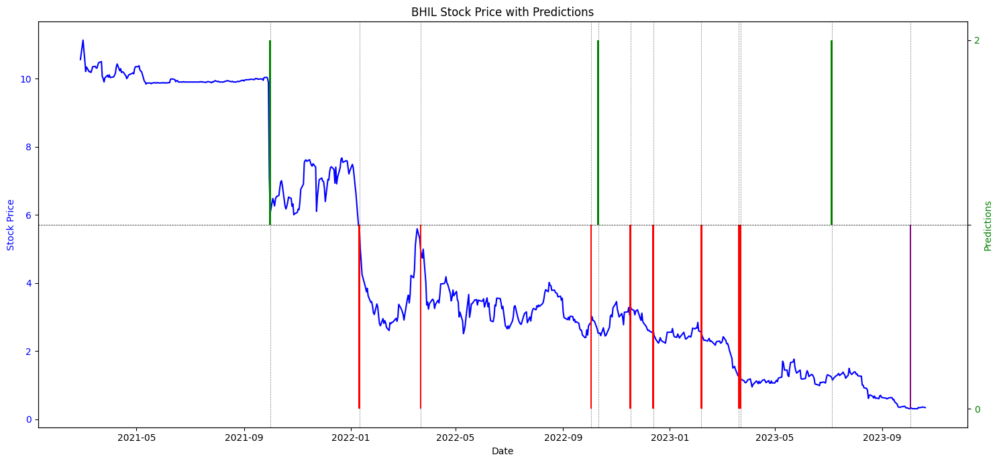

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.177 0.629 0.194]
 [0.188 0.641 0.171]
 [0.174 0.653 0.173]
 [0.28  0.559 0.161]
 [0.245 0.571 0.184]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.348 0.598 0.054]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.26642857 0.60847619 0.12509524]

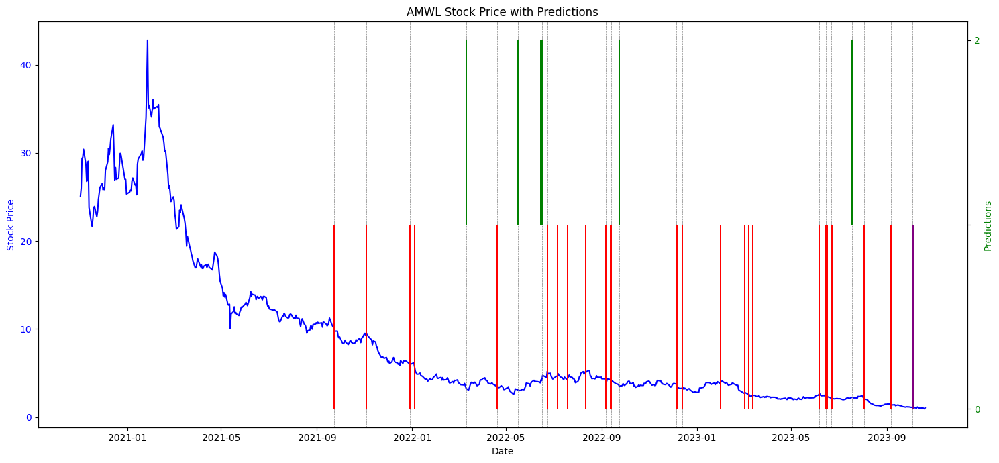

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions av

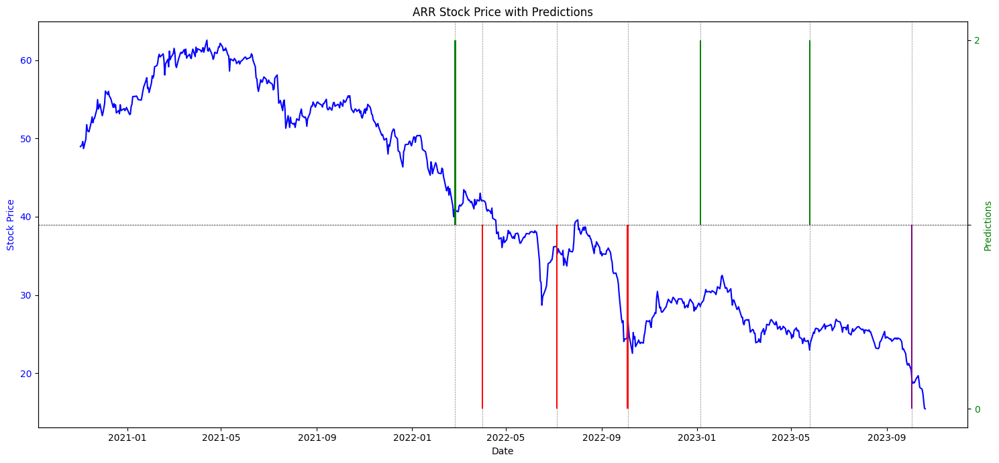

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
Error with: ASBA. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*********************

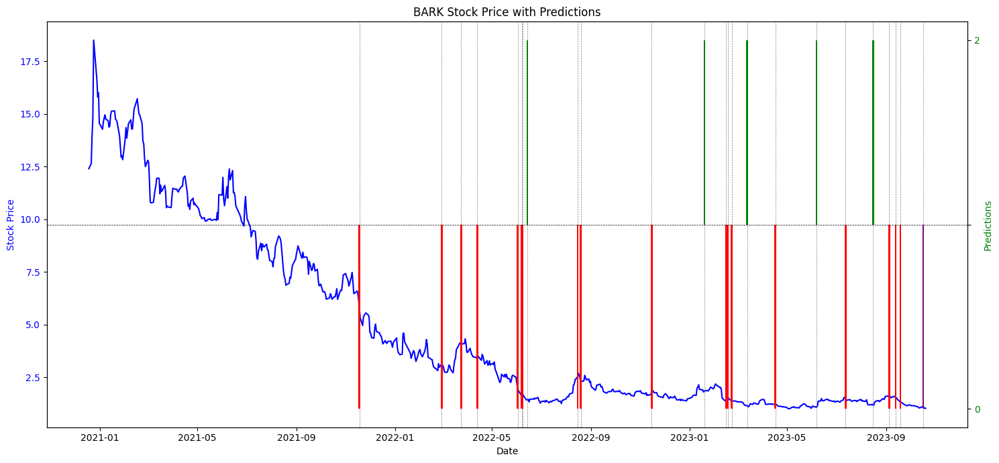

[*********************100%%**********************]  1 of 1 completed
Error with: BATT. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************] 

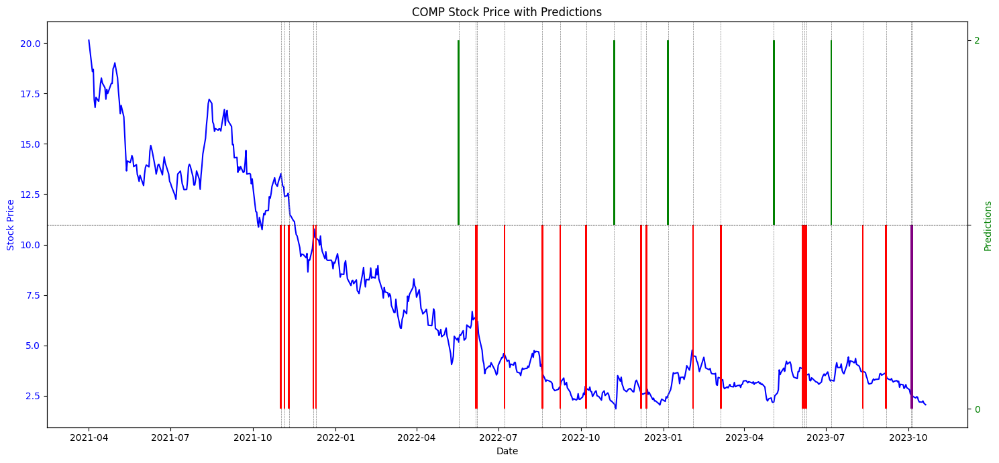

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.219 0.696 0.085]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.214 0.571 0.215]]
[*********************100%%**********************]  1 of 1 completed
[[0.238 0.565 0.197]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.21710811 0.62175676 0.16113514]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for CPHI. Skipping...
[[0.20625 0.67375 0.12   ]]
[*********************100%%****************

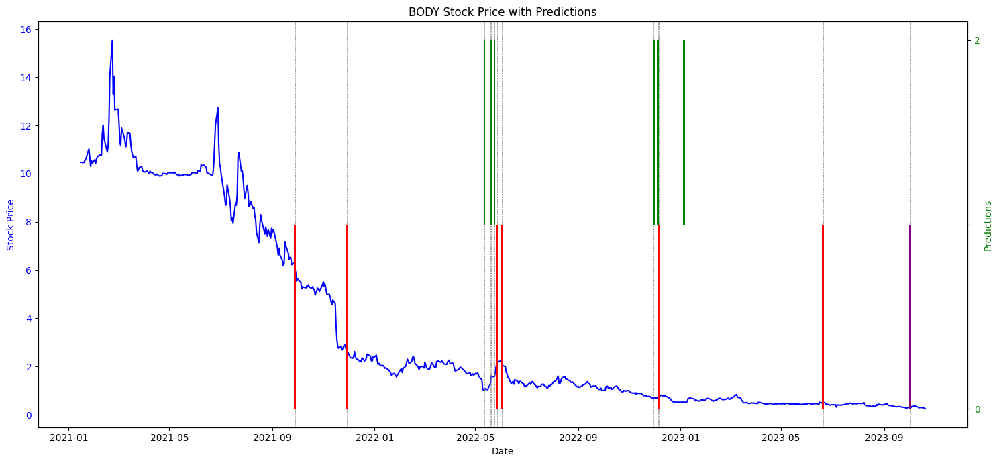

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.238 0.607 0.155]]
[*********************100%%**********************]  1 of 1 completed
[[0.313      0.584      0.103     ]
 [0.2858513  0.55101141 0.16313729]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.274 0.567 0.159]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************

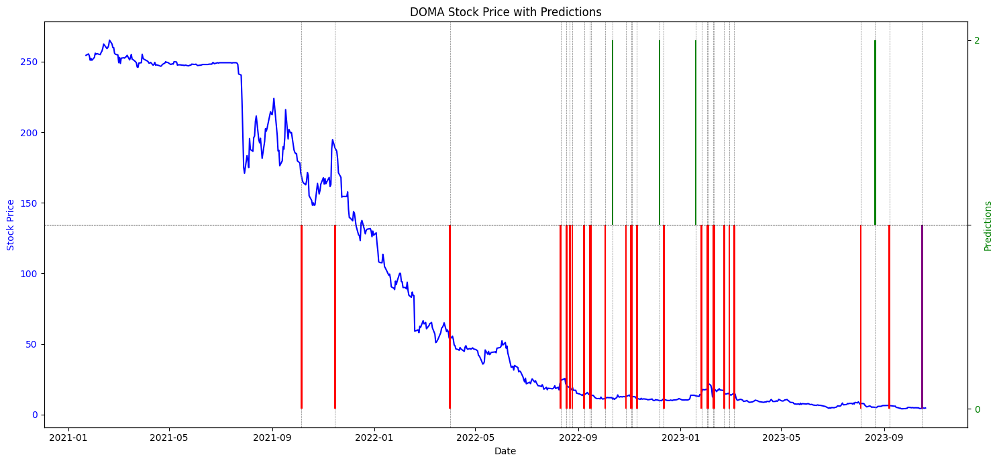

[[0.175 0.649 0.176]
 [0.24  0.691 0.069]]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.20826982 0.63239636 0.15933382]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*******

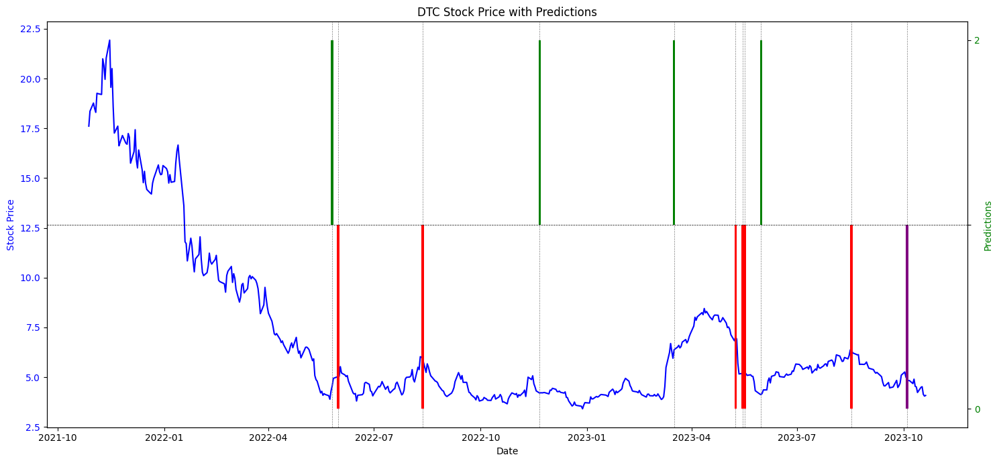

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100

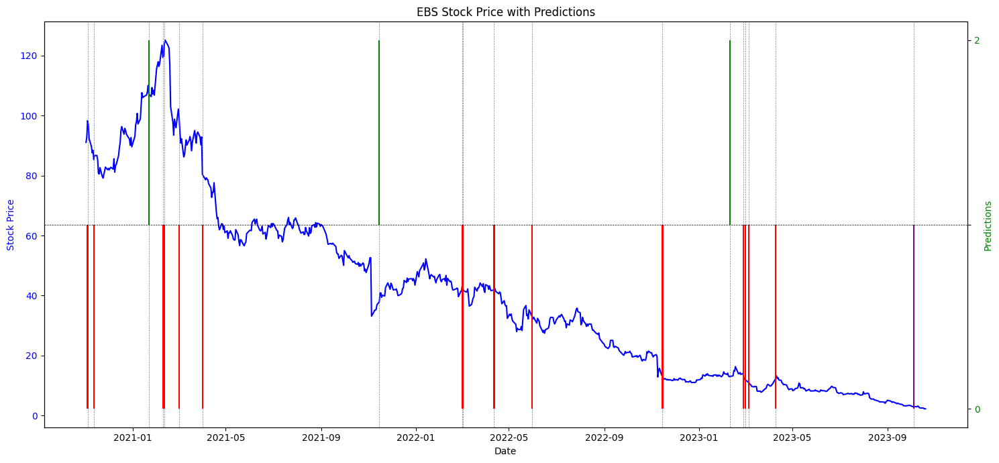

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.306 0.561 0.133]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for EE. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.129 0.678 0.193]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 comp

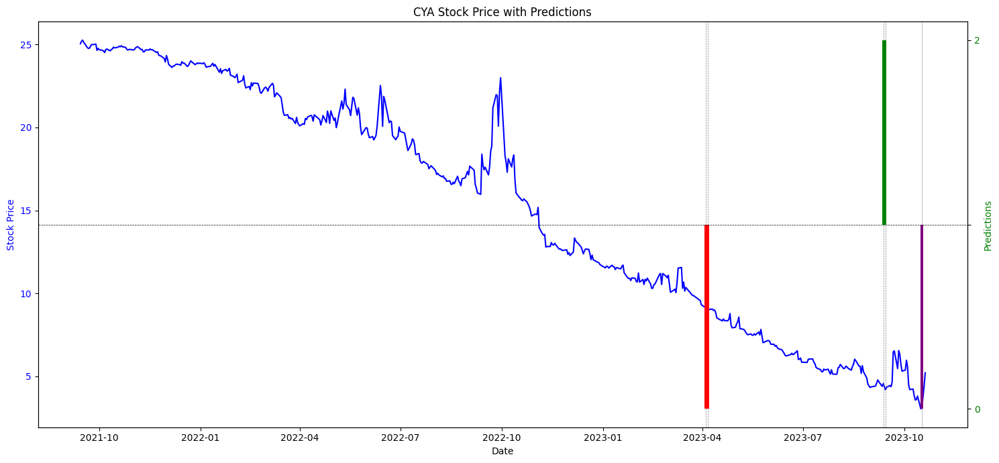

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.675 0.149 0.176]]
[*********************100%%**********************]  1 of 1 completed


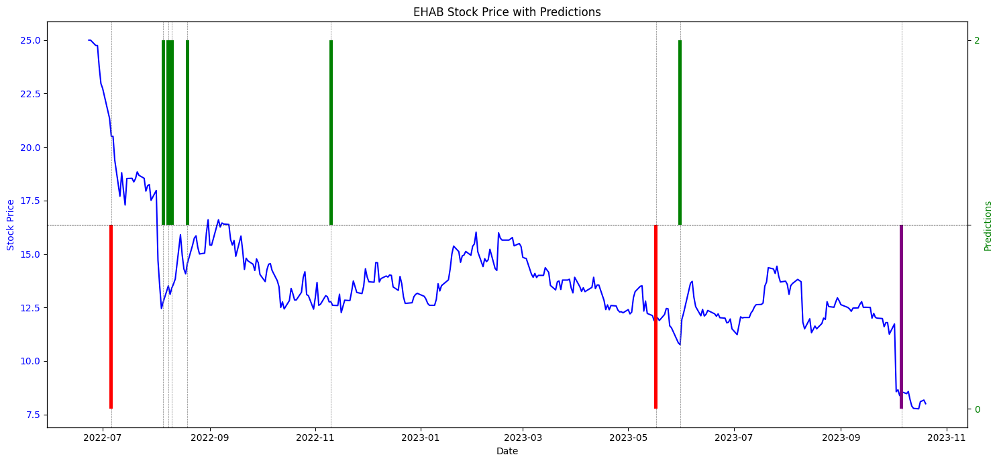

[[0.215 0.594 0.191]
 [0.226 0.562 0.212]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%******************

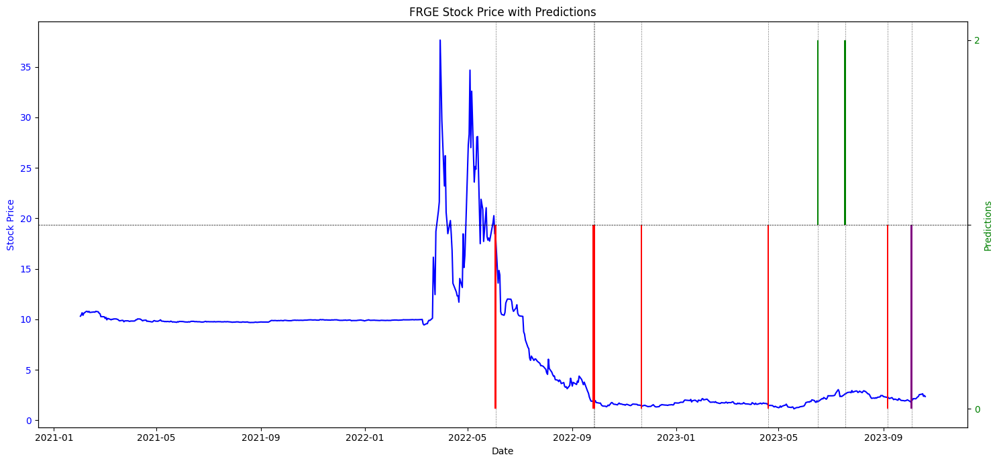

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*

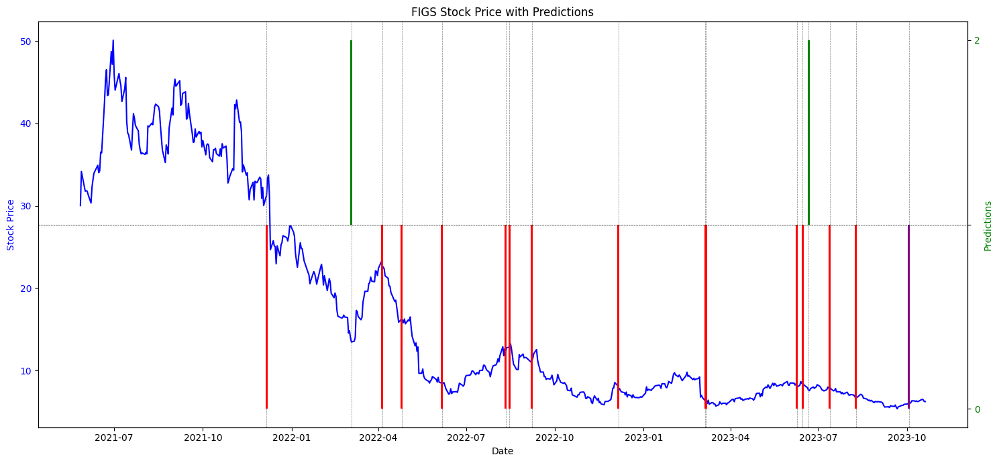

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.278 0.608 0.114]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[********

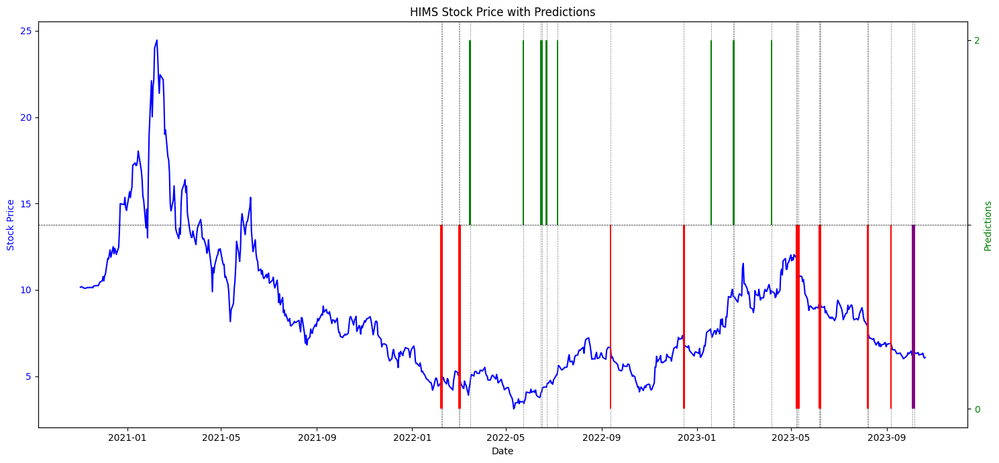

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%****

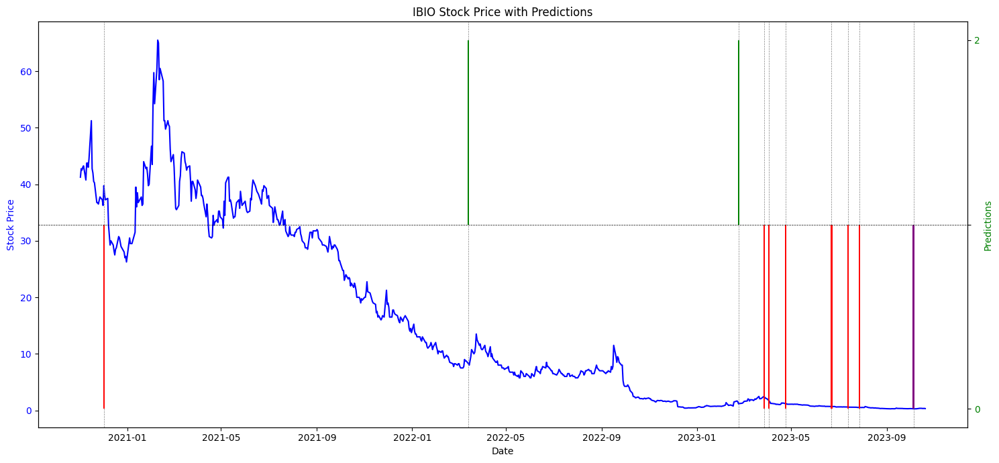

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: IE. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it 

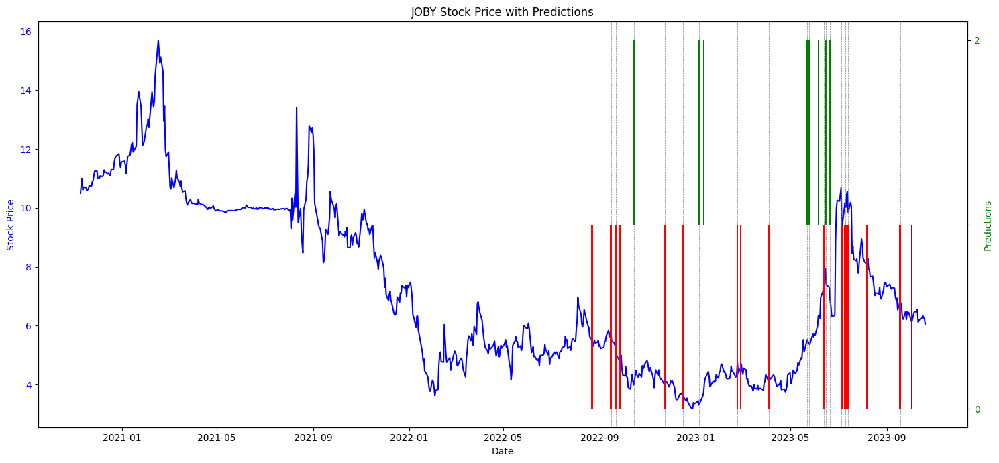

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.605 0.26  0.135]]
[*********************100%%**********************]  1 of 1 completed


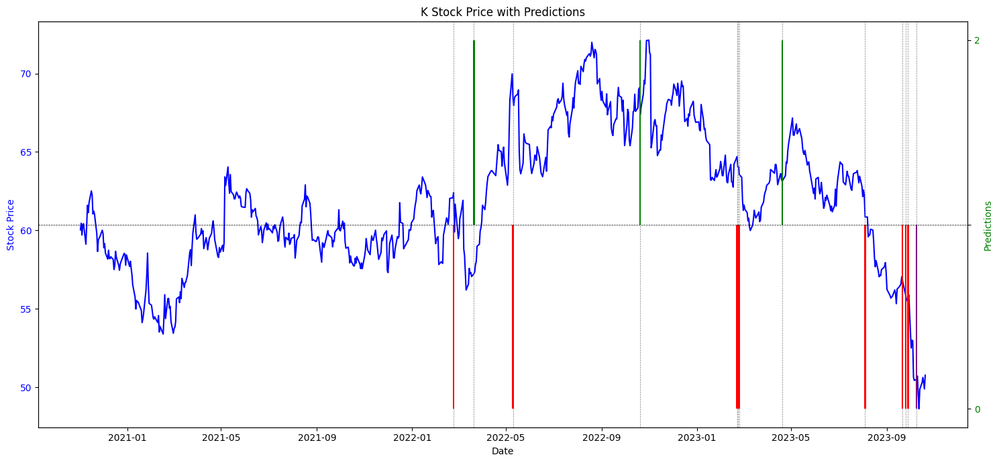

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
Error with: KEM. Error: Found array with 0 sample(s) (shape=(0, 54)) while a minimum of 1 is required by RandomForestClassifier.
[[0.225 0.644 0.131]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[***********

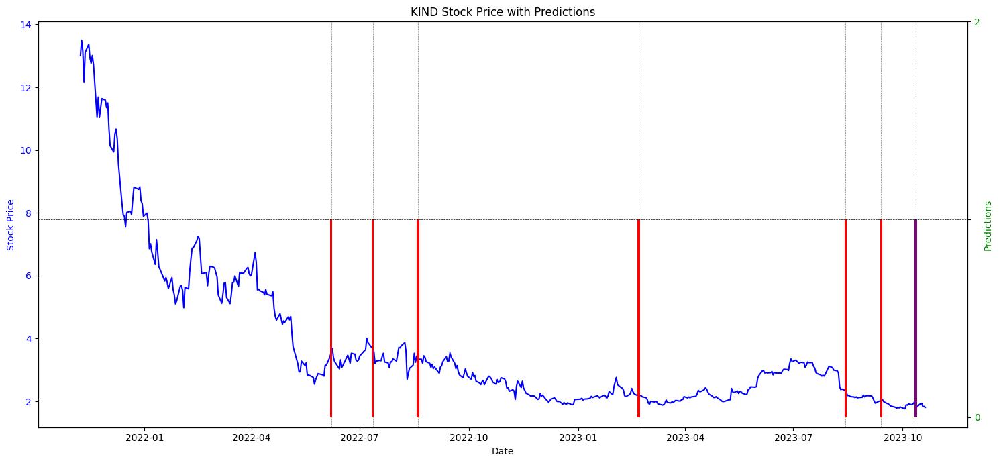

[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.277 0.596 0.127]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.24006667 0.64793333 0.112     ]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%***********

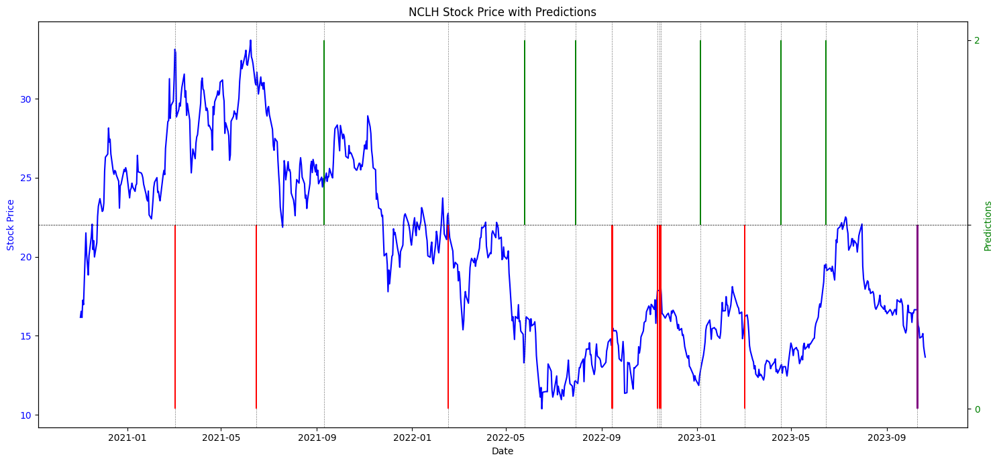

[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.246 0.55  0.204]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.049 0.903 0.048]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**************

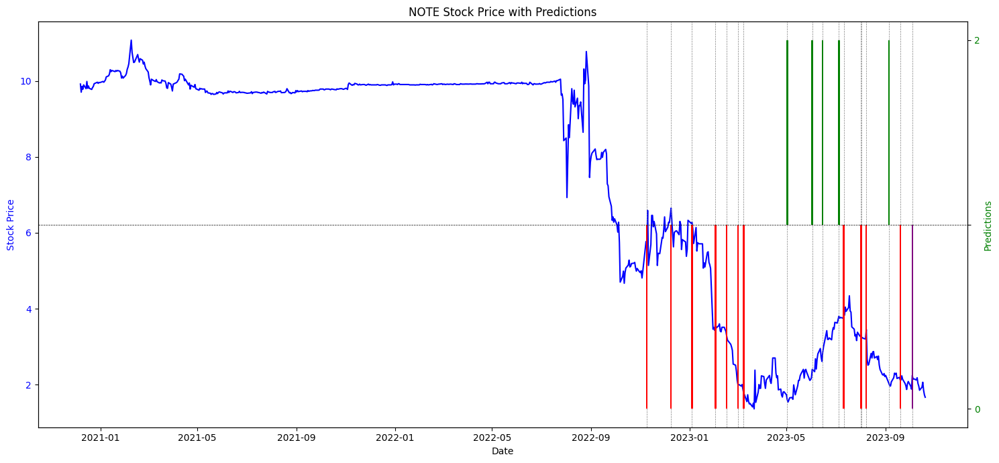

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.272   0.578   0.15   ]
 [0.24225 0.6205  0.13725]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%***************

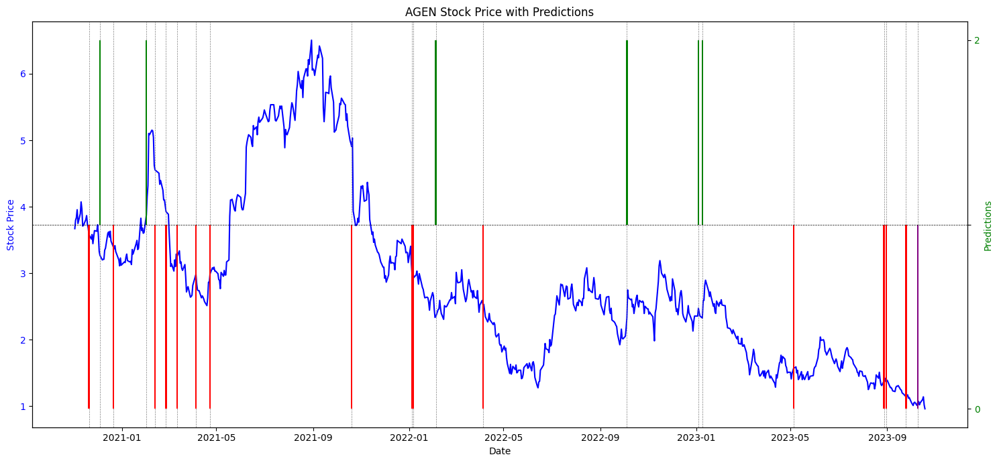

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.58  0.204 0.216]]
[*********************100%%**********************]  1 of 1 completed


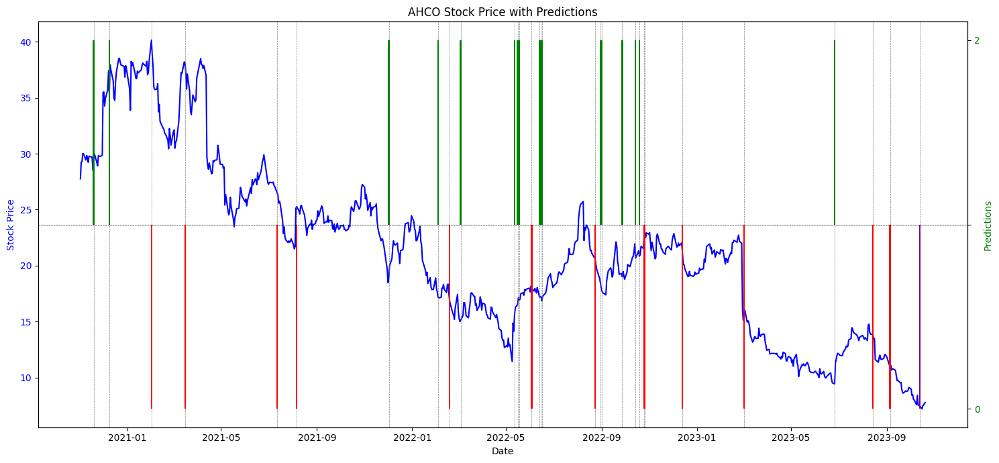

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for AIBBU. Skipping...
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for AIMAU. Skipping...
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.607 0.124 0.269]]
[*********************100%%**********************]  1 of 1 completed


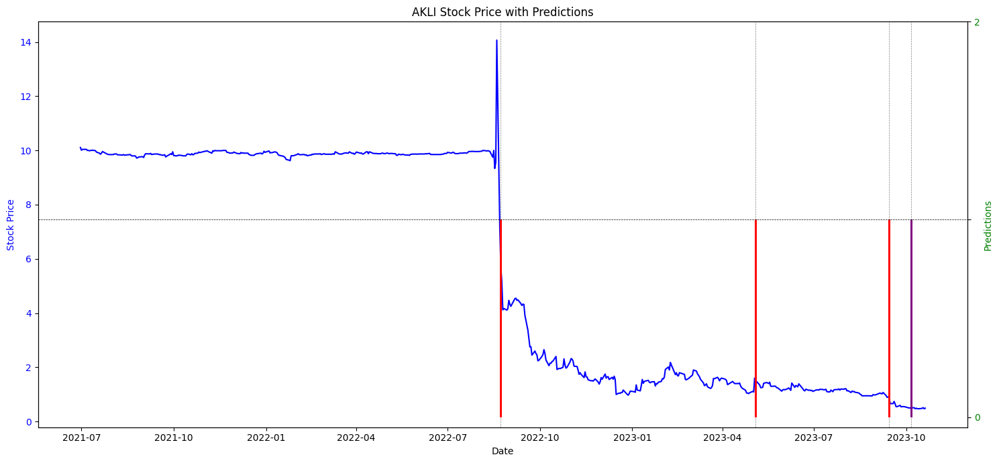

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.282 0.551 0.167]]
[*********************100%%**********************]  1 of 1 complet

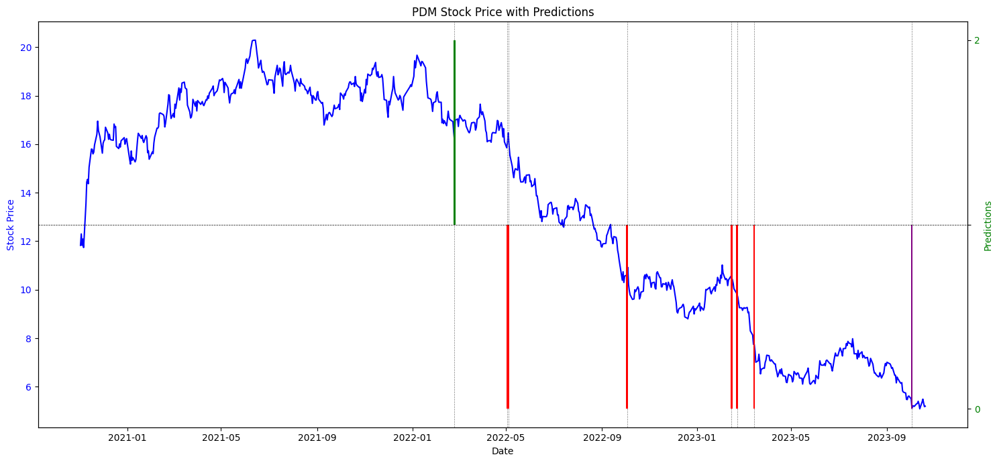

Error with: PEAK. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: PEN. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively

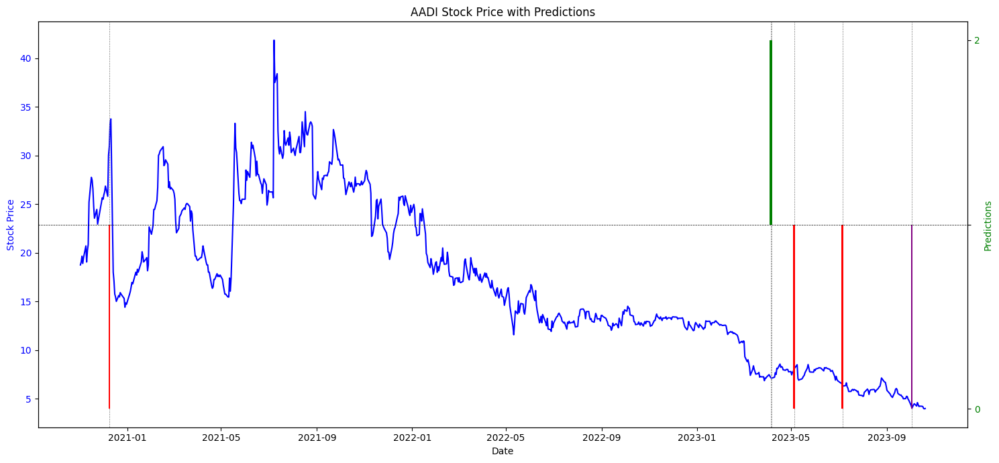

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: AAON. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*********************

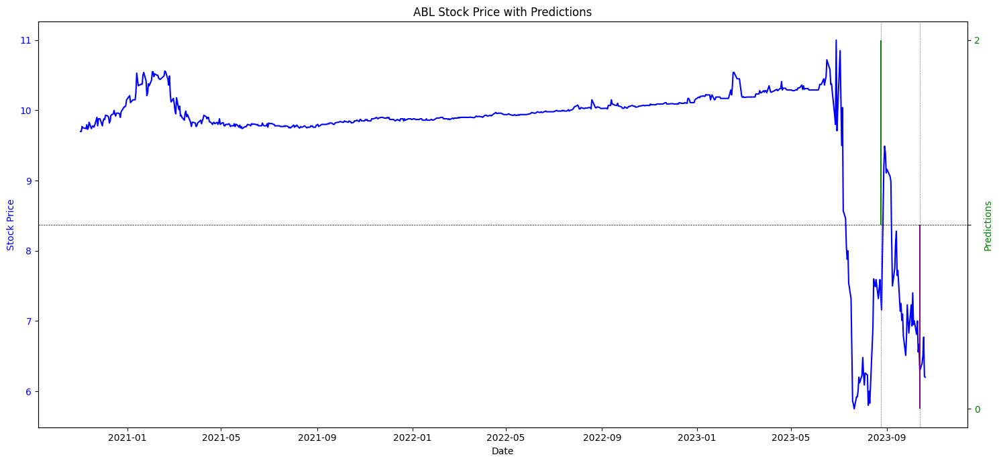

[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ACAC. Skipping...
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ACACU. Skipping...
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for ACBA. Skipping...
[*********************100%%**********************]  1 of 1 completed
[[0.575 0.127 0.298]]
[*********************100%%**

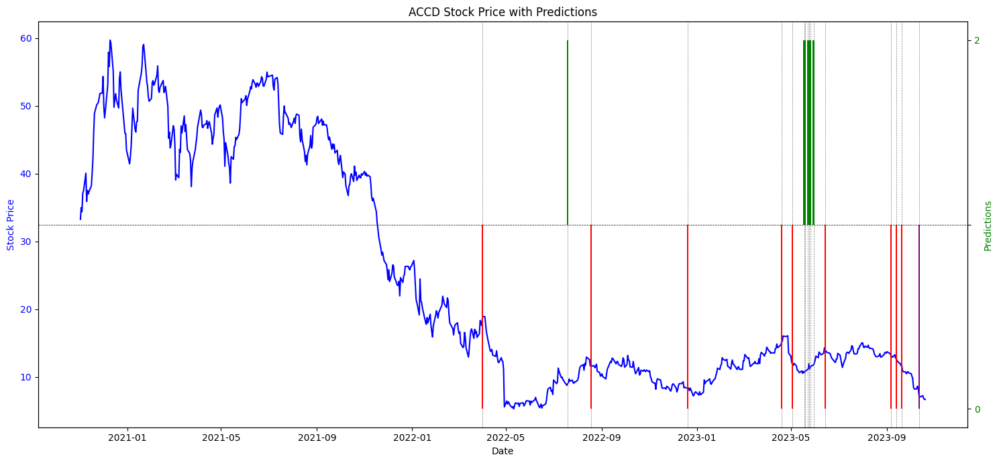

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.568 0.142 0.29 ]]
[*********************100%%**********************]  1 of 1 completed


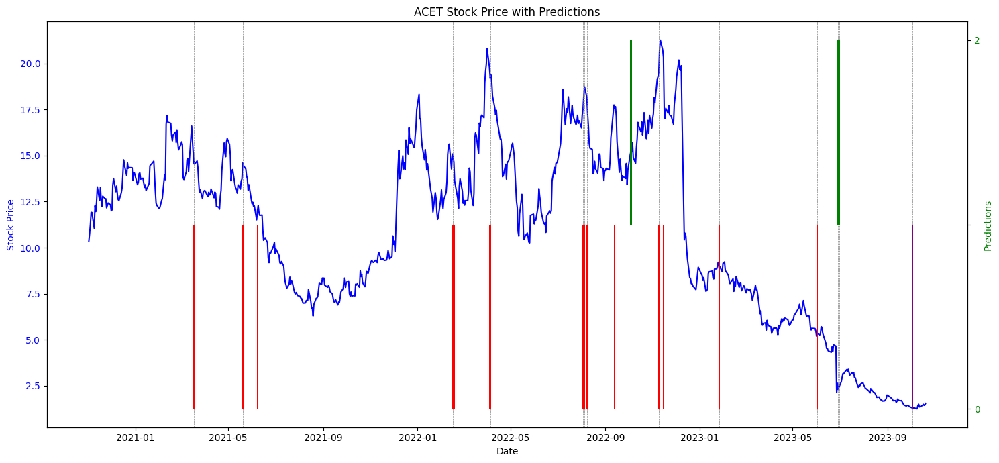

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: ACLS. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a li

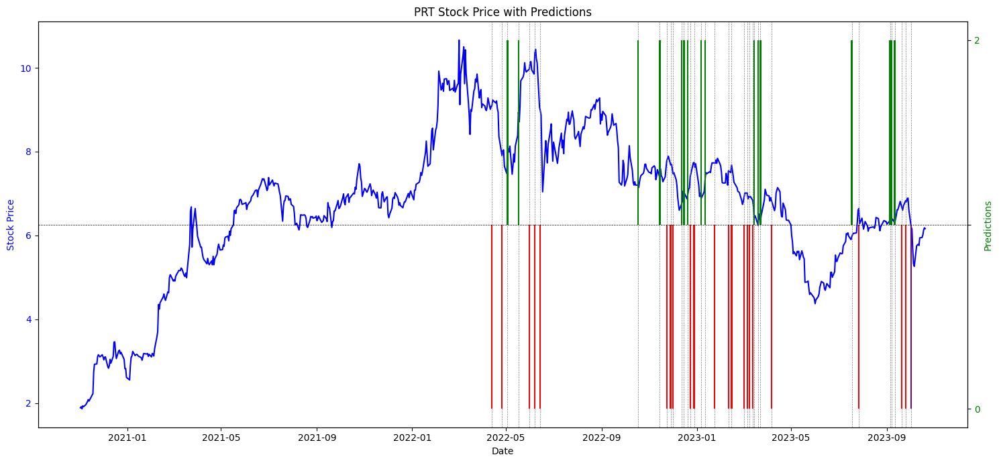

[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.557 0.229 0.214]]
[*********************100%%**********************]  1 of 1 completed


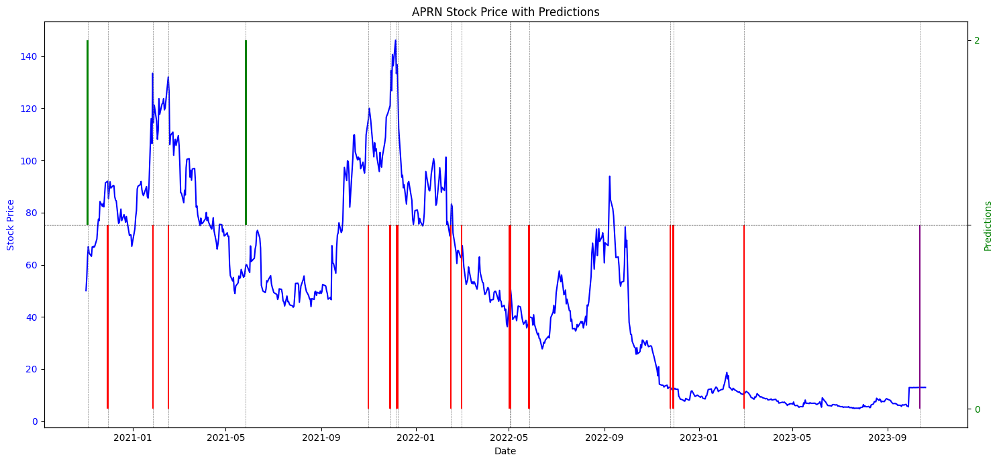

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.691 0.101 0.208]]
[*********************100%%**********************]  1 of 1 completed


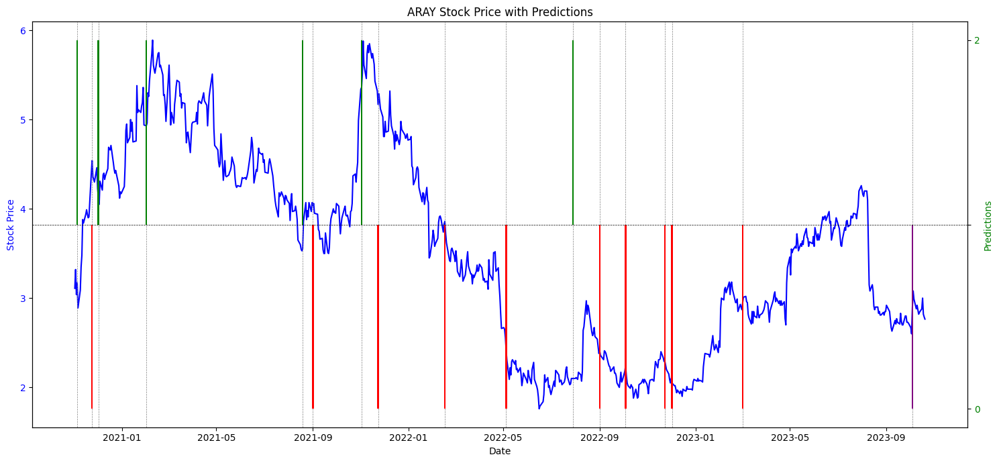

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.326 0.552 0.122]]
[*********************100%%**********************]  1 of 1 completed
[[0.67 0.15 0.18]]
[*********************100%%**********************]  1 of 1 completed


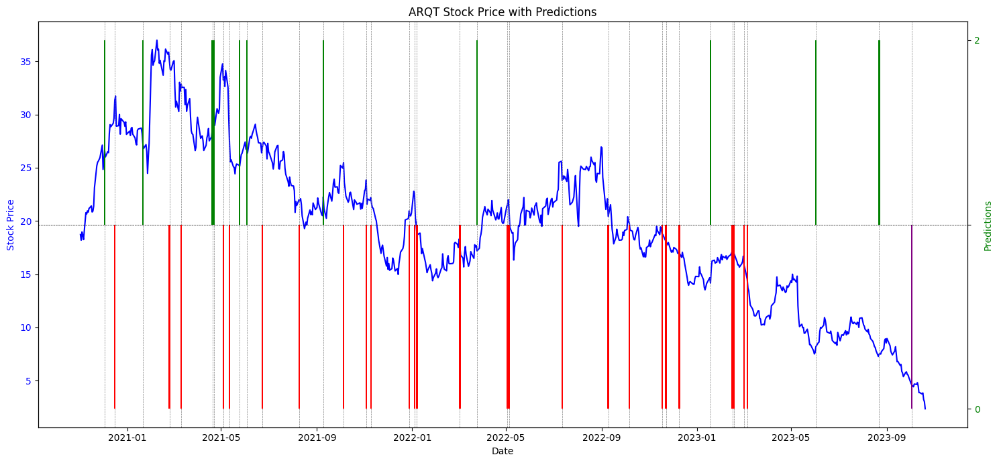

Error with: ARRY. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 

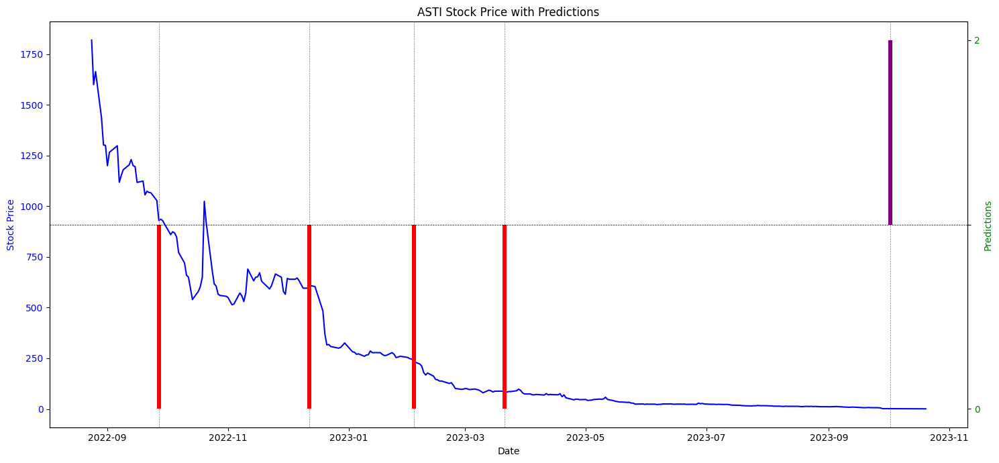

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.362 0.558 0.08 ]
 [0.33  0.553 0.117]]
[*********************100%%**********************]  1 of 1 completed
[[0.578 0.237 0.185]]
[*********************100%%**********************]  1 of 1 completed


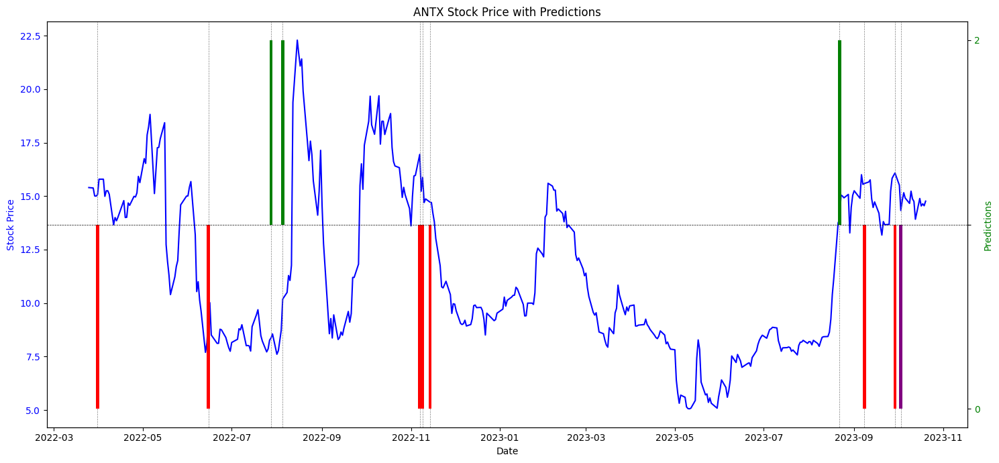

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.28202665 0.62130959 0.09666376]]
[*********************100%%**********************]  1 of 1 completed
Error with: APA. Error: Input X contains NaN.
RandomForestClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values
[*****************

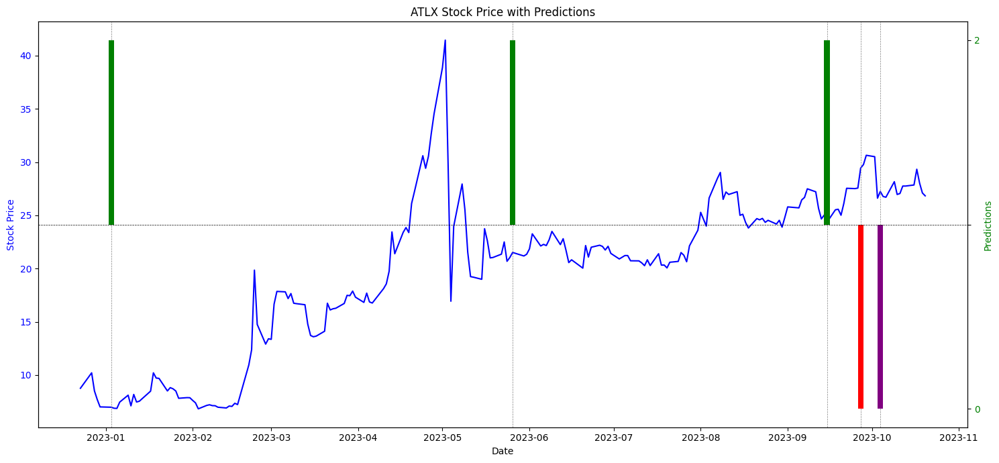

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Error with: ATRO. Error: Found array with 0 sample(s) (shape=(0, 54)) while a minimum of 1 is required by RandomForestClassifier.
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%************

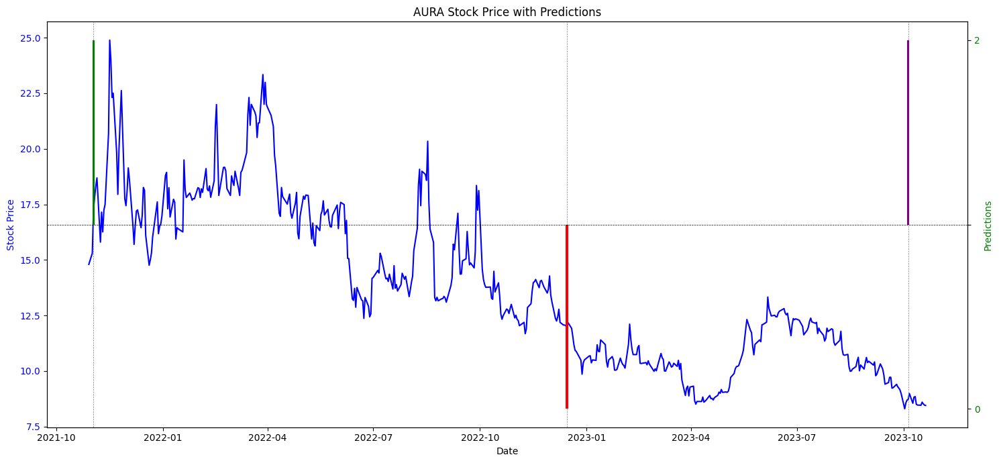

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[[0.239 0.643 0.118]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for AVHI. Skipping...
[*********************100%%**********************]  1 of 1 completed
[[0.258 0.617 0.125]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 compl

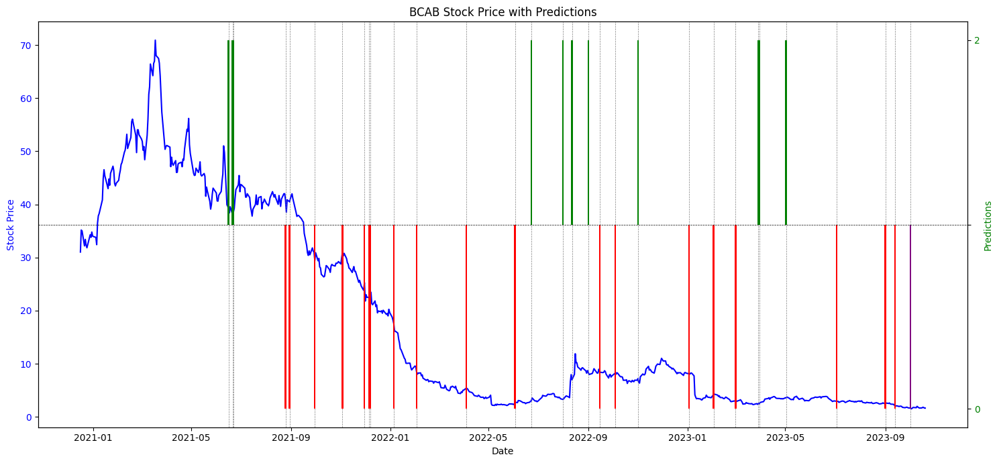

[[0.207625 0.69725  0.095125]]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 complet

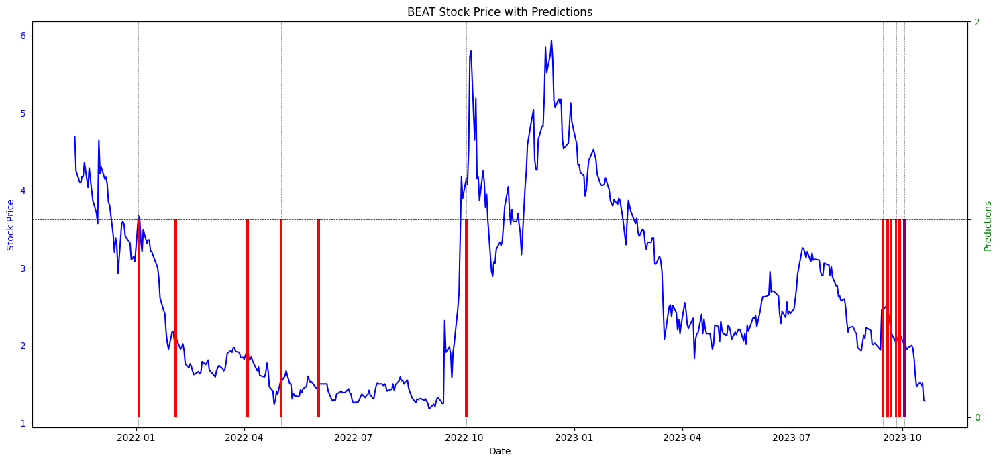

[*********************100%%**********************]  1 of 1 completed
[[0.578 0.271 0.151]]
[*********************100%%**********************]  1 of 1 completed


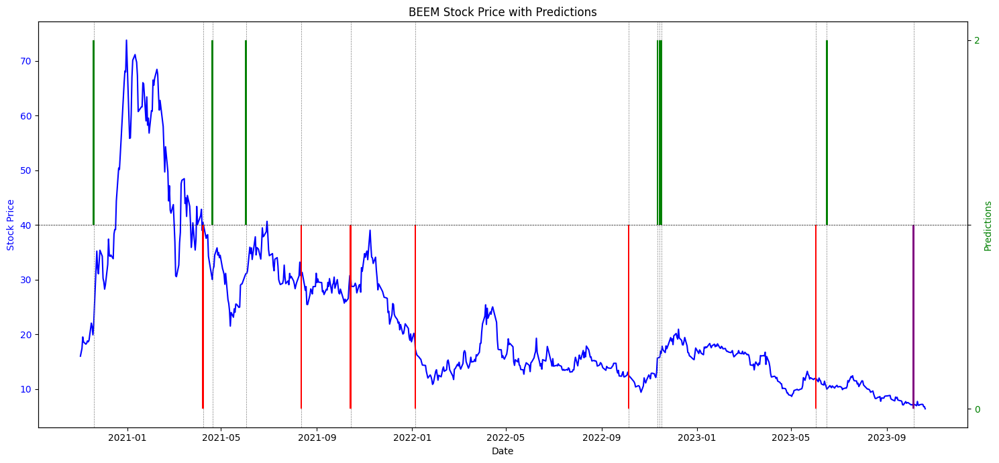

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
No stock data or predictions available for BENF. Skipping...
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[]
[*********************100%%**********************]  1 of 1 completed
[[0.208 0.598 0.194]]
[*********************100%%**********************]  1 of 1 completed
[]
[*************

In [ ]:
import pandas as pd
import yfinance as yf
import numpy as np

def collect_data_for_high_prob_predictions(data, best_rf, X_train_encoded):
    # Create an empty dataframe to store the results
    results_df = pd.DataFrame(columns=['Ticker', 'Date', 'X_train', 'y_train'])

    # Iterate over the unique tickers
    tics = data['Ticker'].unique()
    for tic in tics:
        try:
            ticker_data = data[data["Ticker"] == tic].copy()

            # Split the data based on the date
            ticker_data_before = ticker_data[pd.to_datetime(ticker_data["Reported_Date"]) <= pd.Timestamp("2023-10-01")]
            ticker_data_after = ticker_data[pd.to_datetime(ticker_data["Reported_Date"]) >= pd.Timestamp("2023-10-01")]




            ticker_data_before["Label"] = ticker_data_before["Return_2Weeks_After_Report"].apply(create_label)
            ticker_data_before = ticker_data_before.drop(columns=["Return_2Weeks_After_Report"])
            ticker_data_before['Quantity_After'] = ticker_data_before['Quantity_After'].str.replace(',', '').astype(float)
            retained_indices_before = ticker_data_before.index

            if not ticker_data_after.empty:
                ticker_data_after = ticker_data_after.drop(columns=["Return_2Weeks_After_Report"])
                ticker_data_after['Quantity_After'] = ticker_data_after['Quantity_After'].str.replace(',', '').astype(float)
                retained_indices_after = ticker_data_after.index

                ticker_data_after = ticker_data_after.drop(columns=ticker_related_columns + security_type_related_columns + ['Form_Link', 'Ticker', 'Security_Type'])

                X_ticker_after = pd.get_dummies(ticker_data_after, columns=['Transaction', 'Transaction_Type', 'Ownership_Type', 'Futures_Contract_Added'])

                missing_cols_after = set(X_train_encoded.columns) - set(X_ticker_after.columns)
                for col in missing_cols_after:
                    X_ticker_after[col] = 0
                X_ticker_after = X_ticker_after[X_train_encoded.columns]

            ticker_data_before = ticker_data_before.drop(columns=ticker_related_columns + security_type_related_columns + ['Form_Link', 'Ticker', 'Security_Type'])

            X_ticker_before = pd.get_dummies(ticker_data_before.drop(columns=["Label"]), columns=['Transaction', 'Transaction_Type', 'Ownership_Type', 'Futures_Contract_Added'])

            missing_cols_before = set(X_train_encoded.columns) - set(X_ticker_before.columns)
            for col in missing_cols_before:
                X_ticker_before[col] = 0
            X_ticker_before = X_ticker_before[X_train_encoded.columns]

            y_ticker_pred_before = best_rf.predict(X_ticker_before)

            probs_before = best_rf.predict_proba(X_ticker_before)
            mask_before = (probs_before.max(axis=1) >= 0.9)
            y_ticker_pred_before = y_ticker_pred_before[mask_before]
            retained_indices_before = retained_indices_before[mask_before]

            if not ticker_data_after.empty:

                y_ticker_pred_after = best_rf.predict(X_ticker_after)

                probs_after = best_rf.predict_proba(X_ticker_after)
                mask_after = (probs_after.max(axis=1) >= 0.55)

                y_ticker_pred_after = y_ticker_pred_after[mask_after]

                print(probs_after[mask_after])
                retained_indices_after = retained_indices_after[mask_after]

                ticker_data_combined = pd.concat([ticker_data.loc[retained_indices_before], ticker_data.loc[retained_indices_after]])
                y_ticker_pred_combined = np.concatenate([y_ticker_pred_before, y_ticker_pred_after])
            else:
                ticker_data_combined = ticker_data.loc[retained_indices_before]
                y_ticker_pred_combined = y_ticker_pred_before

            ticker_data_combined["Predicted_Label"] = y_ticker_pred_combined

            agg_predictions = ticker_data_combined.groupby('Reported_Date')['Predicted_Label'].agg(lambda x: x.value_counts().idxmax()).reset_index()
            agg_predictions['Reported_Date'] = pd.to_datetime(agg_predictions['Reported_Date'])
            agg_predictions['Prediction_Y'] = agg_predictions['Predicted_Label'].apply(lambda x: 1 if x == 2 else (-1 if x == 0 else 0))

            stock_data = yf.download(tic, start='2020-11-01')
            merged_data = stock_data.reset_index().merge(agg_predictions, left_on='Date', right_on='Reported_Date', how='left')
            if merged_data['Close'].isna().all() or merged_data['Prediction_Y'].isna().all():
                print(f"No stock data or predictions available for {tic}. Skipping...")
                continue

            if not any([(date >= pd.Timestamp("2023-10-02") and val in [-1, 1]) for val, date in zip(merged_data['Prediction_Y'], merged_data['Date'])]):
                continue




            fig, ax1 = plt.subplots(figsize=(15,7))
            ax1.plot(merged_data['Date'], merged_data['Close'], color='blue', label='Stock Price')
            ax1.set_xlabel('Date')
            ax1.set_ylabel('Stock Price', color='blue')
            ax1.tick_params(axis='y', labelcolor='blue')

            for date, pred in zip(merged_data['Date'], merged_data['Prediction_Y']):
                if pred in [-1, 1]:  # -1 corresponds to label 0 and 1 corresponds to label 2
                    ax1.axvline(date, color='gray', linestyle='--', linewidth=0.5)

            colors = ['purple' if date >= pd.Timestamp("2023-10-01") else ('red' if val == -1 else 'green') for val, date in zip(merged_data['Prediction_Y'], merged_data['Date'])]

            ax2 = ax1.twinx()
            ax2.bar(merged_data['Date'], merged_data['Prediction_Y'], color=colors, width=2, label='Predictions')
            ax2.set_ylabel('Predictions', color='green')
            ax2.tick_params(axis='y', labelcolor='green')
            ax2.set_yticks([-1, 0, 1])
            ax2.set_yticklabels(['0', '', '2'])
            ax2.axhline(0, color='black', linestyle='--', linewidth=0.5)

            plt.title(tic + ' Stock Price with Predictions')
            fig.tight_layout()
            plt.show()

            for dataset, indices, y_pred, probs in [(X_ticker_before, retained_indices_before, y_ticker_pred_before, probs_before),
                                                    (X_ticker_after, retained_indices_after, y_ticker_pred_after, probs_after)]:
                mask = (probs.max(axis=1) >= 0.55) & (y_pred != 1)
                high_prob_indices = indices[mask]

                for idx in high_prob_indices:
                    row = {
                        'Ticker': tic,
                        'Date': data.loc[idx, 'Reported_Date'],
                        'X_train': dataset.loc[idx].tolist(),
                        'y_train': y_pred[idx]
                    }
                    results_df = results_df.append(row, ignore_index=True)
                    results_df.to_csv('saved_results.csv')

        except Exception as e:
            print(f"Error with: {tic}. Error: {e}")
            time.sleep(5)
plot_tickers_with_predictions_updated(data, best_rf, X_train_encoded,0)

AMC
[*********************100%%**********************]  1 of 1 completed


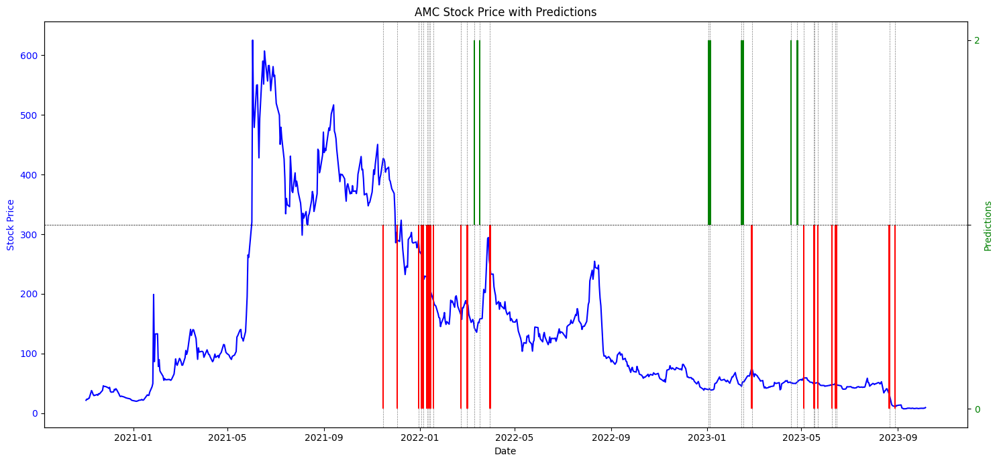

In [ ]:
#individual tickers
def plot_tickers_with_predictions_updated(data, best_rf, X_train_encoded):
    tics = [input()]
    for tic in tics:
        try:
            ticker_data = data[data["Ticker"] == tic].copy()

            ticker_data_cleaned = ticker_data.drop(columns=columns_to_drop)
            ticker_data_before = ticker_data_cleaned[pd.to_datetime(ticker_data["Reported_Date"]) <= pd.Timestamp("2023-09-01")]
            ticker_data_after = ticker_data_cleaned[pd.to_datetime(ticker_data["Reported_Date"]) > pd.Timestamp("2023-09-01")]

            ticker_data_before["Label"] = ticker_data_before["Return_2Weeks_After_Report"].apply(create_label)
            ticker_data_before = ticker_data_before.drop(columns=["Return_2Weeks_After_Report"])
            ticker_data_before['Quantity_After'] = ticker_data_before['Quantity_After'].str.replace(',', '').astype(float)
            retained_indices_before = ticker_data_before.index

            if not ticker_data_after.empty:
                ticker_data_after = ticker_data_after.drop(columns=["Return_2Weeks_After_Report"])
                ticker_data_after['Quantity_After'] = ticker_data_after['Quantity_After'].str.replace(',', '').astype(float)
                retained_indices_after = ticker_data_after.index

                ticker_data_after = ticker_data_after.drop(columns=ticker_related_columns + security_type_related_columns + ['Form_Link', 'Ticker', 'Security_Type'])

                X_ticker_after = pd.get_dummies(ticker_data_after, columns=['Transaction', 'Transaction_Type', 'Ownership_Type', 'Futures_Contract_Added'])

                missing_cols_after = set(X_train_encoded.columns) - set(X_ticker_after.columns)
                for col in missing_cols_after:
                    X_ticker_after[col] = 0
                X_ticker_after = X_ticker_after[X_train_encoded.columns]

            ticker_data_before = ticker_data_before.drop(columns=ticker_related_columns + security_type_related_columns + ['Form_Link', 'Ticker', 'Security_Type'])

            X_ticker_before = pd.get_dummies(ticker_data_before.drop(columns=["Label"]), columns=['Transaction', 'Transaction_Type', 'Ownership_Type', 'Futures_Contract_Added'])

            missing_cols_before = set(X_train_encoded.columns) - set(X_ticker_before.columns)
            for col in missing_cols_before:
                X_ticker_before[col] = 0
            X_ticker_before = X_ticker_before[X_train_encoded.columns]

            y_ticker_pred_before = best_rf.predict(X_ticker_before)

            probs_before = best_rf.predict_proba(X_ticker_before)
            mask_before = (probs_before.max(axis=1) >= 0.9)
            y_ticker_pred_before = y_ticker_pred_before[mask_before]
            retained_indices_before = retained_indices_before[mask_before]

            if not ticker_data_after.empty:
                y_ticker_pred_after = best_rf.predict(X_ticker_after)

                probs_after = best_rf.predict_proba(X_ticker_after)
                mask_after = (probs_after.max(axis=1) >= 0.6)
                y_ticker_pred_after = y_ticker_pred_after[mask_after]
                retained_indices_after = retained_indices_after[mask_after]

                ticker_data_combined = pd.concat([ticker_data.loc[retained_indices_before], ticker_data.loc[retained_indices_after]])
                y_ticker_pred_combined = np.concatenate([y_ticker_pred_before, y_ticker_pred_after])
            else:
                ticker_data_combined = ticker_data.loc[retained_indices_before]
                y_ticker_pred_combined = y_ticker_pred_before

            ticker_data_combined["Predicted_Label"] = y_ticker_pred_combined

            agg_predictions = ticker_data_combined.groupby('Reported_Date')['Predicted_Label'].agg(lambda x: x.value_counts().idxmax()).reset_index()
            agg_predictions['Reported_Date'] = pd.to_datetime(agg_predictions['Reported_Date'])
            agg_predictions['Prediction_Y'] = agg_predictions['Predicted_Label'].apply(lambda x: 1 if x == 2 else (-1 if x == 0 else 0))

            stock_data = yf.download(tic, start='2020-11-01')
            merged_data = stock_data.reset_index().merge(agg_predictions, left_on='Date', right_on='Reported_Date', how='left')
            if merged_data['Close'].isna().all() or merged_data['Prediction_Y'].isna().all():
                print(f"No stock data or predictions available for {tic}. Skipping...")
                continue

            fig, ax1 = plt.subplots(figsize=(15,7))
            ax1.plot(merged_data['Date'], merged_data['Close'], color='blue', label='Stock Price')
            ax1.set_xlabel('Date')
            ax1.set_ylabel('Stock Price', color='blue')
            ax1.tick_params(axis='y', labelcolor='blue')

            for date, pred in zip(merged_data['Date'], merged_data['Prediction_Y']):
                if pred in [-1, 1]:  # -1 corresponds to label 0 and 1 corresponds to label 2
                    ax1.axvline(date, color='gray', linestyle='--', linewidth=0.5)

            colors = ['purple' if date >= pd.Timestamp("2023-09-01") else ('red' if val == -1 else 'green') for val, date in zip(merged_data['Prediction_Y'], merged_data['Date'])]

            ax2 = ax1.twinx()
            ax2.bar(merged_data['Date'], merged_data['Prediction_Y'], color=colors, width=2, label='Predictions')
            ax2.set_ylabel('Predictions', color='green')
            ax2.tick_params(axis='y', labelcolor='green')
            ax2.set_yticks([-1, 0, 1])
            ax2.set_yticklabels(['0', '', '2'])
            ax2.axhline(0, color='black', linestyle='--', linewidth=0.5)

            plt.title(tic + ' Stock Price with Predictions')
            fig.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error with: {tic}. Error: {e}")
            time.sleep(5)
plot_tickers_with_predictions_updated(data, best_rf, X_train_encoded)